  
# CLASSIFICATION MODEL GENERATION AND VALIDATION NOTEBOOK    
#### by Matthew Gordon


In [91]:
import os
import time
import sys
import time
import shutil
from docx import Document

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.signal as sp
import random
from IPython.display import Image # Required to render images in notebook rather than simply link to them

from sklearn import preprocessing
from sklearn import grid_search, metrics, ensemble
from sklearn.cross_validation import cross_val_score, ShuffleSplit
from sklearn import dummy
from sklearn.multiclass import OneVsRestClassifier
import xgboost as xgb

% matplotlib inline

Check whether train and test file lists already exist or the overwrite flag has been set to TRUE.  If so, load the train and test lists into Pandas dataframes otherwise generate new test and training sets.   

In [2]:
overwrite_flag = False # To create a new train and test list split from the master flie, set flag to True 
master_file_loc = '../Data/MasterFileDF.csv'
train_file_loc = '../Data/Train_List.csv'
test_file_loc = '../Data/Test_List.csv'
master_test_split = 0.1 # percent of dataset to set aside for final testing; 0 - 1 = 0 - 100%
test_split = 0.2 # percent of model building dataset set aside for cross validation; 0 - 1 = 0 - 100%

In [3]:
# Check if Train_List.csv & Test_List.csv exists or overwrite flag is TRUE and MasterFileDF exists
if os.path.isfile(train_file_loc) and os.path.isfile(test_file_loc) == False or overwrite_flag == True and os.path.isfile(master_file_loc) == True:
    # Load in the master file list generated by the File Extraction Notebook
    dataset = pd.read_csv(master_file_loc)
    
    # Create a function that outputs a randomised training and test set of data filenames
    def genTestList(df,test_per):
        # test_per is percentage (0-1) of dataset to be set aside for testing; This percent will be taken from each activity
        train_list = pd.DataFrame(columns=[df.columns],dtype=object)
        test_list = pd.DataFrame(columns=[df.columns],dtype=object)

        for name in df.columns:
            num_test = int(df[name].count()*test_per)  # rounds down to whole number, can't have fraction of a dataset
            # create a list of random rows to assign to the test set
            ran_list = random.sample(xrange(0,(df[name].count())), num_test)
            for num in range(0,(df[name].count())):
                if num not in ran_list:
                    train_list.set_value(num,name,df[name][num])
                else:
                    test_list.set_value(num,name,df[name][num])
        train_list.reset_index(drop=True,inplace=True)
        test_list.reset_index(drop=True,inplace=True)

        return train_list,test_list
    
    # create a function to re-sort the dataframe so NaNs are at the bottom of each column.  There is no doubt 
    # an elegant way to do this but the first priority is functional programming
    def sortList(df):
        returnList = pd.DataFrame()
        sortList = []
        for name in df.columns:
            for row in df[name]:
                if isinstance(row, basestring):
                    sortList.append(row)
            sortList = pd.DataFrame(sortList,columns=[name])
            returnList = pd.concat([returnList,sortList],axis=1)
            sortList = []

        return returnList

    # Generate list of train and test sets with a test size of 10%.  This test set will be used for final evaluation
    master_train_list, master_test_list = genTestList(dataset,0.1)

    # Re-sort the training and testing set so NaNs are at the bottom of each column
    master_train_list = sortList(master_train_list)
    master_test_list = sortList(master_test_list)

    # Take the master_train_list and provide a further train/test split of 80/20 which will be used to build & 
    # cross validate the model
    train_list, test_list = genTestList(master_train_list,0.2)
    train_list = sortList(train_list)
    test_list = sortList(test_list)
    print "Train and Test Sets Generated\nTrain and Test Dataframes Created Successfully"
    
# Else if the train and test files BOTH already exist, load them into dataframes
elif os.path.isfile(train_file_loc) and os.path.isfile(test_file_loc) == True:
    train_list = pd.read_csv(train_file_loc)
    test_list = pd.read_csv(test_file_loc)
    print "Train and Test Dataframes Created Successfully"
    
# Otherwise the Master File List doesn't appear to exist so let the script runner know something is not right
else:
    print "Files do not appear to exist, recommend you check the file locations or run the File Extraction Notebook"

Train and Test Dataframes Created Successfully


## Data Manipulation
Process the individual files in organise them for easy use during the feature engineering and model building phases. The x,y,z axis relative to the Right Hand (sensors were all worn on volunteers right wrist) is shown below.

NB: The orientation of the postive axis is not known from the data file description so actual directions may be reveresed to image shown above

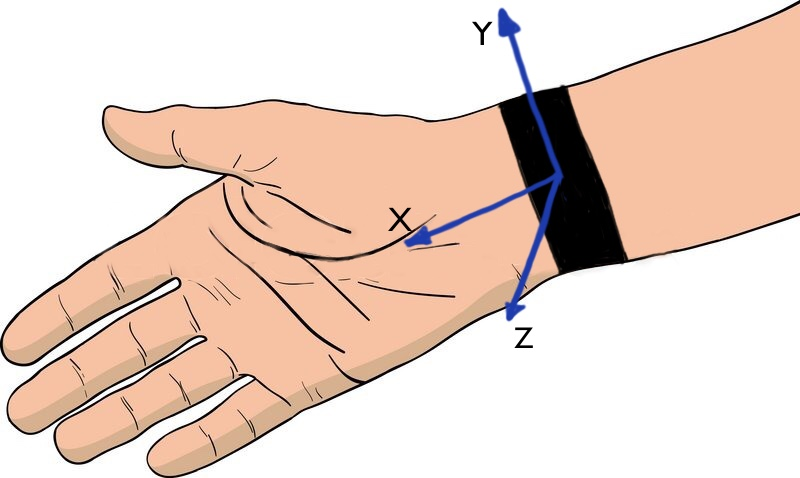

In [4]:
Image('hand.jpg')

In [5]:
# Define a function that ingests the UCI txt file, and converts each x,y,z stream to 'g' based upon the process
# contained in MANUAL.txt
""""
Acceleration data recorded in the dataset are coded according to the following mapping:
[0; +63] = [-1.5g; +1.5g]
The conversion rule to extract the real acceleration value from the coded value is the following:
real_val = -1.5g + (coded_val/63)*3g
"""""
def convertAccel(filepath):
    # open the file
    df = pd.read_csv(filepath,sep=' ',names = ['x','y','z'],header=None)
    # convert each value to gravity using equation then convert to ms-2
    df = df.applymap(lambda x: (-1.5 + (x/63.0)*3)*9.80665)
    # apply a median filter to the data to smooth out some of the noise
    window = 3
    x = sp.medfilt(df.x, kernel_size=window)
    y = sp.medfilt(df.y, kernel_size=window)
    z = sp.medfilt(df.x, kernel_size=window)
    # Apply a butterworth low pass filter
    N  = 5    # Filter order
    Wn = 0.1 # Cutoff frequency
    B, A = sp.butter(N, Wn, output='ba')

    # Second, apply the filter
    x = sp.filtfilt(B,A, x)
    y = sp.filtfilt(B,A, y)
    z = sp.filtfilt(B,A, z)
    # Extract body accelerations
    bx = df.x - x
    by = df.y - y
    bz = df.z - z
    
    # Assign acceleration values to dataframe
    df.x = x
    df.y = y
    df.z = z
    df['bx'] = bx
    df['by'] = by
    df['bz'] = bz
    
    return df
    

In [6]:
# function to creates a list of tuples with format (filename,[accelerometer data],activity)
def createTuple(filename):
    filepath = '../Raw_Data/' + str(filename)  # create full file path to location of file in Data folder
    df = convertAccel(filepath)  # return a 3 column dataframe of the converted x,y,z accelerations
    activity = str(filename).split("-")[7]  # extract the activity name from the filename string
    output = (filename,(df.x,df.y,df.z,df.bx,df.by,df.bz),activity)
    return output
    

In [7]:
# function that loops through a dataframe of filenames and returns a list of tuples, one tuple for each filename
def createDataList(fileDataframe):
    dataList = []  # initialise a new empty list to fill with tuples
    for ADL in fileDataframe.columns:  # loop through each activity column
        for x in range(0,fileDataframe[ADL].count()): # loop through each filename that is a string (stops at NaN)
            summary = createTuple(fileDataframe[ADL][x])  # create the filename summary tuple
            dataList.append(summary)
    return dataList

Create a list of data tuples for the ingested training and test sets imported above

In [8]:
trainList = createDataList(train_list)
testList = createDataList(test_list) 

Output the number of samples for each activity in the training and testing set [ NB: eat soup and eat meat were removed during the data exploration stage ]

In [9]:
print "Training Set\n"
print train_list.count()
print "\nTesting Set\n"
print test_list.count()

Training Set

standup_chair     74
sitdown_chair     72
comb_hair         23
walk              72
descend_stairs    31
drink_glass       72
pour_water        72
liedown_bed       21
getup_bed         73
use_telephone     10
brush_teeth        9
dtype: int64

Testing Set

standup_chair     18
sitdown_chair     18
comb_hair          5
walk              18
descend_stairs     7
drink_glass       18
pour_water        18
liedown_bed        5
getup_bed         18
use_telephone      2
brush_teeth        2
dtype: int64


## Feature Generation

### Define bespoke functions required for feature generation

In [10]:
# function to calculate the root mean square
def rms(x):   
    return np.sqrt(x.dot(x)/x.size) 

In [11]:
# Generate a function to calculate exceedances per second, defined as total number of exceedances in band / total time
def genExceedance(x):
    for row in range(0,len(x)):
        histo = np.histogram(x,bins=15,range=[-15,15])
        counts = histo[0].astype(float)
        counts = counts / (len(x)*(1/32.0))
    return counts

In [12]:
# Calculate the number of zero point crossings (about the mean) the signal makes as indicator of repetition / frequency
def numCrossings(x):   
    # generate a list of the position before a zero point crossing and then calculate the length
    # because some signals may be oscillate about a non-zero value, determine and subtract the mean first
    x_mean = np.mean(x)
    y = [a - x_mean for a in x]
    return len(np.where(np.diff(np.signbit(y)))[0])

In [13]:
def meanAmp(x):
    peakList = []
    valleyList = []
    for pos in range(1,len(x)-1):
        if x[pos-1] < x[pos] > x[pos+1]:
            peakList.append(pos)
        elif x[pos-1] > x[pos] < x[pos+1]:
            valleyList.append(pos)
    peak = [x[i] for i in peakList]
    valley = [x[i] for i in valleyList]
    Amp = [a - b for a, b in zip(peak, valley)]
    return np.mean(Amp)

In [14]:
def avgPeakFrequency(x,freq):
    peakList = []
    for pos in range(1,len(x)-1):
        if x[pos-1] < x[pos] > x[pos+1]:
            peakList.append(pos)
    peak = [x[i] for i in peakList]
    Diff = [a - b for a, b in zip(peak[0::2],peak[1::2])]
    return (np.mean(Diff)*(1/float(freq)))

In [15]:
# function to create all the model features; loop through each tuple in list
def createFeatures(activityTuple):
    
    features = pd.DataFrame(index = range(0,len(activityTuple)),columns = ['x_max','y_max','z_max','tot_max', \
                                                                           'x_min','y_min','z_min','tot_min',\
                                                                           'x_mean','y_mean','z_mean','tot_mean',\
                                                                           'x_rms','y_rms','z_rms','tot_rms','totTime'\
                                                                           ,'corrXY','corrXZ','corrYZ','diffX','diffY',\
                                                                           'diffZ','bx_max','by_max','bz_max', 'bx_min',\
                                                                           'by_min','bz_min','bx_rms','by_rms','bz_rms',\
                                                                            'rangeX','rangeY','rangeZ','rangeBX','rangeBY'\
                                                                           ,'rangeBZ','ExBX1','ExBY1','ExBZ1'\
                                                                           ,'ExBX2','ExBY2','ExBZ2'\
                                                                           ,'ExBX3','ExBY3','ExBZ3'\
                                                                           ,'ExBX4','ExBY4','ExBZ4'\
                                                                           ,'ExBX5','ExBY5','ExBZ5'\
                                                                           ,'ExBX6','ExBY6','ExBZ6'\
                                                                           ,'ExBX7','ExBY7','ExBZ7'\
                                                                           ,'ExBX8','ExBY8','ExBZ8'\
                                                                           ,'ExBX9','ExBY9','ExBZ9'\
                                                                           ,'ExBX10','ExBY10','ExBZ10'\
                                                                           ,'ExBX11','ExBY11','ExBZ11'\
                                                                           ,'ExBX12','ExBY12','ExBZ12'\
                                                                           ,'ExBX13','ExBY13','ExBZ13'\
                                                                           ,'ExBX14','ExBY14','ExBZ14'\
                                                                           ,'ExBX15','ExBY15','ExBZ15'\
                                                                           ,'crossXrate','crossYrate','crossZrate'\
                                                                           ,'meanAmpX','meanAmpY','meanAmpZ'\
                                                                           ,'apfX','apfY','apfZ'\
                                                                           ,'activity'])
    runs = len(activityTuple)
    for row in range(0,len(activityTuple)):
        x,y,z,bx,by,bz = activityTuple[row][1]
        activity = activityTuple[row][2]
        totAccel = (x**2 + y**2 + z**2)**0.5
        features['x_max'][row] = np.max(x)
        features['y_max'][row] = np.max(y)
        features['z_max'][row] = np.max(z)
        features['tot_max'][row] = np.max(totAccel)
        features['x_min'][row] = np.min(x)
        features['y_min'][row] = np.min(y)
        features['z_min'][row] = np.min(z)
        features['tot_min'][row] = np.min(totAccel)
        features['x_mean'][row] = np.mean(x)
        features['y_mean'][row] = np.mean(y)
        features['z_mean'][row] = np.mean(z)
        features['tot_mean'][row] = np.mean(totAccel)
        features['x_rms'][row] = rms(x)
        features['y_rms'][row] = rms(y)
        features['z_rms'][row] = rms(z)
        features['tot_rms'][row] = rms(totAccel)
        features['totTime'][row] = len(x)*(1/32.0)  # The activity length in seconds is no. samples * 1/sampling rate
        # Correlation between x and y
        features['corrXY'][row] = np.cov(x,y)[0][1]/(np.std(x)*np.std(y))
        # Correlation between x and z
        features['corrXZ'][row] = np.cov(x,z)[0][1]/(np.std(x)*np.std(z))
        # Correlation between y and z
        features['corrYZ'][row] = np.cov(y,z)[0][1]/(np.std(y)*np.std(z))
        # finish - start of x
        features['diffX'][row] = np.mean(x[-10:-1]) - np.mean(x[0:2])
        # finish - start of y
        features['diffY'][row] = np.mean(y[-10:-1]) - np.mean(y[0:2])
        # finish - start of z
        features['diffZ'][row] = np.mean(z[-10:-1]) - np.mean(z[0:2])
        features['bx_max'][row] = np.max(bx)
        features['by_max'][row] = np.max(by)
        features['bz_max'][row] = np.max(bz)
        features['bx_min'][row] = np.min(bx)
        features['by_min'][row] = np.min(by)
        features['bz_min'][row] = np.min(bz)
        features['bx_rms'][row] = rms(bx)
        features['by_rms'][row] = rms(by)
        features['bz_rms'][row] = rms(bz)
        features['rangeX'][row] = np.max(x)-np.min(x)
        features['rangeY'][row] = np.max(y)-np.min(y)
        features['rangeZ'][row] = np.max(z)-np.min(z)
        features['rangeBX'][row] = np.max(bx)-np.min(bx)
        features['rangeBY'][row] = np.max(by)-np.min(by)
        features['rangeBZ'][row] = np.max(bz)-np.min(bz)
        ExBX = genExceedance(bx)
        ExBY = genExceedance(by)
        ExBZ = genExceedance(bz)
        for num in range(1,16):
            features['ExBX'+str(num)][row] = ExBX[num-1]
            features['ExBY'+str(num)][row] = ExBY[num-1]
            features['ExBZ'+str(num)][row] = ExBZ[num-1]
        features['crossXrate'][row] = numCrossings(x) / (len(x)*(1/32.0))
        features['crossYrate'][row] = numCrossings(y) / (len(y)*(1/32.0))
        features['crossZrate'][row] = numCrossings(z) / (len(z)*(1/32.0))
        features['meanAmpX'][row] = meanAmp(x)
        features['meanAmpY'][row] = meanAmp(y)
        features['meanAmpZ'][row] = meanAmp(z)
        features['apfX'][row] = avgPeakFrequency(x,32)
        features['apfY'][row] = avgPeakFrequency(y,32)
        features['apfZ'][row] = avgPeakFrequency(z,32)
        features['activity'][row] = str(activity)
        sys.stdout.write('\rProceesing row: ' + str(row+1) + " of " + str(runs))
        sys.stdout.flush()
        
    return features

### Generate train and test dataframes containing the derived features

In [16]:
# Create a training and testing features dataframe
trainFeaturesDF = createFeatures(trainList)
testFeaturesDF = createFeatures(testList)

# The features dataframe has been initialised as all objects whereas all
# columns other than activity should be float.  Convert to correct data type
# so can create plots in exploratory analysis
col_names = trainFeaturesDF.columns
col_names = col_names[0:(len(col_names)-1)]  # drop activity from col_names
trainFeaturesDF[col_names] = trainFeaturesDF[col_names].astype(float)
trainFeaturesDF.activity = trainFeaturesDF.activity.astype(str)
testFeaturesDF[col_names] = testFeaturesDF[col_names].astype(float)
testFeaturesDF.activity = testFeaturesDF.activity.astype(str)


Proceesing row: 129 of 129

Machine Learning models cannot handle categorical strings and therefore we need to convert the activity output. 
   
The sklearn LabelEncoder function was used to change the activity strings to integers.  In order to convert the results back to activity strings, use the inverse_transform function.

In [17]:
# Initialise one label encoder for this dataset; Note we don't want to initialise two otherwise the labels may differ 
# between the train and test set which would introduce an error 
le = preprocessing.LabelEncoder()
le.fit(trainFeaturesDF['activity'])
trainDF = trainFeaturesDF.copy()
trainDF['activity'] = le.transform(trainDF['activity'])
testDF = testFeaturesDF.copy()
testDF['activity'] = le.transform(testDF['activity'])   

Define functions needed during the model building and validation process to speed up iterations and minimise re-use of code

In [116]:
def reviewPredictions(labelEncoder,model,X_test,y_test,threshold, outputPath = False):
    le = labelEncoder
    # Create a dataframe of the predicted probabilities for each activity for each input &
    # rename column names to activity names

    col_names = le.classes_

    probDF = pd.DataFrame(data = model.predict_proba(X_test),columns = col_names)

    # Create additional columns showing the Max Predicted Probability, Predicted Activity, Actual Activity, 
    # Output Activity and whether the Output Activity is Correct (Output Activity = Actual Activity)

    actActivity = []
    predActivity = []
    nextPredAct = []
    outAct = []
    ratio = []

    y_pred = model.predict(X_test)
    
    for row in range(0,len(probDF)):
        vals = probDF[le.classes_].iloc[row].sort_values(ascending=False)
        percent = (vals[0]/vals[1])-1
        ratio.append(percent)
        
    for row in range(0,len(probDF)):
        if ratio[row] >= threshold:
            outAct.append(str(probDF.idxmax(axis=1)[row]))
        else:
            outAct.append('unknown_activity') 
    for val in y_test:
        actActivity.append(le.inverse_transform(int(val)))
    for val in y_pred:
        predActivity.append(le.inverse_transform(int(val)))  

    probDF['maxProba'] = probDF.max(axis=1)
    probDF['MaxProbRatio'] = ratio
    probDF['predActivity'] = predActivity
    probDF['actActivity'] = actActivity
    probDF['outputActivity'] = outAct
    probDF['is_Correct'] = (probDF.predActivity == probDF.actActivity)

    print "The smallest (winning) predicted activity probability is " + str(probDF['maxProba'].min())
    print "The largest (winning) predicted activity probability is " + str(probDF['maxProba'].max())
    print "\n NB: a winning probability represents the max probability output by the classifier for that input\n\n"

    # Display the rows where the predicted activity and output activity don't match the actual activity;
    # for troubleshooting, most interested in where an activity was output that wasn't correct (not 'unknown_activity')
    print probDF[['maxProba','MaxProbRatio','predActivity','actActivity','outputActivity']]\
          [probDF['outputActivity']=='unknown_activity']

    numCorrectClass = (probDF['is_Correct'] == True).sum()
    numIncorrectClass = (probDF['is_Correct'] == False).sum()
    numUnknown = (probDF['outputActivity'] == 'unknown_activity').sum()
    notUnknown = len(probDF[(probDF['outputActivity']!= 'unknown_activity')&(probDF['is_Correct'] == False)])

    print "\nCorrect Predictions: \t\t\t\t\t\t" + str(numCorrectClass)
    print "No. Incorrect Predictions: \t\t\t\t\t" + str(numIncorrectClass)
    print "No. Predictions marked as Unknown Activities:\t\t\t" + str(numUnknown)
    print "No. Incorrect Predictions not marked as Unknown Activites:\t" + str(notUnknown)

    # Make plots
    sns.set()
    fig = plt.figure()
    ax1 = fig.add_subplot(211)
    sns.boxplot(probDF['maxProba'])
    plt.title('Barplot of Max Predicted Probability')
    ax1 = fig.add_subplot(212)
    fig.subplots_adjust(hspace=.8)
    sns.boxplot(probDF['maxProba'][probDF['is_Correct']==True])
    plt.title('Barplot of Predicted Probability Where Predicted Activity Is True')
    plt.show()
    
    if outputPath != False:
        fig.tight_layout()
        fig.savefig(outputPath+"predProbBarplot.png")
 
    return probDF

In [19]:
def calculateFeatureImportance(model,X_train,y_train,outFilename):
    # Calculate features importance
    scores = []
    d={}
    names = X_train.columns
    runs = X_train.shape[1]
    for i in range(X_train.shape[1]):
        score = cross_val_score(model, X_train.iloc[:, i:i+1], y_train,cv=ShuffleSplit(len(X_train), 3, .3))
        scores.append((round(np.mean(score), 3), names[i]))
        sys.stdout.write('\r' + "Run: " + str(i+1) + " of " + str(runs))
        sys.stdout.flush()
        
    # Plot a bar plot of features importance
    list_tuple = sorted(scores, reverse=True)
    labels = [x[1] for x in list_tuple]
    values = [x[0] for x in list_tuple]
    d = {'values': values, 'labels': labels}
    features = pd.DataFrame(data=d, index=None)
    sns.set(font_scale=2)
    plot = sns.factorplot("values", "labels",data=features, kind="bar", size=30, aspect=1)
    plt.title("Feature Importance")
    plt.savefig(outFilename)
    plt.show()
    
    return list_tuple

In [109]:
def createConfusionMatrix(labelEncoder, y_pred, y_test, cmType = 'normal', outputFile = False, probDF=False):
    if isinstance (probDF, pd.DataFrame) and cmType == 'modified':
        y_test = probDF['actActivity']
        y_pred =  probDF['outputActivity']

        xlabel = le.classes_
        xlabel = np.append(xlabel,['unknown_activity'])
        ylabel = xlabel[::-1]  # reverse the order of the xlabels so it displays in the correct order (y axis has 0 at top)
        cm = metrics.confusion_matrix(y_test, y_pred,labels=xlabel)
    else:
        xlabel = le.classes_ 
        ylabel = xlabel[::-1]  # reverse the order of the xlabels so it displays in the correct order (y axis has 0 at top)
        cm = metrics.confusion_matrix(y_test, y_pred)

    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        
    sns.set()
    ax = plt.axes()
    countPlot = sns.heatmap(cm, annot=True)
    ax.set_xticklabels([''] + xlabel, rotation=90)
    ax.set_yticklabels([''] + ylabel, rotation=360)
    ax.set_ylabel('True')
    ax.set_xlabel('Pred')
    plt.title('Confusion Matrix - Counts')
    plt.show()
    fig1 = countPlot.get_figure()
    fig1.tight_layout()
        
    ax = plt.axes()
    normPlot = sns.heatmap(cm_normalized, annot=True)
    ax.set_xticklabels([''] + xlabel, rotation=90)
    ax.set_yticklabels([''] + ylabel, rotation=360)
    ax.set_ylabel('True')
    ax.set_xlabel('Pred')
    plt.title('Confusion Matrix - Normalized')
    plt.show()
    fig2 = normPlot.get_figure()
    fig2.tight_layout()
    
    if outputFile != False:
        fig1.savefig(outputFile+'countCM.png')
        fig2.savefig(outputFile+'normCM.png')
      

In [21]:
def optimiseParameters(X_train, y_train, X_test, y_test, model, params, verboseLevel):

    # Perform grid search using list of values
    gs = grid_search.GridSearchCV(model,param_grid=params,verbose=verboseLevel)
    gs.fit(X_train, y_train)

    # Get best value to use
    print "Best Params:"
    print gs.best_params_

    # Get improvement
    print "Accuracy of current model: %0.3f" % model.score(X_test, y_test)
    print "Accuracy using best param: %0.3f" % gs.best_score_

    # Current model params
    print model
    print "Accuracy of current model: %0.3f" % model.score(X_test, y_test)

    model.set_params(**gs.best_params_)
    model.fit(X_train, y_train)

    # Updated model params
    print model
    print "Accuracy of updated model: %0.3f" % model.score(X_test, y_test)

    return model

In [22]:
def outputMetricsPlot(labelEncoder,DF,metName):
    g = []
    clabel = le.classes_
    for activity in range(0,len(DF.columns)): 
        no = range(1,len(DF)+1)
        name = clabel[activity]
        group = [name for x in range(0,len(DF))]
        val = DF[activity]
        d = {'activity':group,'no. Features':no,'score':val}
        if activity == 0:
            oldDF = pd.DataFrame(data=d)
        else:
            newDF = pd.DataFrame(data=d)
            oldDF = pd.concat([oldDF,newDF]) 
    oldDF['score'] = oldDF['score'].astype(float)
    sns.set()
    sns.set_context("poster", font_scale=1)
    sns.tsplot(time='no. Features', value='score', condition='activity', unit = 'activity', data=oldDF, err_style=None)
    plt.legend(loc='lower right')
    plt.title(str(metName)+" by Activity with increasing no. of Features")
    plt.savefig(str(metName)+'.png')

In [119]:
# function that iterates through building models, adding features in order of importance until the score stabilises
# for a set number of iterations at which time to exits.  Results are output to a folder named by runtime DTG +
# model name
def featureReduction(modelClassifier,labelEncoder,trainDF,testDF,featList,stableCounts,tol,params,evalMetric,modelName):
    # X is the full training set with all features included
    # y is the full training outcome
    # featList is a list of feature names sorted for importance
    # stableCounts is the number of counts of runs within the perDiff after which the routine breaks
    # tol is the tolerance in score below which counts will increment
    # params is a dictionary of parameters used for hyperparameter gridsearch
    # modelName is the name of model used, will be used to create unqiue folder name of output results
    
    # Initialise variables and storage dataframes
    precisionDF = pd.DataFrame()
    recallDF = pd.DataFrame()
    f1ScoreDF = pd.DataFrame()
    score = []
    runs = len(featList)
    featureNum = range(0,runs)
    count = 0
    oldScore = 0.1
    newScore = 0.2
    perDiff = 0
    target = ['activity']  # Could later make this a function variable
    y_train = trainDF[target]
    y_train = np.array(trainDF[target].astype(float))
    y_train = np.reshape(y_train,[len(y_train),])
    y_test = testDF[target]
    y_test = np.array(testDF[target].astype(float))
    y_test = np.reshape(y_test,[len(y_test),])
   
    # Check to see if the folder already exists, if it exists - delete it
    # (will only be the same if re-run in the same minute which would only occur if it was cancelled)
    # if it doesn't - create it
    newpath = r'../Outputs/'+time.strftime("%Y%m%d%d-%H%M")+modelName
    if os.path.exists(newpath):
        shutil.rmtree(newpath)
    if not os.path.exists(newpath):
        os.makedirs(newpath)
    print ("Outputs saved at: " + newpath)
    
    # Initialise a docx file and duplicate log records in the Word file to validate the process
    # once validated, the txt log file could be removed.  
    docLogName = newpath+"/log.docx"
    imageOutputPath = newpath+"/"
    document = Document()
    # Initialise and save document, loop will open and save each iteration so that there is output
    # even if it crashes
    document.save(docLogName)  
    
    for numFeat in range(0,len(featList)):
        if count <=stableCounts :
            features = [featList[x] for x in featureNum[:numFeat+1]]
            X_train = trainDF[features]
            X_test = testDF[features]
            filename = newpath+"/"+str(numFeat+1)+".csv"
            print ("\n\nNEW RUN " + str(numFeat+1) + " of "+str(runs) +":"+ modelName \
                   + "Classifier being trained using: "+ str(features) + " features\n")
            modelClassifier.fit(X_train,y_train,eval_metric = evalMetric)
            newModel = optimiseParameters(X_train, y_train, X_test, y_test, modelClassifier, params, 1)
            modelProba = reviewPredictions(le,modelClassifier,X_test,y_test,0.5, outputPath = imageOutputPath)
            modelProba.to_csv(filename,index=False)
            y_pred = newModel.predict(X_test)
            createConfusionMatrix(le,y_pred,y_test,cmType = 'modified', outputFile = imageOutputPath,probDF = modelProba)

            classReport = metrics.classification_report(y_test, y_pred, labels=None, target_names=None,\
                                                        sample_weight=None, digits=2)

            newScore = newModel.score(X_test,y_test)
            score.append(newScore)
            perDiff = abs((newScore - oldScore) / float(oldScore))*100
            print "\nPercent Diff: " + str(perDiff) + "  Count: " + str(count)
            
            # Split the classification report and create individual dataframes for later plotting of scores by numFeat
            # re-initialise these lists each iteration (list is output for each classifier in model)
            precision = []
            recall = []
            f1Score = []
            # Split the classification report and append the results to the appropriate list
            lines = classReport.split('\n')
            for line in lines[2 : (len(lines) - 2)]:
                t = line.strip().split()
                if len(t) < 2: continue
                precision.append(t[1])
                recall.append(t[2])
                f1Score.append(t[3])

            # Add the results for each iteration to the respective dataframes
            precisionDF[str(numFeat+1)] = precision
            recallDF[str(numFeat+1)] = recall
            f1ScoreDF[str(numFeat+1)] = f1Score

            # Check for difference in scores, exit routine once the score has stabilised
            if perDiff <= tol and oldScore != newScore:
                count += 1    
        
            # Write the summary to a docx log file and include confusion matrices
            document = Document(docLogName)
            document.add_paragraph("\nNEW RUN " + str(numFeat+1) + " of "+str(runs) +": " + modelName + \
                                   "Classifier being trained using: " + str(features) + "features\n")
            document.add_paragraph(str(newModel.get_params) + "\n")
            tbl = document.add_table(rows=1, cols=1)
            row_cells = tbl.add_row().cells
            paragraph = row_cells[0].paragraphs[0]
            run = paragraph.add_run()
            run.add_picture(imageOutputPath+"predProbBarplot.png")
            tbl = document.add_table(rows=1, cols=1)
            row_cells = tbl.add_row().cells
            paragraph = row_cells[0].paragraphs[0]
            run = paragraph.add_run()
            run.add_picture(imageOutputPath+"countCM.png")
            tbl = document.add_table(rows=1, cols=1)
            row_cells = tbl.add_row().cells
            paragraph = row_cells[0].paragraphs[0]
            run = paragraph.add_run()
            run.add_picture(imageOutputPath+"normCM.png")
            document.add_paragraph(classReport)
            document.add_paragraph("OldScore: " + str(oldScore) + ", newScore: "+str(newScore)+", Percent Diff = "\
                                   + str(perDiff) + " Count: " + str(count))
            document.save(docLogName)
            oldScore = newScore
        else:
            print "Model improvement has stabilised, ending feature addition process"
            
            # Produce a plot of model score vs. no. features (added in order of importance)
            x=range(1,len(score)+1)
            sns.set()
            ax = plt.axes()
            plt.plot(x,score)
            ax.set_ylabel('Model Accuracy')
            ax.set_xlabel('No. Features in Model')
            plt.title('Plot of '+ modelName + ' Model Accuracy vs. no. Features (added by importance)')
            
            # Exit and return the list and dataframes
            return score, precisionDF, recallDF, f1ScoreDF
        
    

Setup the X_train, X_test, y_train, y_test dataframes

In [24]:
# Set target variable name
target = ['activity']

# Set X and y
X_train = trainDF.drop(target, axis=1)
y_train = np.array(trainDF[target].astype(float))
y_train = np.reshape(y_train,[len(y_train),])
X_test = testDF.drop(target, axis=1)
y_test = np.array(testDF[target].astype(float))
y_test = np.reshape(y_test,[len(y_test),])

## Build OneVsRest Model using Random Forest Classifier 

In [25]:
ovr = OneVsRestClassifier(ensemble.RandomForestClassifier(n_estimators=20,class_weight='balanced',max_depth = 7, \
                                                          min_samples_leaf = 2, n_jobs=-1))
ovr.fit(X_train, y_train)

OneVsRestClassifier(estimator=RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=7, max_features='auto',
            max_leaf_nodes=None, min_samples_leaf=2, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=20, n_jobs=-1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
          n_jobs=1)

The smallest (winning) predicted activity probability is 0.332611375816
The largest (winning) predicted activity probability is 1.0

 NB: a winning probability represents the max probability output by the classifier for that input


     maxProba  MaxProbRatio   predActivity     actActivity    outputActivity
3    0.490087      0.504295  standup_chair   standup_chair  unknown_activity
12   0.481019      0.111303  standup_chair   standup_chair  unknown_activity
13   0.531786      0.226092  standup_chair   standup_chair  unknown_activity
45   0.417765      0.377789           walk            walk  unknown_activity
59   0.332611      0.119768  sitdown_chair  descend_stairs  unknown_activity
62   0.495418      0.115741           walk  descend_stairs  unknown_activity
73   0.489830      0.251342    drink_glass     drink_glass  unknown_activity
88   0.385398      0.501168     pour_water      pour_water  unknown_activity
99   0.608101      0.551677     pour_water      pour_water  unknown_activi

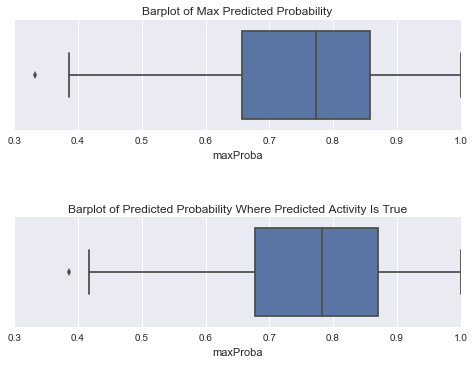

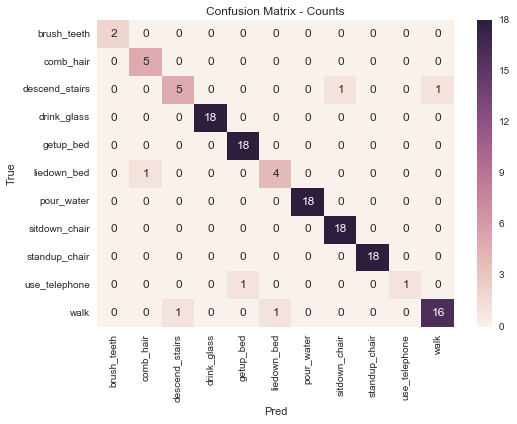

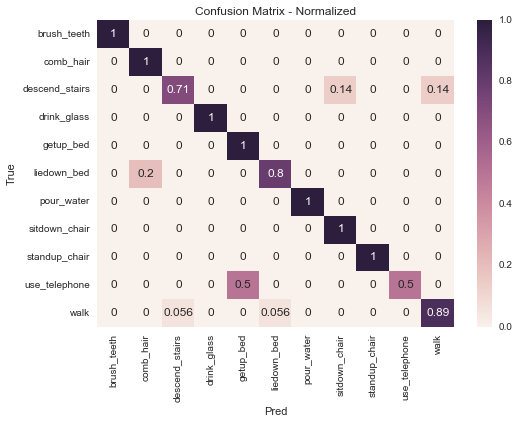



Applying confidence threshold and classifying all below as unknown_activity


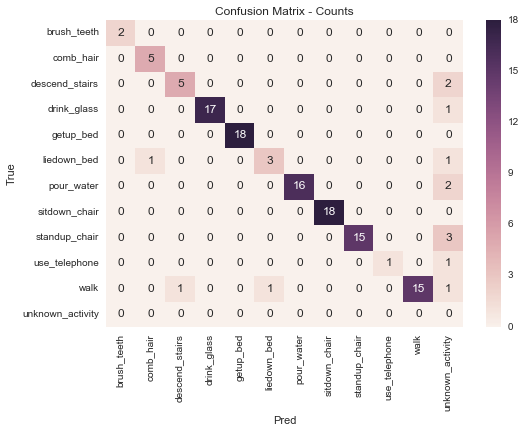

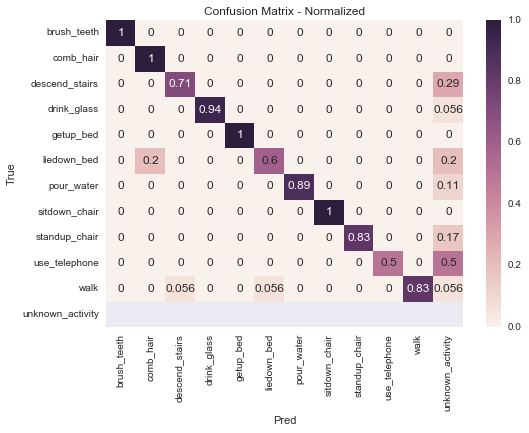

In [26]:
ovr_proba = reviewPredictions(le,ovr,X_test,y_test,0.6)
y_pred = ovr.predict(X_test)
createConfusionMatrix(le,y_pred,y_test)
print "\n\nApplying confidence threshold and classifying all below as unknown_activity"
createConfusionMatrix(le,y_pred,y_test,cmType = 'modified', probDF = ovr_proba)

In [27]:
print ovr.score(X_train,y_train)
print ovr.score(X_test,y_test)

0.996219281664
0.953488372093


In [28]:
# Set list of values to grid search over
n = [50,100,150,200,250,300]
params = {'estimator__n_estimators': n}

revMod = optimiseParameters(X_train,y_train,X_test,y_test,ovr,params,3)

Fitting 3 folds for each of 6 candidates, totalling 18 fits
[CV] estimator__n_estimators=50 ......................................
[CV] ............. estimator__n_estimators=50, score=0.893855 -   4.8s
[CV] estimator__n_estimators=50 ......................................
[CV] ............. estimator__n_estimators=50, score=0.903409 -   4.7s
[CV] estimator__n_estimators=50 ......................................
[CV] ............. estimator__n_estimators=50, score=0.913793 -   4.7s
[CV] estimator__n_estimators=100 .....................................
[CV] ............ estimator__n_estimators=100, score=0.877095 -   5.9s
[CV] estimator__n_estimators=100 .....................................
[CV] ............ estimator__n_estimators=100, score=0.875000 -   5.9s
[CV] estimator__n_estimators=100 .....................................
[CV] ............ estimator__n_estimators=100, score=0.908046 -   6.2s
[CV] estimator__n_estimators=150 .....................................
[CV] ............

[Parallel(n_jobs=1)]: Done  18 out of  18 | elapsed:  2.6min finished


Best Params:
{'estimator__n_estimators': 50}
Accuracy of current model: 0.953
Accuracy using best param: 0.904
OneVsRestClassifier(estimator=RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=7, max_features='auto',
            max_leaf_nodes=None, min_samples_leaf=2, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=20, n_jobs=-1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
          n_jobs=1)
Accuracy of current model: 0.953
OneVsRestClassifier(estimator=RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=7, max_features='auto',
            max_leaf_nodes=None, min_samples_leaf=2, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=50, n_jobs=-1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
          n_jobs=1)
Accuracy of updated model: 0.946

The smallest (winning) predicted activity probability is 0.320048251915
The largest (winning) predicted activity probability is 1.0

 NB: a winning probability represents the max probability output by the classifier for that input


     maxProba  MaxProbRatio   predActivity     actActivity    outputActivity
12   0.503071      0.136027  standup_chair   standup_chair  unknown_activity
13   0.534765      0.371757  standup_chair   standup_chair  unknown_activity
20   0.374658      0.202833  sitdown_chair   sitdown_chair  unknown_activity
33   0.376754      0.072334      getup_bed   sitdown_chair  unknown_activity
44   0.320048      0.194331      getup_bed            walk  unknown_activity
46   0.520557      0.223320           walk            walk  unknown_activity
62   0.471158      0.069894           walk  descend_stairs  unknown_activity
73   0.507652      0.451765    drink_glass     drink_glass  unknown_activity
114  0.492704      0.539846      getup_bed       getup_bed  unknown_activi

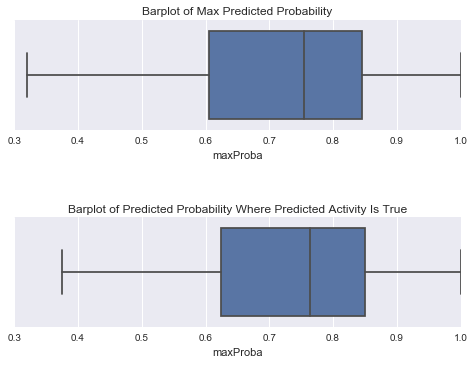

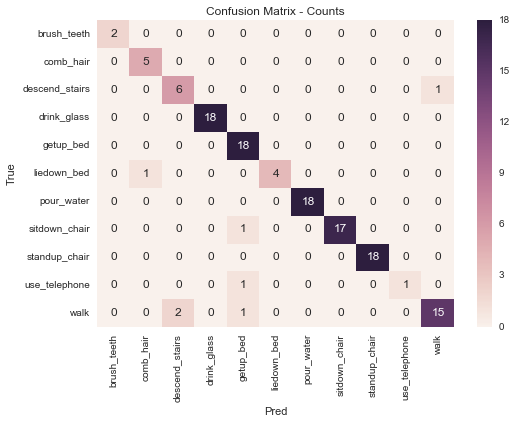

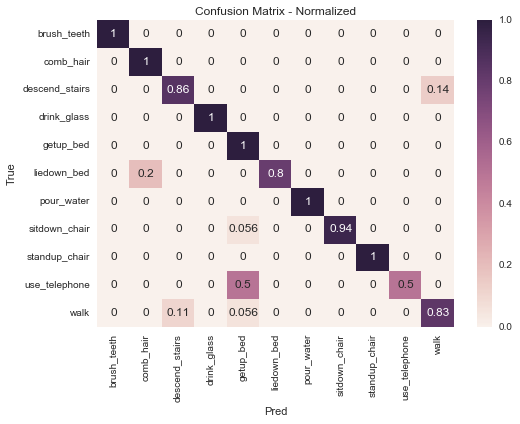



Applying confidence threshold and classifying all below as unknown_activity


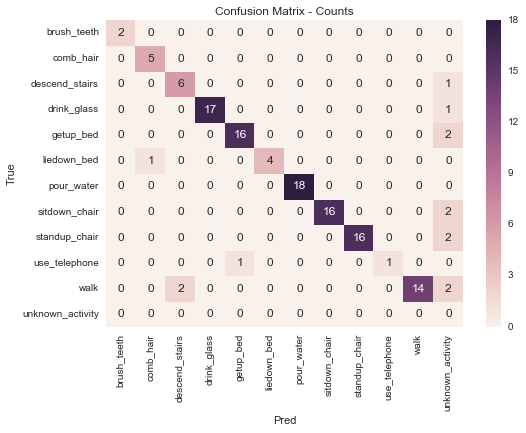

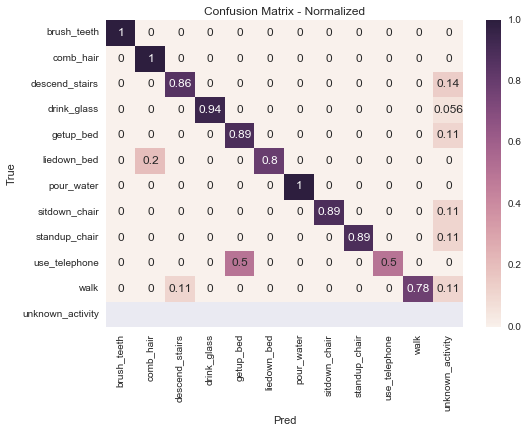

In [29]:
ovr_proba = reviewPredictions(le,revMod,X_test,y_test,0.6)
y_pred = revMod.predict(X_test)
createConfusionMatrix(le,y_pred,y_test)
print "\n\nApplying confidence threshold and classifying all below as unknown_activity"
createConfusionMatrix(le,y_pred,y_test,cmType = 'modified', probDF = ovr_proba)

In [30]:
ovr_proba.to_csv('../Data/Optim_OvR_Proba.csv')

## Build an Xgboost Classifier for comparison against Random Forest

Initialise classifier and fit model

In [39]:
gbm = xgb.XGBClassifier(n_estimators=20, objective = 'multi:softprob', learning_rate=0.1)
gbm.fit(X_train, y_train, eval_metric = "merror")

XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=20, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)

Review results of model and confusion matrices

The smallest (winning) predicted activity probability is 0.103854
The largest (winning) predicted activity probability is 0.818338

 NB: a winning probability represents the max probability output by the classifier for that input


     maxProba  MaxProbRatio   predActivity    actActivity    outputActivity
11   0.421553      0.411062  standup_chair  standup_chair  unknown_activity
12   0.379606      0.305356  standup_chair  standup_chair  unknown_activity
13   0.442982      0.363560  standup_chair  standup_chair  unknown_activity
20   0.266101      0.333256    liedown_bed  sitdown_chair  unknown_activity
33   0.122427      0.126288           walk  sitdown_chair  unknown_activity
44   0.103854      0.149237  standup_chair           walk  unknown_activity
45   0.195750      0.111978  standup_chair           walk  unknown_activity
87   0.105292      0.074942     pour_water     pour_water  unknown_activity
104  0.353082      0.032318    liedown_bed    liedown_bed  unknown_activity
114  0.1

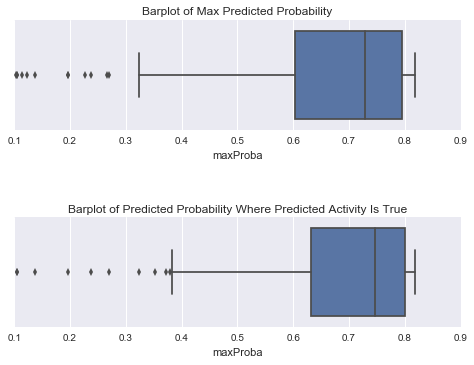

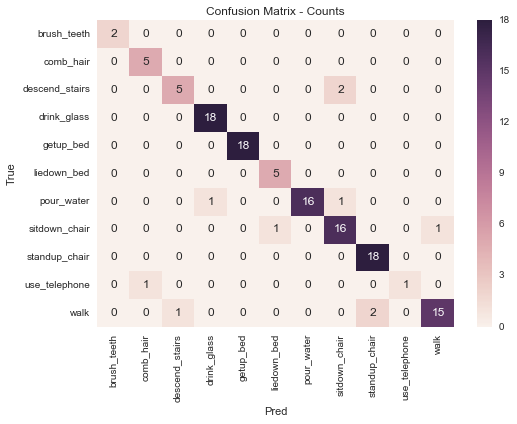

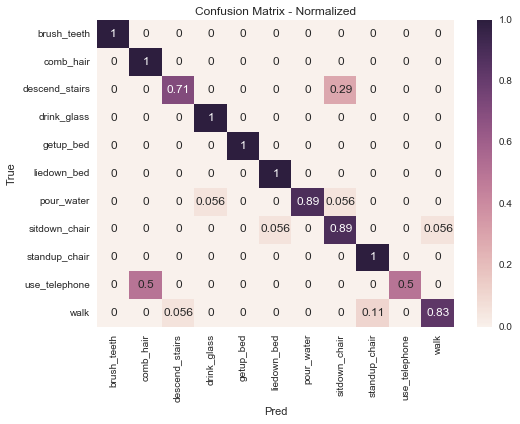



Applying confidence threshold and classifying all below as unknown_activity


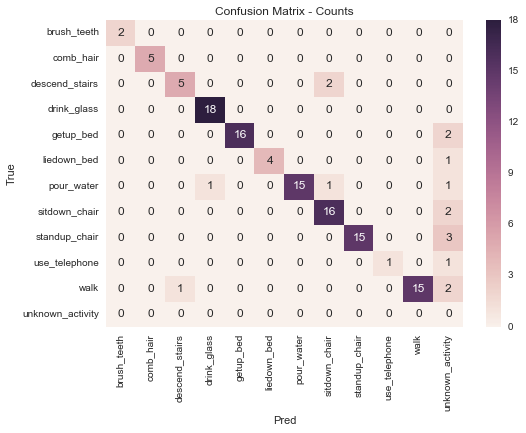

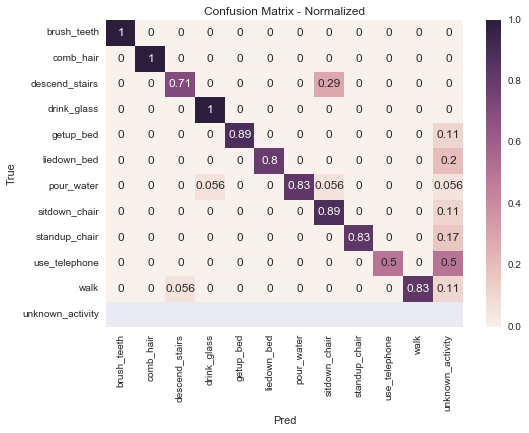

In [40]:
xgb_proba = reviewPredictions(le,gbm,X_test,y_test,0.6)
y_pred = gbm.predict(X_test)
createConfusionMatrix(le,y_pred,y_test)
print "\n\nApplying confidence threshold and classifying all below as unknown_activity"
createConfusionMatrix(le,y_pred,y_test,cmType = 'modified', probDF = xgb_proba)

Use a gridsearch to optimise no. estimators and max depth hyperparameters

In [41]:
# Set list of values to grid search over
n = [10,20,30,40,50,100,150,200,250,300,400,500,600]
m = [1,3,5,7,9,11]

params = {'n_estimators': n,'max_depth': m}

newXGB = optimiseParameters(X_train, y_train, X_test, y_test, gbm, params, 1)

Fitting 3 folds for each of 78 candidates, totalling 234 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:   50.9s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:  4.7min
[Parallel(n_jobs=1)]: Done 234 out of 234 | elapsed:  5.7min finished


Best Params:
{'n_estimators': 400, 'max_depth': 5}
Accuracy of current model: 0.922
Accuracy using best param: 0.894
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=20, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.922
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=400, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.922


Calculate feature importance of the optimised model

Run: 92 of 92

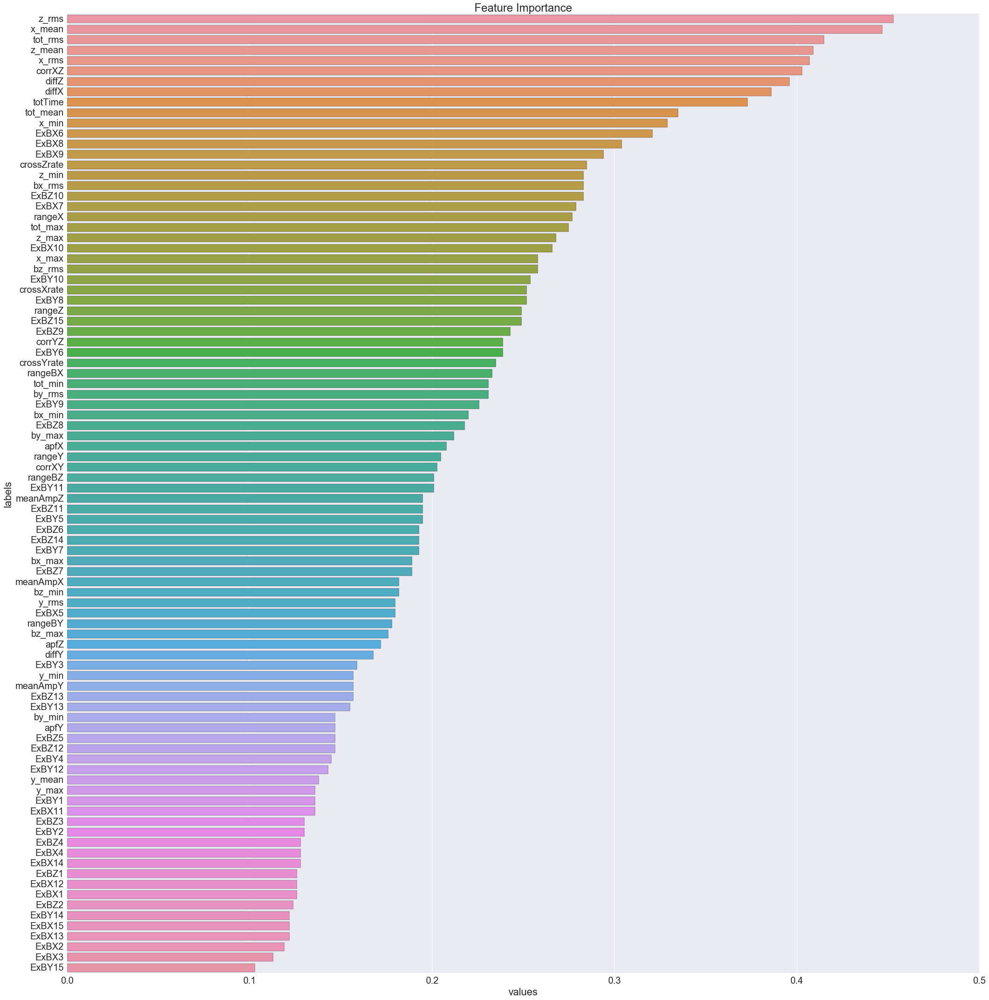

In [42]:
list_tuple = calculateFeatureImportance(newXGB,X_train,y_train,"xgb_features.jpg")

Using the features ranked by importance, iterate through building models with more and more features, optimise hyperparameters and output accuracy score.  These will then be plotted in an attempt to determine the most efficient (and acceptable) number of features

Outputs saved at: ../Outputs/2016080505-2110Xgboost


NEW RUN 1 of 92:XgboostClassifier being trained using: ['z_mean'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    3.6s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:   29.2s
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:   35.0s finished


Best Params:
{'n_estimators': 30, 'max_depth': 1}
Accuracy of current model: 0.434
Accuracy using best param: 0.514
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=20, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.434
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=30, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.450
The smallest (winning) predicted activity probability is 0.231184
The largest (winning) predicted activity probability is 0.7428

 NB: a winning probability r

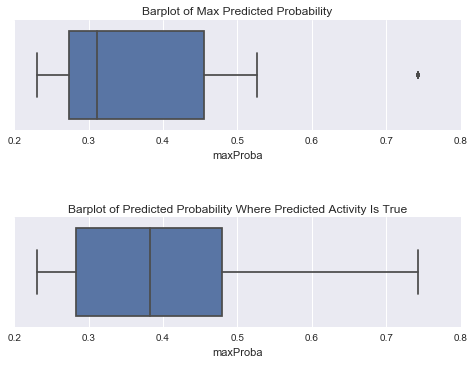

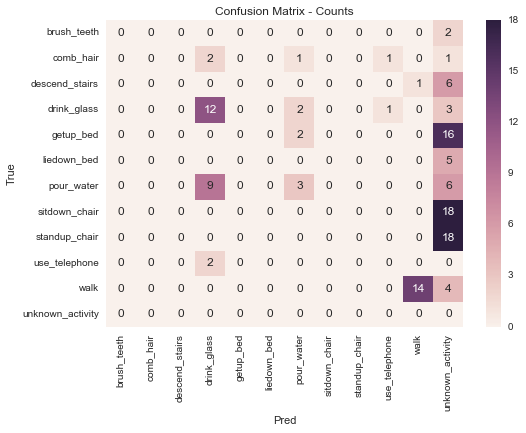

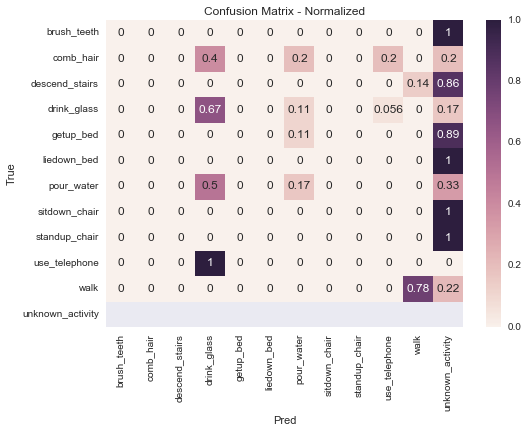


Percent Diff: 349.612403101  Count: 0


NEW RUN 2 of 92:XgboostClassifier being trained using: ['z_mean', 'totTime'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    3.6s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:   28.1s
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:   33.3s finished


Best Params:
{'n_estimators': 150, 'max_depth': 1}
Accuracy of current model: 0.527
Accuracy using best param: 0.648
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=30, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.527
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=150, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.620
The smallest (winning) predicted activity probability is 0.263106
The largest (winning) predicted activity probability is 0.987631

 NB: a winning probabili

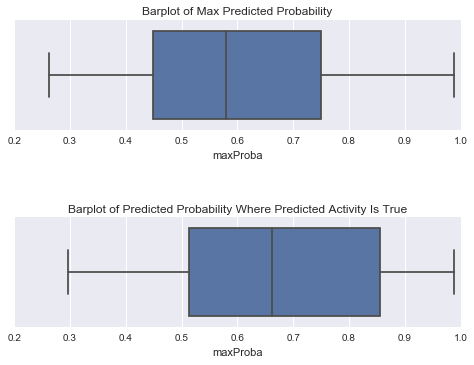

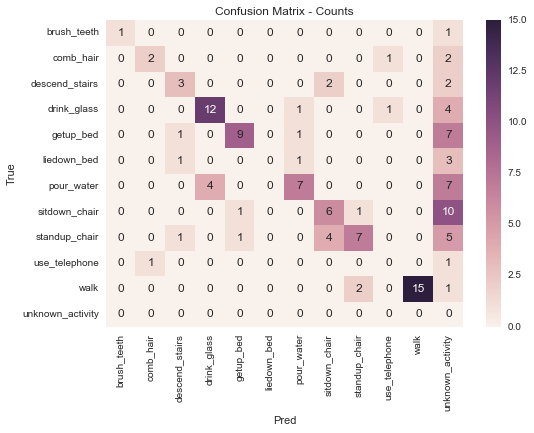

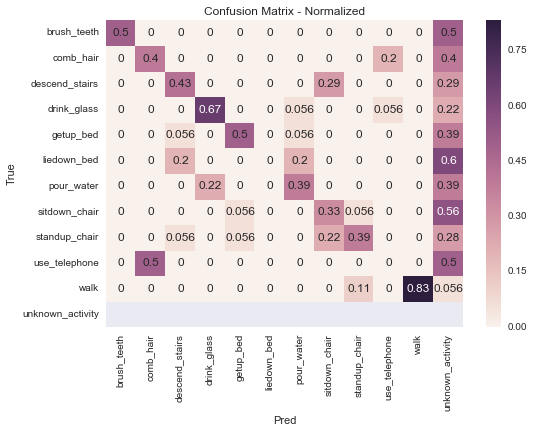


Percent Diff: 37.9310344828  Count: 0


NEW RUN 3 of 92:XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    4.0s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:   30.3s
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:   35.5s finished


Best Params:
{'n_estimators': 400, 'max_depth': 1}
Accuracy of current model: 0.690
Accuracy using best param: 0.690
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=150, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.690
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=400, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.682
The smallest (winning) predicted activity probability is 0.345741
The largest (winning) predicted activity probability is 0.997177

 NB: a winning probabil

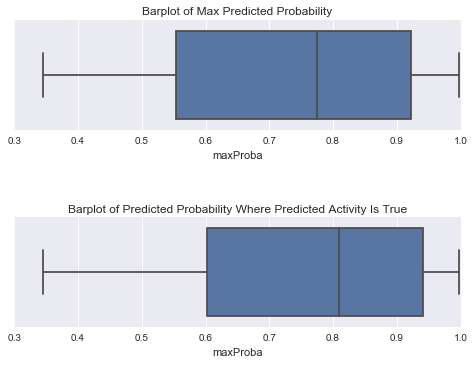

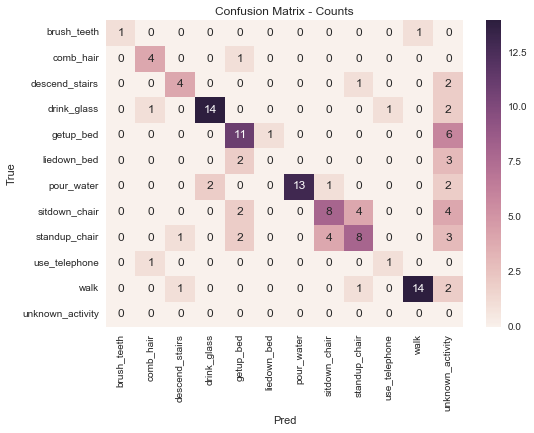

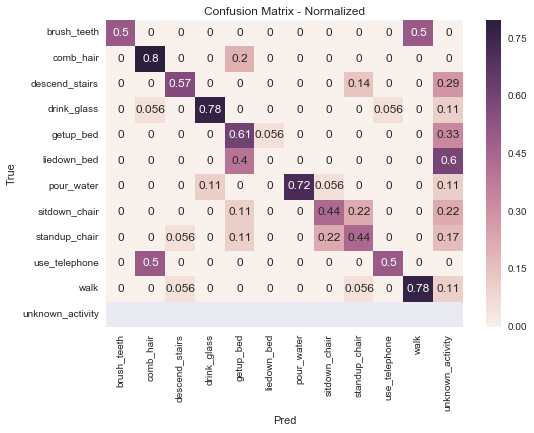


Percent Diff: 10.0  Count: 0


NEW RUN 4 of 92:XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    4.4s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:   34.1s
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:   40.1s finished


Best Params:
{'n_estimators': 400, 'max_depth': 1}
Accuracy of current model: 0.682
Accuracy using best param: 0.690
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=400, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.682
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=400, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.682
The smallest (winning) predicted activity probability is 0.345741
The largest (winning) predicted activity probability is 0.997177

 NB: a winning probabil

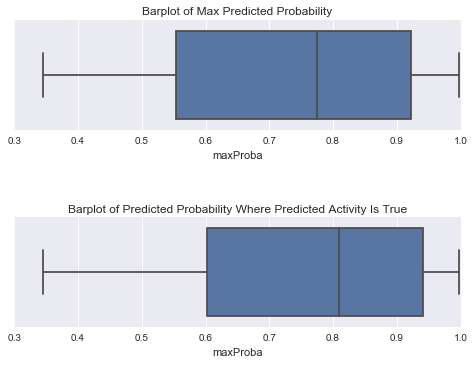

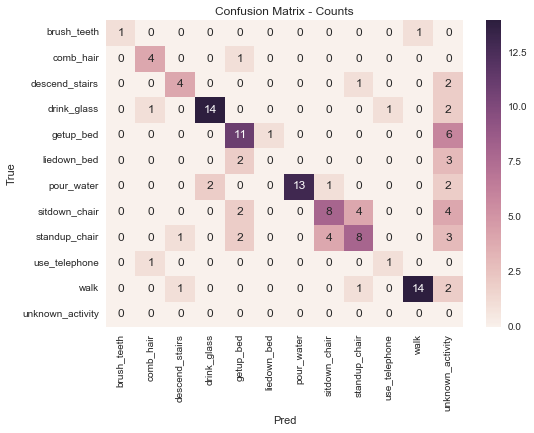

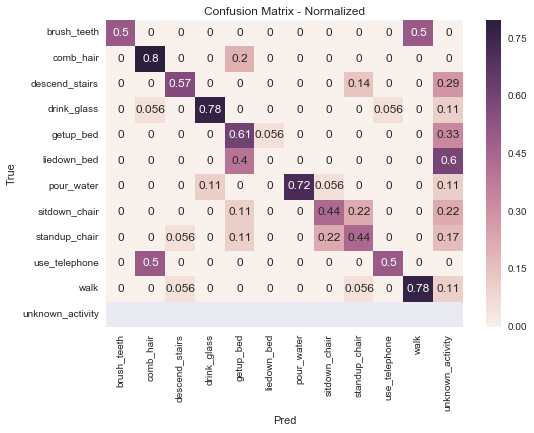


Percent Diff: 0.0  Count: 0


NEW RUN 5 of 92:XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    4.8s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:   38.7s
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:   45.5s finished


Best Params:
{'n_estimators': 400, 'max_depth': 1}
Accuracy of current model: 0.682
Accuracy using best param: 0.690
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=400, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.682
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=400, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.682
The smallest (winning) predicted activity probability is 0.345741
The largest (winning) predicted activity probability is 0.997177

 NB: a winning probabil

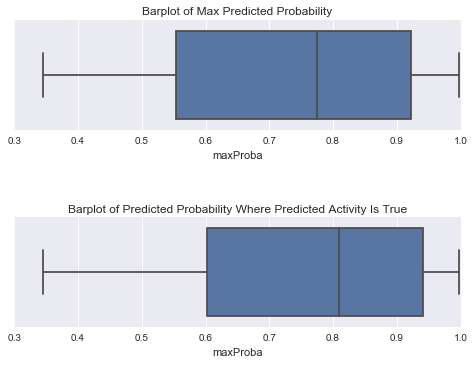

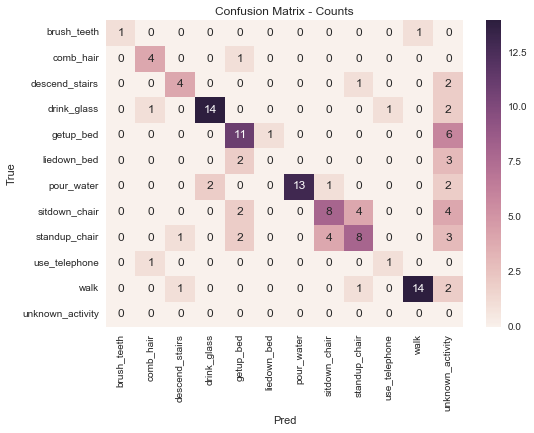

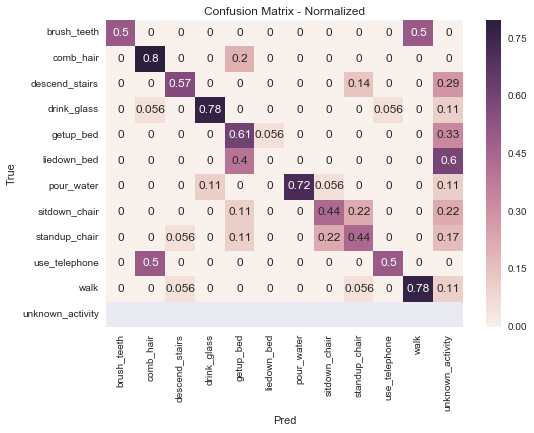


Percent Diff: 0.0  Count: 0


NEW RUN 6 of 92:XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    5.2s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:   42.7s
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:   50.2s finished


Best Params:
{'n_estimators': 400, 'max_depth': 1}
Accuracy of current model: 0.682
Accuracy using best param: 0.690
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=400, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.682
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=400, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.682
The smallest (winning) predicted activity probability is 0.345741
The largest (winning) predicted activity probability is 0.997177

 NB: a winning probabil

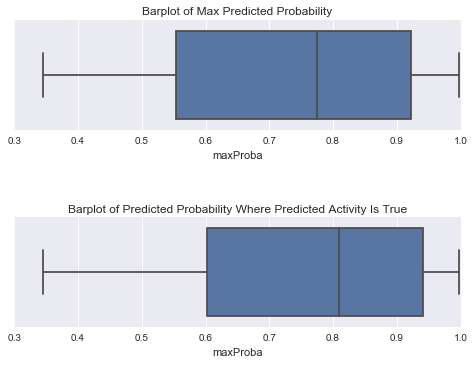

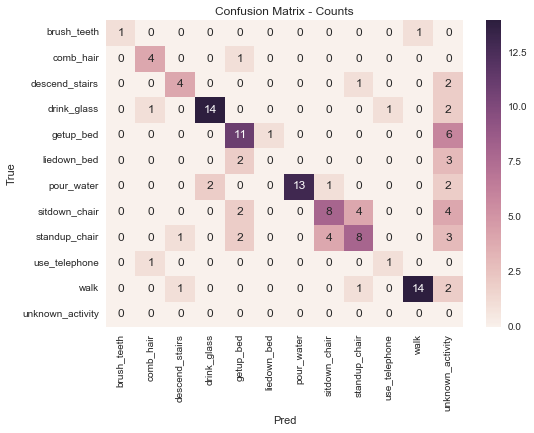

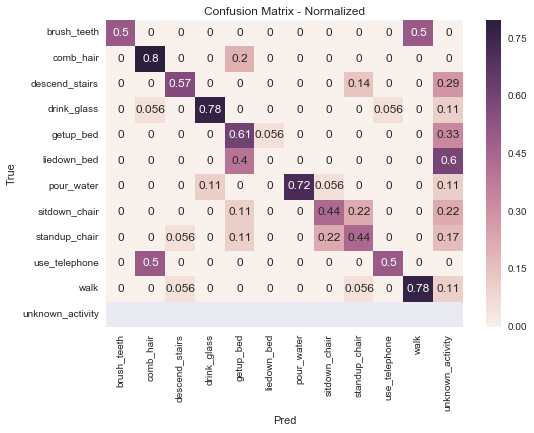


Percent Diff: 0.0  Count: 0


NEW RUN 7 of 92:XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    5.7s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:   45.7s
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:   53.6s finished


Best Params:
{'n_estimators': 500, 'max_depth': 7}
Accuracy of current model: 0.667
Accuracy using best param: 0.707
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=400, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.667
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=7,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.690
The smallest (winning) predicted activity probability is 0.192437
The largest (winning) predicted activity probability is 0.999294

 NB: a winning probabil

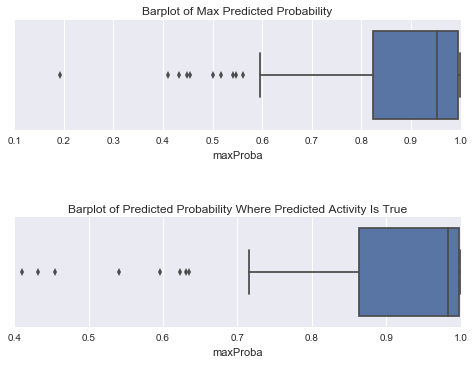

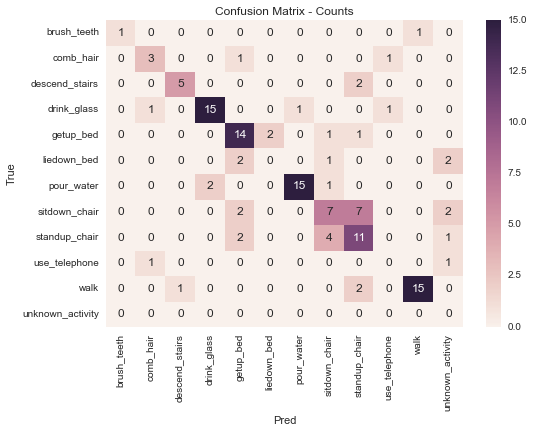

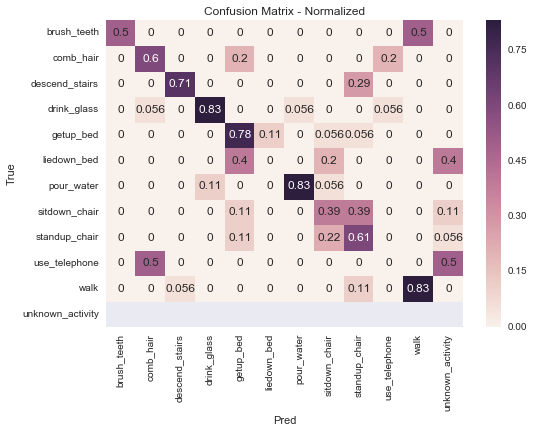


Percent Diff: 1.13636363636  Count: 0


NEW RUN 8 of 92:XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    6.1s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:   45.7s
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:   53.3s finished


Best Params:
{'n_estimators': 250, 'max_depth': 5}
Accuracy of current model: 0.721
Accuracy using best param: 0.754
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=7,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.721
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=250, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.705
The smallest (winning) predicted activity probability is 0.310346
The largest (winning) predicted activity probability is 0.999223

 NB: a winning probabil

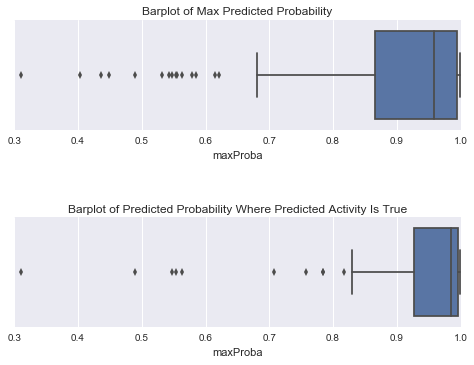

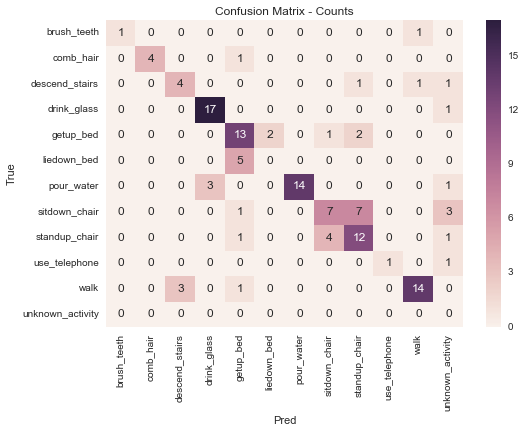

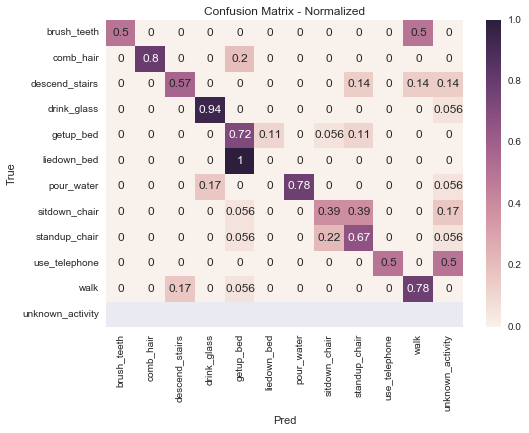


Percent Diff: 2.24719101124  Count: 1


NEW RUN 9 of 92:XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    6.5s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:   44.4s
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:   51.4s finished


Best Params:
{'n_estimators': 250, 'max_depth': 7}
Accuracy of current model: 0.860
Accuracy using best param: 0.809
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=250, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.860
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=7,
       min_child_weight=1, missing=None, n_estimators=250, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.845
The smallest (winning) predicted activity probability is 0.205873
The largest (winning) predicted activity probability is 0.999441

 NB: a winning probabil

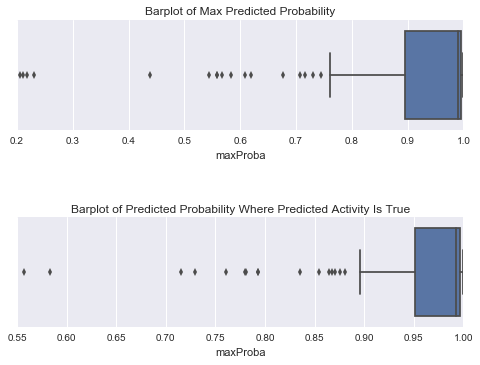

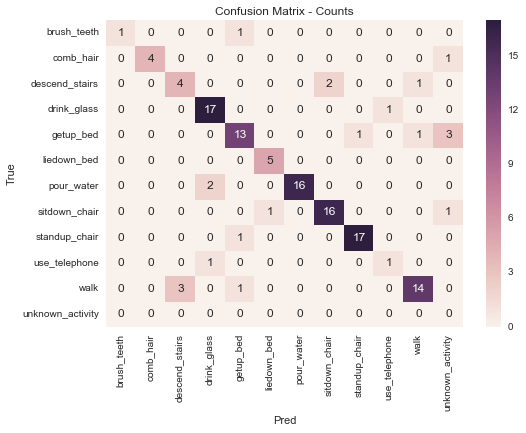

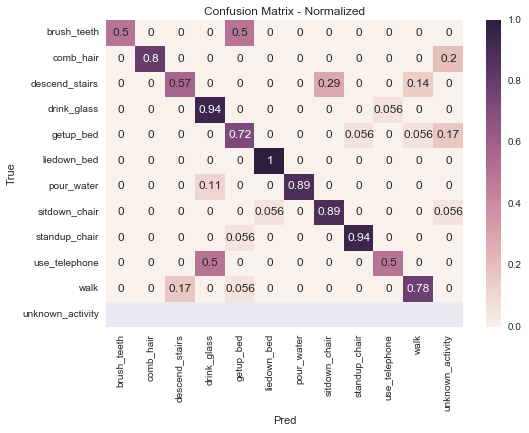


Percent Diff: 19.7802197802  Count: 2


NEW RUN 10 of 92:XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    6.9s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:   47.8s
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:   55.3s finished


Best Params:
{'n_estimators': 500, 'max_depth': 7}
Accuracy of current model: 0.860
Accuracy using best param: 0.813
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=7,
       min_child_weight=1, missing=None, n_estimators=250, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.860
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=7,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.860
The smallest (winning) predicted activity probability is 0.184806
The largest (winning) predicted activity probability is 0.999752

 NB: a winning probabil

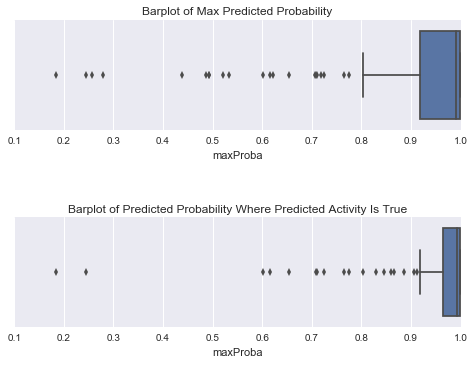

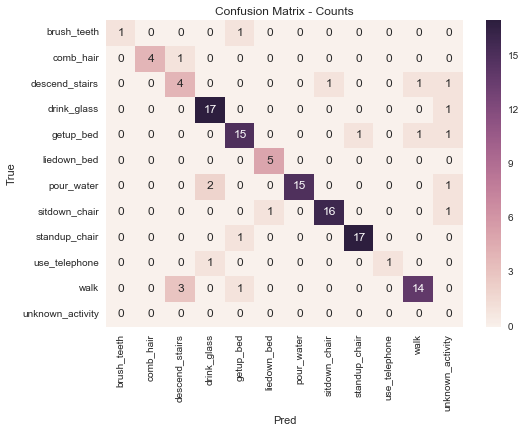

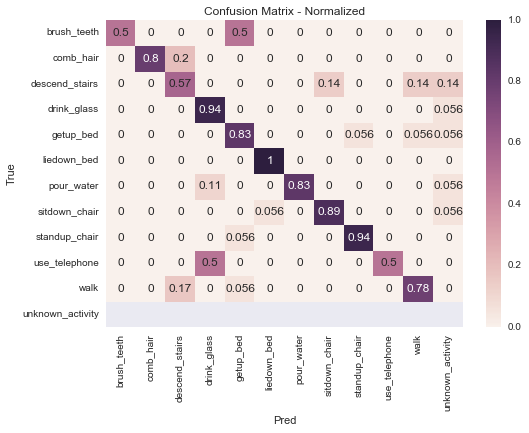


Percent Diff: 1.83486238532  Count: 2


NEW RUN 11 of 92:XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean', 'diffX'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    7.3s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:   50.8s
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:   58.9s finished


Best Params:
{'n_estimators': 500, 'max_depth': 7}
Accuracy of current model: 0.860
Accuracy using best param: 0.813
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=7,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.860
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=7,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.860
The smallest (winning) predicted activity probability is 0.184806
The largest (winning) predicted activity probability is 0.999752

 NB: a winning probabil

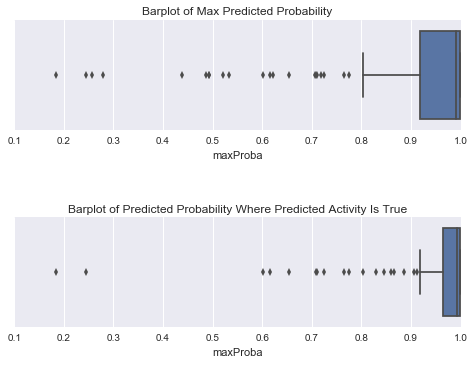

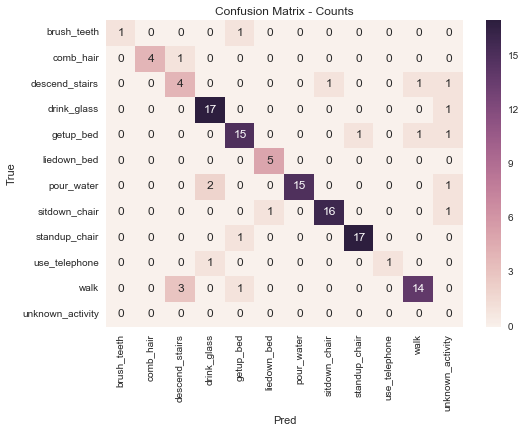

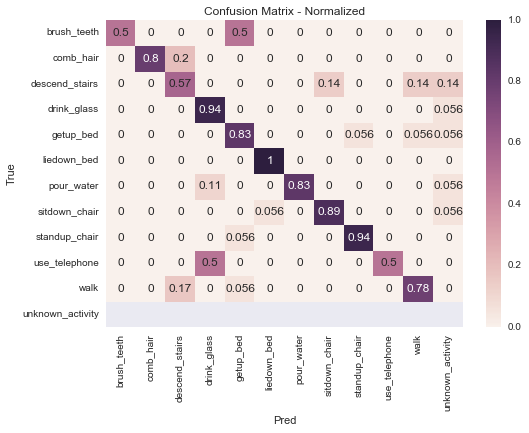


Percent Diff: 0.0  Count: 3


NEW RUN 12 of 92:XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean', 'diffX', 'x_max'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    7.9s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:   53.4s
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:  1.0min finished


Best Params:
{'n_estimators': 300, 'max_depth': 3}
Accuracy of current model: 0.899
Accuracy using best param: 0.809
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=7,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.899
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=300, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.899
The smallest (winning) predicted activity probability is 0.295832
The largest (winning) predicted activity probability is 0.999801

 NB: a winning probabil

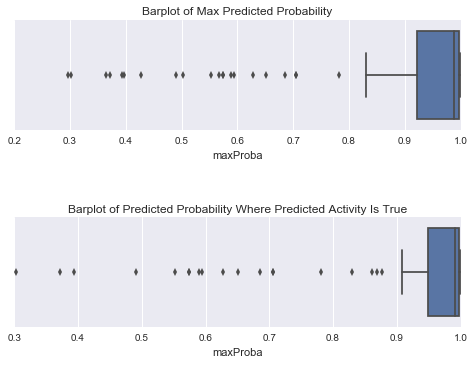

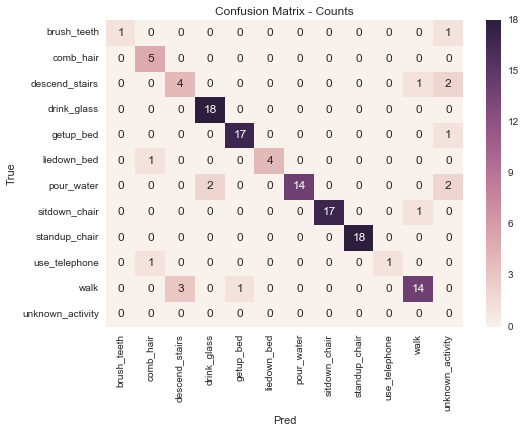

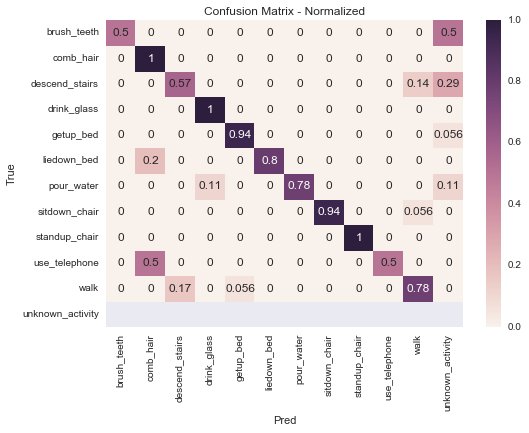


Percent Diff: 4.5045045045  Count: 3


NEW RUN 13 of 92:XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean', 'diffX', 'x_max', 'z_max'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    9.3s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:  1.0min
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:  1.2min finished


Best Params:
{'n_estimators': 300, 'max_depth': 3}
Accuracy of current model: 0.899
Accuracy using best param: 0.809
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=300, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.899
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=300, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.899
The smallest (winning) predicted activity probability is 0.295832
The largest (winning) predicted activity probability is 0.999801

 NB: a winning probabil

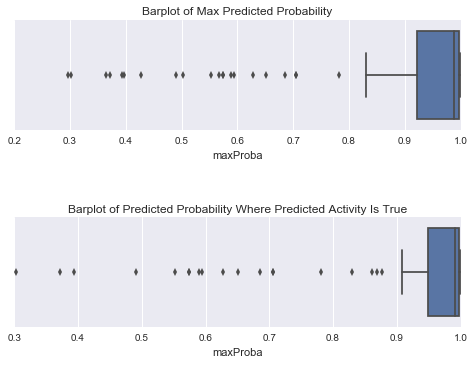

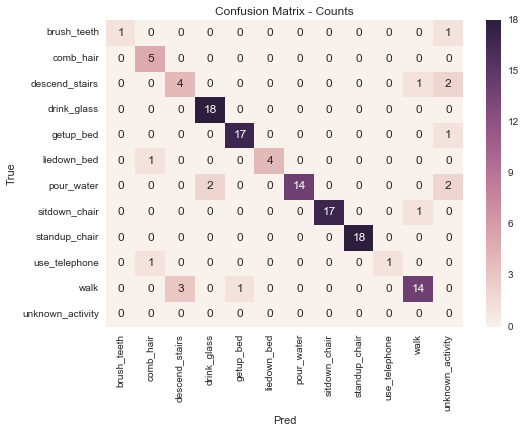

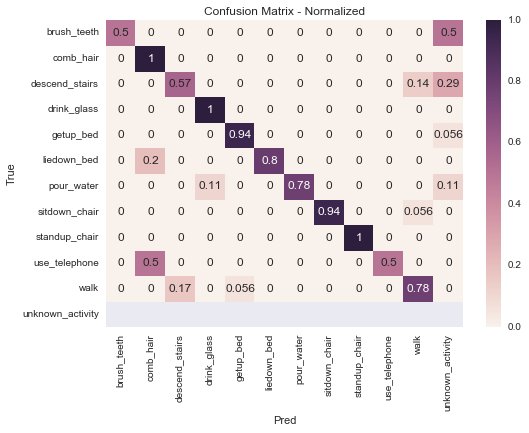


Percent Diff: 0.0  Count: 3


NEW RUN 14 of 92:XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean', 'diffX', 'x_max', 'z_max', 'tot_max'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    9.4s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:  1.0min
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:  1.2min finished


Best Params:
{'n_estimators': 300, 'max_depth': 5}
Accuracy of current model: 0.907
Accuracy using best param: 0.817
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=300, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.907
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=300, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.891
The smallest (winning) predicted activity probability is 0.243275
The largest (winning) predicted activity probability is 0.999525

 NB: a winning probabil

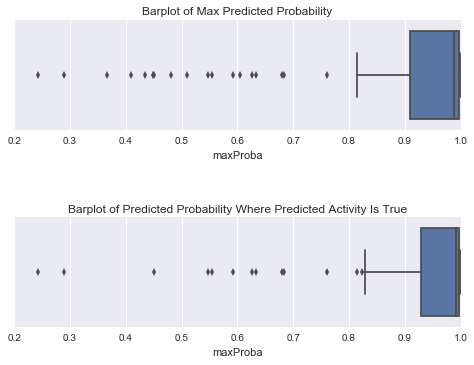

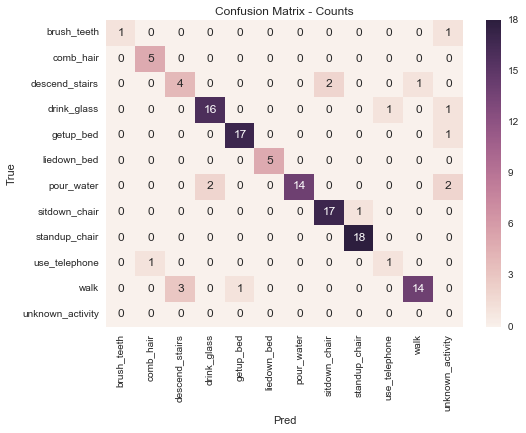

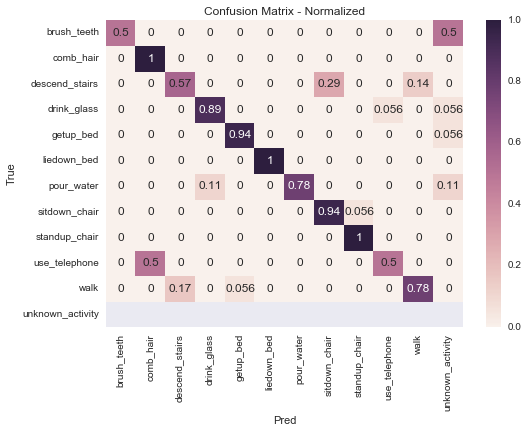


Percent Diff: 0.862068965517  Count: 3


NEW RUN 15 of 92:XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean', 'diffX', 'x_max', 'z_max', 'tot_max', 'bx_rms'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:   10.0s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:  1.2min
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:  1.4min finished


Best Params:
{'n_estimators': 100, 'max_depth': 3}
Accuracy of current model: 0.876
Accuracy using best param: 0.817
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=300, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.876
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=100, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.891
The smallest (winning) predicted activity probability is 0.200038
The largest (winning) predicted activity probability is 0.997897

 NB: a winning probabil

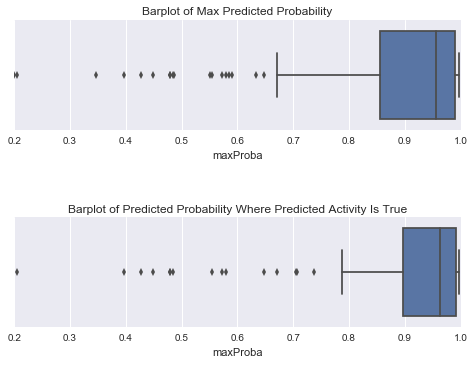

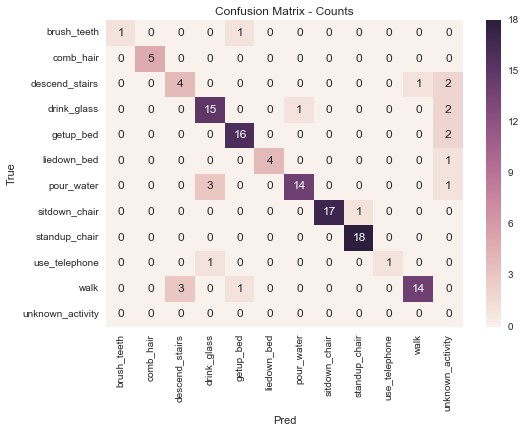

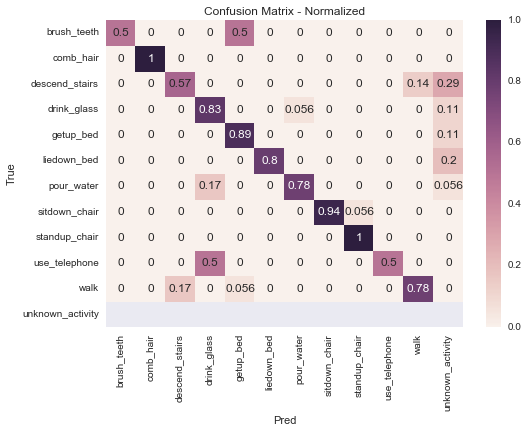


Percent Diff: 0.0  Count: 4


NEW RUN 16 of 92:XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean', 'diffX', 'x_max', 'z_max', 'tot_max', 'bx_rms', 'bx_min'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:   10.5s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:  1.2min
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:  1.3min finished


Best Params:
{'n_estimators': 300, 'max_depth': 5}
Accuracy of current model: 0.899
Accuracy using best param: 0.815
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=100, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.899
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=300, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.899
The smallest (winning) predicted activity probability is 0.26022
The largest (winning) predicted activity probability is 0.999476

 NB: a winning probabili

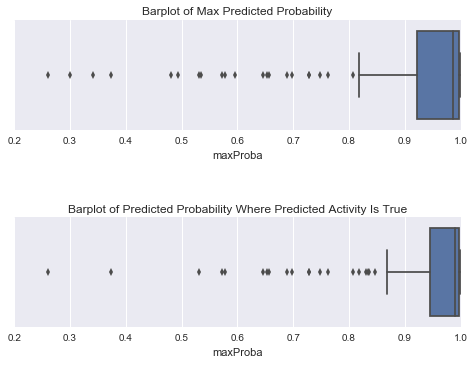

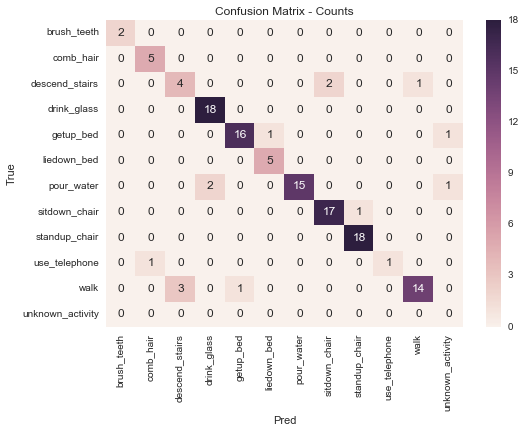

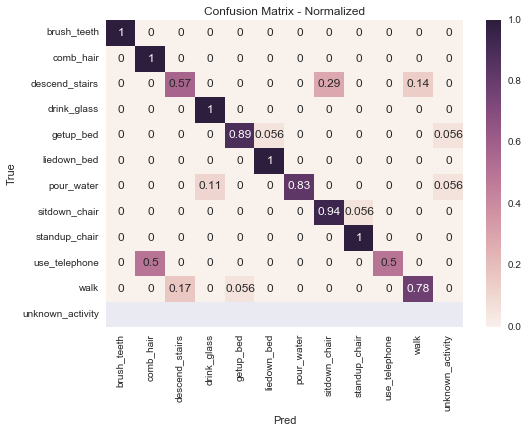


Percent Diff: 0.869565217391  Count: 4


NEW RUN 17 of 92:XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean', 'diffX', 'x_max', 'z_max', 'tot_max', 'bx_rms', 'bx_min', 'corrXY'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:   10.6s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:  1.1min
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:  1.3min finished


Best Params:
{'n_estimators': 250, 'max_depth': 5}
Accuracy of current model: 0.907
Accuracy using best param: 0.877
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=300, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.907
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=250, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.907
The smallest (winning) predicted activity probability is 0.254388
The largest (winning) predicted activity probability is 0.999299

 NB: a winning probabil

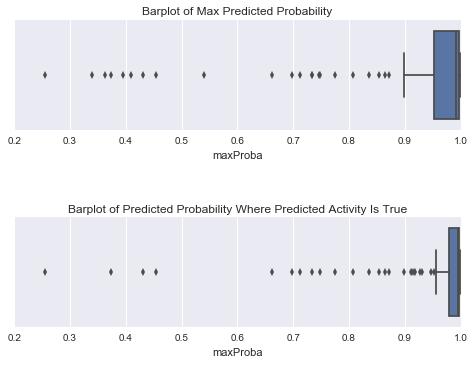

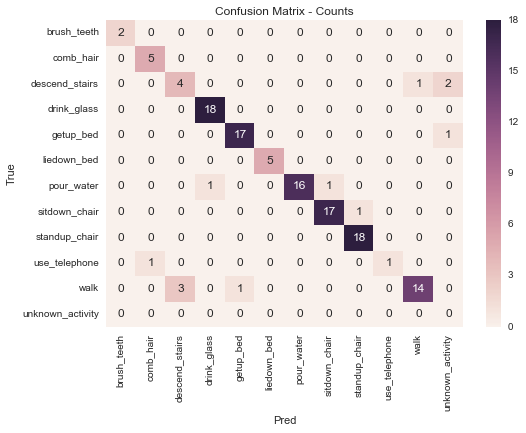

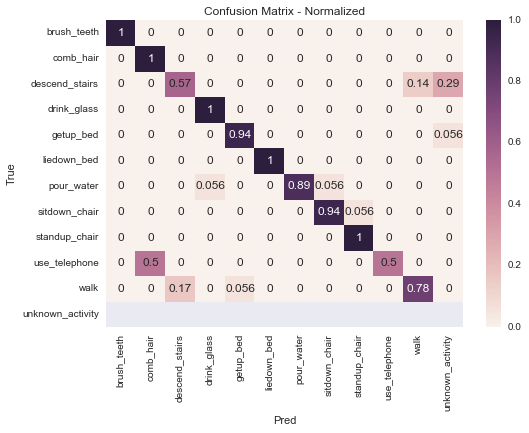


Percent Diff: 0.862068965517  Count: 5


NEW RUN 18 of 92:XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean', 'diffX', 'x_max', 'z_max', 'tot_max', 'bx_rms', 'bx_min', 'corrXY', 'bz_rms'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:   11.1s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:  1.1min
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:  1.3min finished


Best Params:
{'n_estimators': 300, 'max_depth': 5}
Accuracy of current model: 0.907
Accuracy using best param: 0.885
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=250, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.907
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=300, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.907
The smallest (winning) predicted activity probability is 0.346638
The largest (winning) predicted activity probability is 0.999508

 NB: a winning probabil

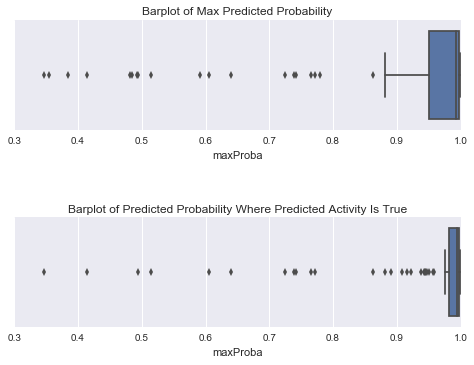

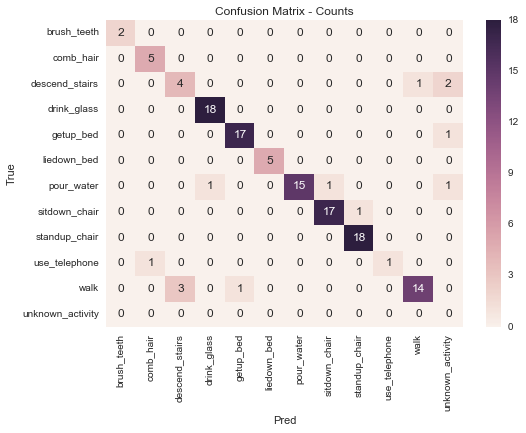

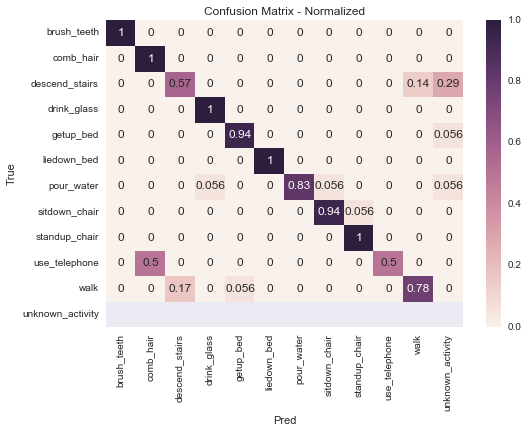


Percent Diff: 0.0  Count: 6


NEW RUN 19 of 92:XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean', 'diffX', 'x_max', 'z_max', 'tot_max', 'bx_rms', 'bx_min', 'corrXY', 'bz_rms', 'ExBX9'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:   11.5s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:  1.2min
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:  1.4min finished


Best Params:
{'n_estimators': 500, 'max_depth': 5}
Accuracy of current model: 0.915
Accuracy using best param: 0.879
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=300, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.915
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.915
The smallest (winning) predicted activity probability is 0.322255
The largest (winning) predicted activity probability is 0.999731

 NB: a winning probabil

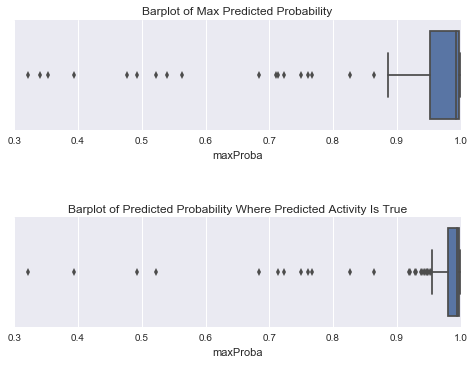

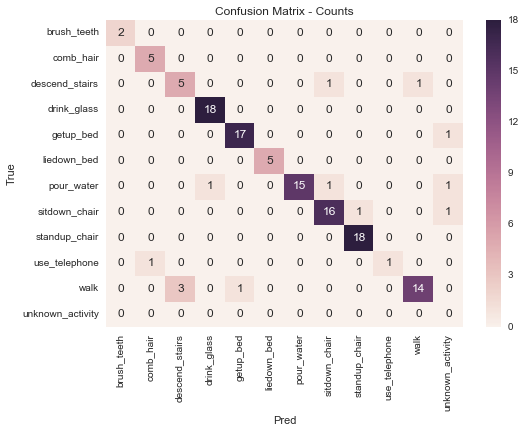

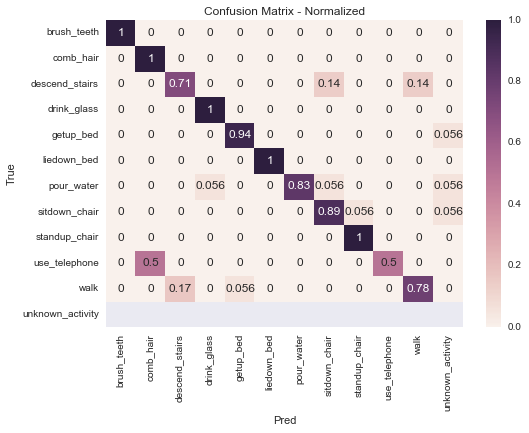


Percent Diff: 0.854700854701  Count: 6


NEW RUN 20 of 92:XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean', 'diffX', 'x_max', 'z_max', 'tot_max', 'bx_rms', 'bx_min', 'corrXY', 'bz_rms', 'ExBX9', 'z_min'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:   11.7s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:  1.2min
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:  1.4min finished


Best Params:
{'n_estimators': 500, 'max_depth': 1}
Accuracy of current model: 0.915
Accuracy using best param: 0.877
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.915
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.907
The smallest (winning) predicted activity probability is 0.300494
The largest (winning) predicted activity probability is 0.999634

 NB: a winning probabil

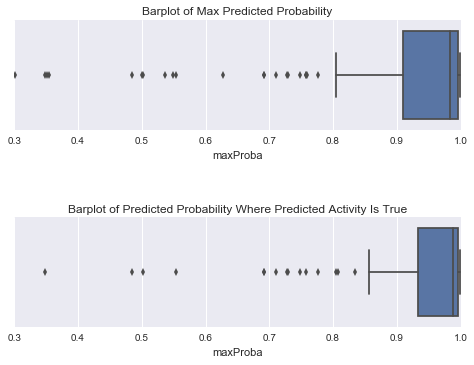

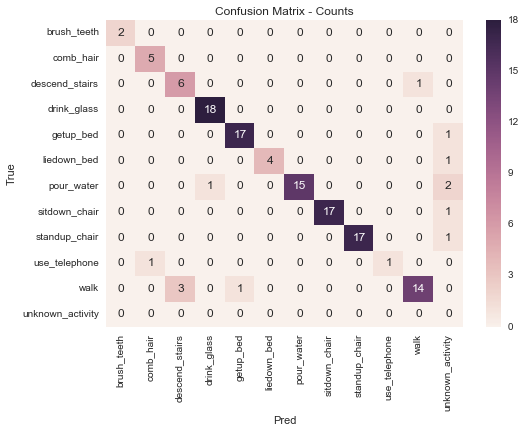

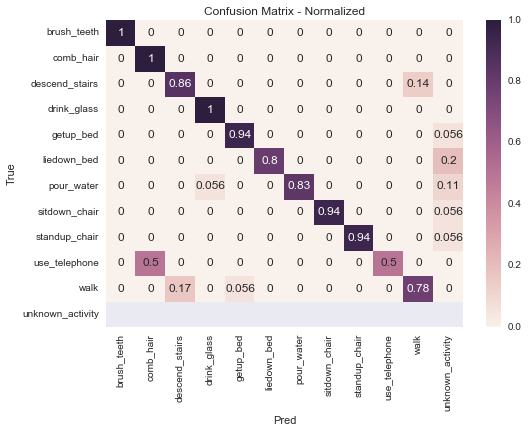


Percent Diff: 0.847457627119  Count: 7


NEW RUN 21 of 92:XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean', 'diffX', 'x_max', 'z_max', 'tot_max', 'bx_rms', 'bx_min', 'corrXY', 'bz_rms', 'ExBX9', 'z_min', 'corrYZ'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:   12.2s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:  1.3min
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:  1.5min finished


Best Params:
{'n_estimators': 500, 'max_depth': 1}
Accuracy of current model: 0.907
Accuracy using best param: 0.877
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.907
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.907
The smallest (winning) predicted activity probability is 0.300494
The largest (winning) predicted activity probability is 0.999634

 NB: a winning probabil

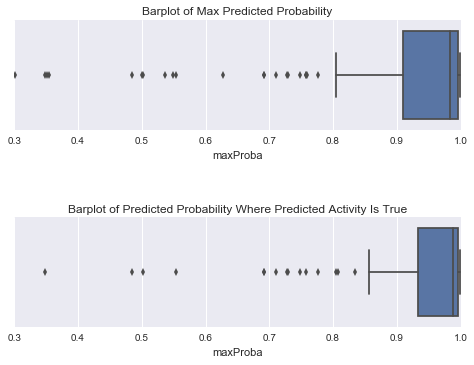

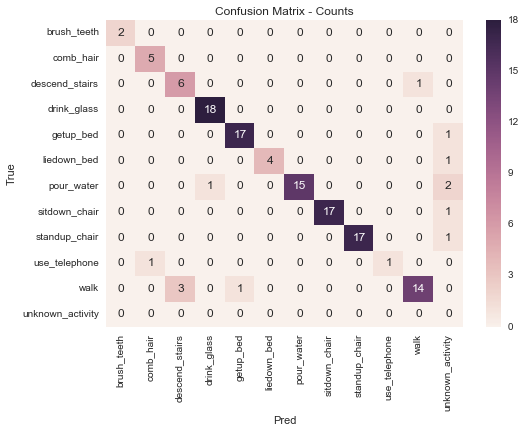

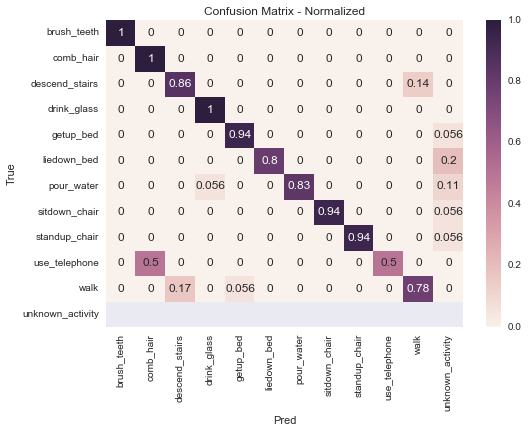


Percent Diff: 0.0  Count: 8


NEW RUN 22 of 92:XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean', 'diffX', 'x_max', 'z_max', 'tot_max', 'bx_rms', 'bx_min', 'corrXY', 'bz_rms', 'ExBX9', 'z_min', 'corrYZ', 'crossXrate'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:   12.4s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:  1.3min
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:  1.5min finished


Best Params:
{'n_estimators': 500, 'max_depth': 1}
Accuracy of current model: 0.891
Accuracy using best param: 0.877
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.891
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.891
The smallest (winning) predicted activity probability is 0.318116
The largest (winning) predicted activity probability is 0.999764

 NB: a winning probabil

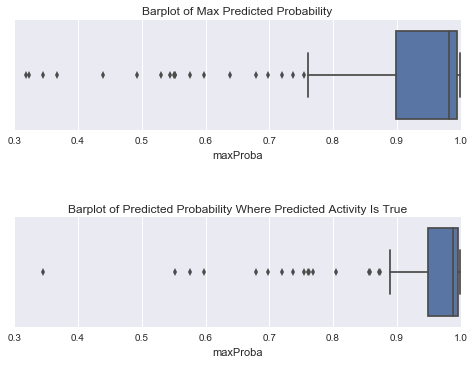

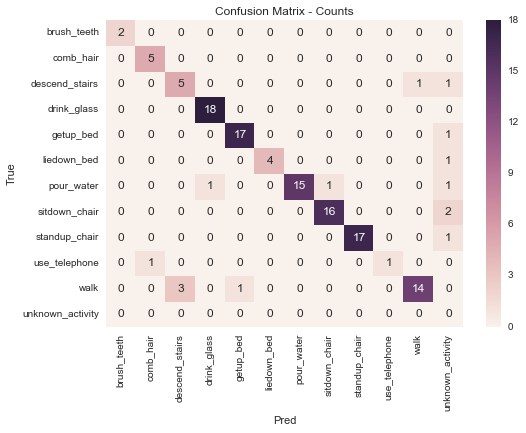

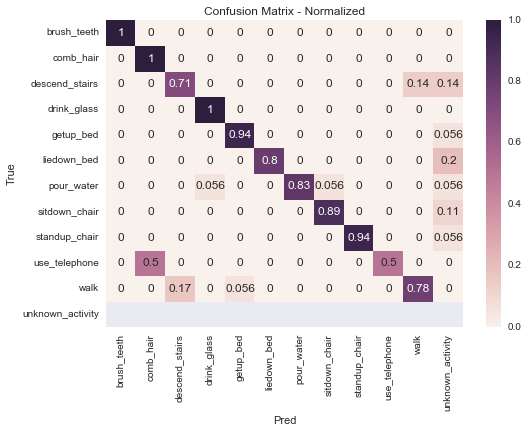


Percent Diff: 1.7094017094  Count: 8


NEW RUN 23 of 92:XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean', 'diffX', 'x_max', 'z_max', 'tot_max', 'bx_rms', 'bx_min', 'corrXY', 'bz_rms', 'ExBX9', 'z_min', 'corrYZ', 'crossXrate', 'ExBY7'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:   13.0s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:  4.8min
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:  5.0min finished


Best Params:
{'n_estimators': 200, 'max_depth': 1}
Accuracy of current model: 0.915
Accuracy using best param: 0.877
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.915
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=200, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.899
The smallest (winning) predicted activity probability is 0.294467
The largest (winning) predicted activity probability is 0.997975

 NB: a winning probabil

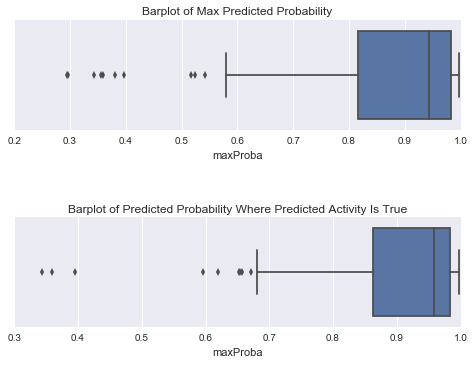

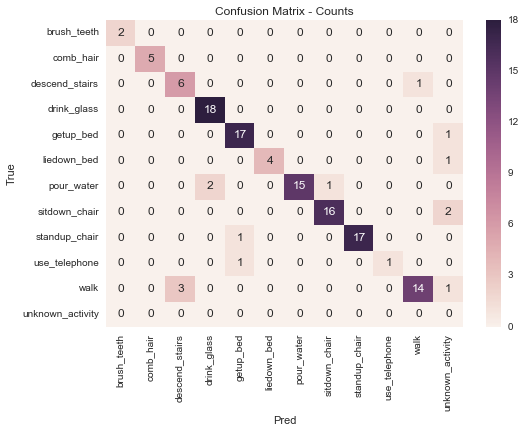

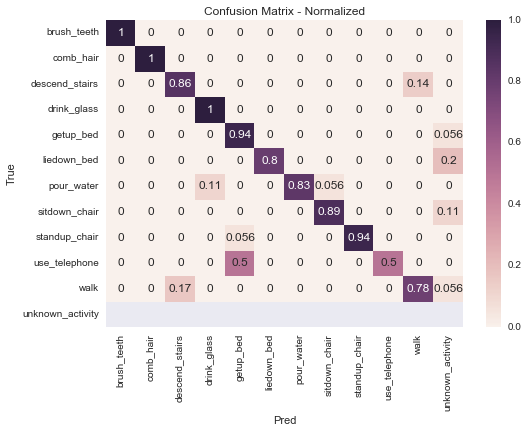


Percent Diff: 0.869565217391  Count: 9


NEW RUN 24 of 92:XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean', 'diffX', 'x_max', 'z_max', 'tot_max', 'bx_rms', 'bx_min', 'corrXY', 'bz_rms', 'ExBX9', 'z_min', 'corrYZ', 'crossXrate', 'ExBY7', 'ExBX6'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:   16.0s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:  1.5min
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:  1.7min finished


Best Params:
{'n_estimators': 500, 'max_depth': 1}
Accuracy of current model: 0.907
Accuracy using best param: 0.875
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=200, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.907
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.915
The smallest (winning) predicted activity probability is 0.328094
The largest (winning) predicted activity probability is 0.999765

 NB: a winning probabil

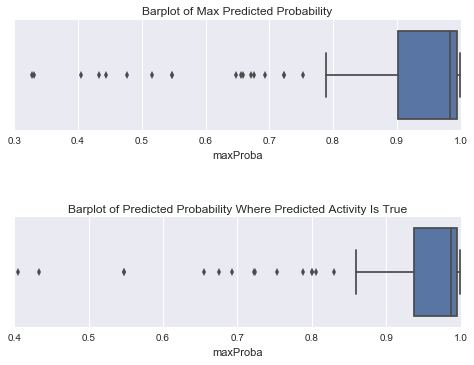

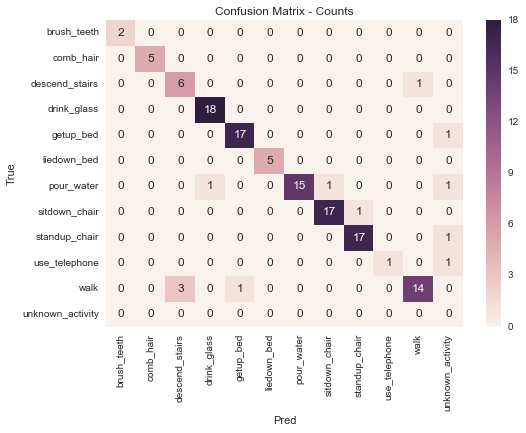

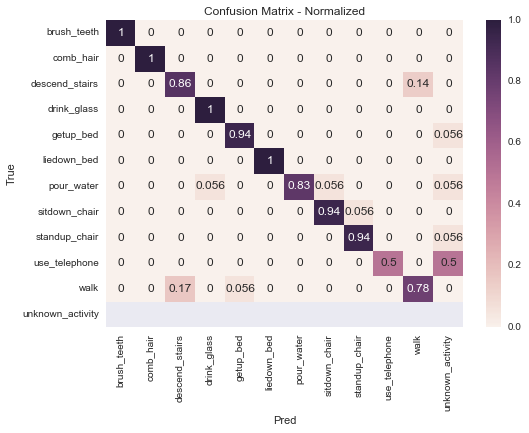


Percent Diff: 1.72413793103  Count: 10
Model improvement has stabilised, ending feature addition process


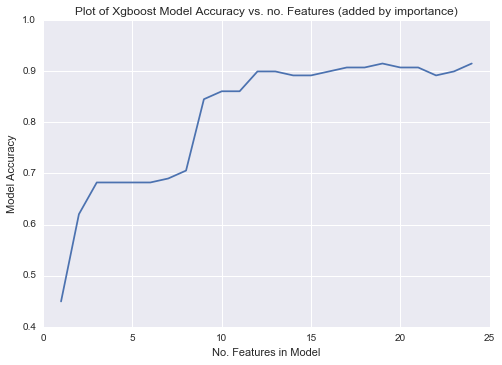

In [120]:
# Set target variable name

featList = [x[1] for x in list_tuple]
n = [10,20,30,40,50,100,150,200,250,300,400,500]
m = [1,3,5,7,9,11]
params = {'n_estimators': n,'max_depth': m}
evalMetric = "merror"

gbm = xgb.XGBClassifier(n_estimators=20, objective = 'multi:softprob', learning_rate=0.1)

score, precisionDF, recallDF, f1ScoreDF = featureReduction(gbm,le,trainDF,testDF,featList,10,2.5,params,\
                                                           evalMetric,'Xgboost')


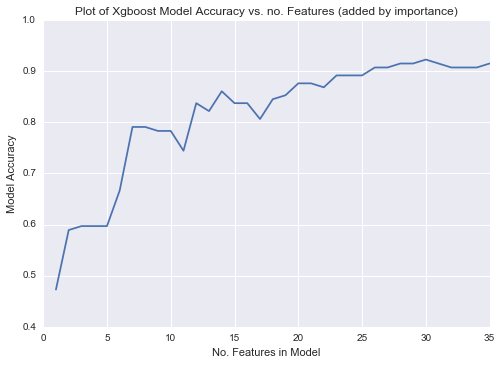

In [44]:
# Produce a plot of model score vs. no. features (added in order of importance)
x=range(1,len(score)+1)
sns.set()
ax = plt.axes()
plt.plot(x,score)
ax.set_ylabel('Model Accuracy')
ax.set_xlabel('No. Features in Model')
plt.title('Plot of '+ modelName + ' Model Accuracy vs. no. Features (added by importance)')

In [45]:
# Tranpose the matrices into correct orientation for plotting function
precisionDF = precisionDF.T
recallDF = recallDF.T
f1ScoreDF = f1ScoreDF.T

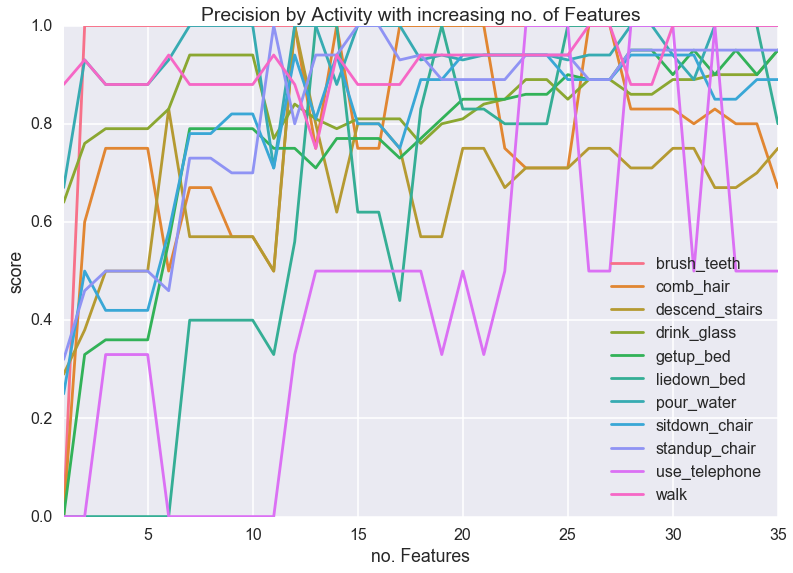

In [46]:
outputMetricsPlot(le,precisionDF,'Precision')

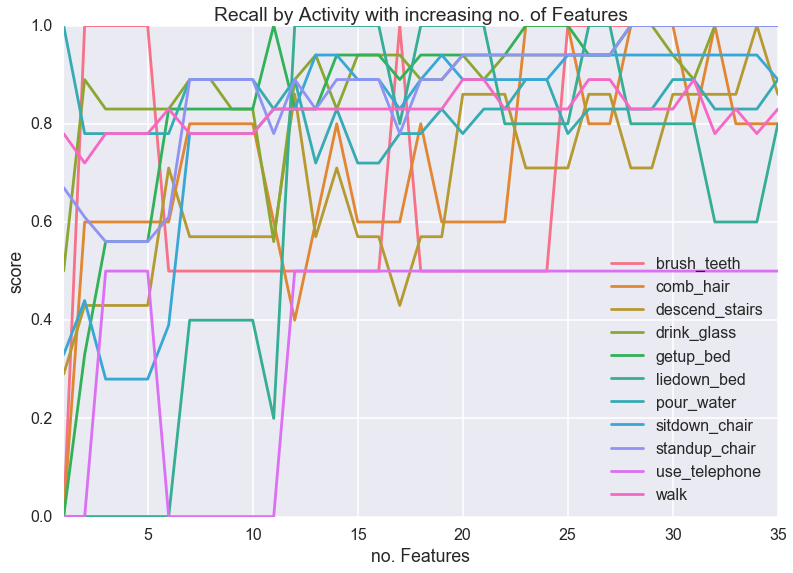

In [47]:
outputMetricsPlot(le,recallDF,'Recall')

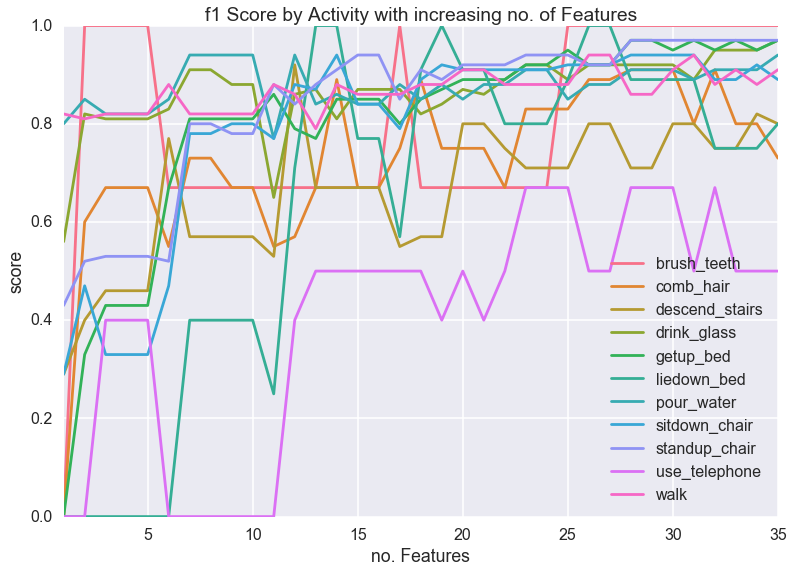

In [48]:
outputMetricsPlot(le,f1ScoreDF,'f1 Score')

## Feature Reduction & Artificially Boosting Samples

From a review of the no. of samples for each activity, it can be seen that brush_teeth, use_telephone, liedown_bed and comb_hair have relatively small number of examples compared to the other activities.  As a first trial increase the number of examples by making duplicates and appending them to the features dataframe

In [49]:
DF = trainDF.copy()
temp = DF[DF['activity']==le.transform('brush_teeth')]
DF = pd.concat((DF,temp,temp))
temp = DF[DF['activity']==le.transform('use_telephone')]
DF = pd.concat((DF,temp,temp))
temp = DF[DF['activity']==le.transform('liedown_bed')]
DF = pd.concat((DF,temp))
temp = DF[DF['activity']==le.transform('comb_hair')]
DF = pd.concat((DF,temp))
dupTrainDF = DF
dupTrainDF.groupby('activity').count()

,x_max,y_max,z_max,tot_max,x_min,y_min,z_min,tot_min,x_mean,y_mean,...,ExBZ15,crossXrate,crossYrate,crossZrate,meanAmpX,meanAmpY,meanAmpZ,apfX,apfY,apfZ
activity,,,,,,,,,,,,,,,,,,,,,
0,27,27,27,27,27,27,27,27,27,27,...,27,27,27,27,27,27,27,27,27,27
1,46,46,46,46,46,46,46,46,46,46,...,46,46,46,46,46,46,46,46,46,46
2,31,31,31,31,31,31,31,31,31,31,...,31,31,31,31,31,31,31,31,31,31
3,72,72,72,72,72,72,72,72,72,72,...,72,72,72,72,72,72,72,72,72,72
4,73,73,73,73,73,73,73,73,73,73,...,73,73,73,73,73,73,73,73,73,73
5,42,42,42,42,42,42,42,42,42,42,...,42,42,42,42,42,42,42,42,42,42
6,72,72,72,72,72,72,72,72,72,72,...,72,72,72,72,72,72,72,72,72,72
7,72,72,72,72,72,72,72,72,72,72,...,72,72,72,72,72,72,72,72,72,72
8,74,74,74,74,74,74,74,74,74,74,...,74,74,74,74,74,74,74,74,74,74


In [50]:
# Set target variable name
target = ['activity']

# Set X and y
X_train = dupTrainDF.drop(target, axis=1)
y_train = np.array(dupTrainDF[target].astype(float))
y_train = np.reshape(y_train,[len(y_train),])
X_test = testDF.drop(target, axis=1)
y_test = np.array(testDF[target].astype(float))
y_test = np.reshape(y_test,[len(y_test),])

Initialise classifier and fit model

In [51]:
gbm = xgb.XGBClassifier(n_estimators=20, objective = 'multi:softprob', learning_rate=0.1)
gbm.fit(X_train, y_train, eval_metric = "merror")

XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=20, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)

Review results of model and confusion matrices

The smallest (winning) predicted activity probability is 0.0915905
The largest (winning) predicted activity probability is 0.815621

 NB: a winning probability represents the max probability output by the classifier for that input


     maxProba  MaxProbRatio   predActivity    actActivity    outputActivity
11   0.448863      0.556124  standup_chair  standup_chair  unknown_activity
12   0.316179      0.236629  standup_chair  standup_chair  unknown_activity
33   0.138665      0.386161           walk  sitdown_chair  unknown_activity
44   0.091591      0.000404  sitdown_chair           walk  unknown_activity
45   0.219334      0.173354           walk           walk  unknown_activity
87   0.103797      0.014921     pour_water     pour_water  unknown_activity
102  0.393868      0.202790      comb_hair    liedown_bed  unknown_activity
106  0.174793      0.239156    liedown_bed    liedown_bed  unknown_activity
114  0.117304      0.316907      getup_bed      getup_bed  unknown_activity
122  0.

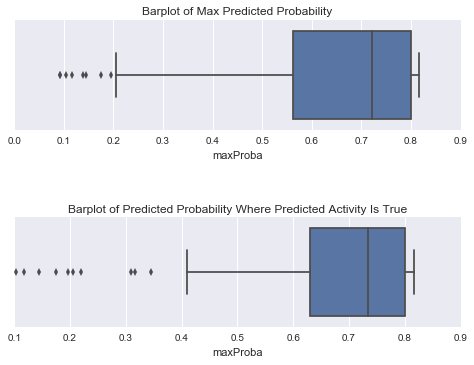

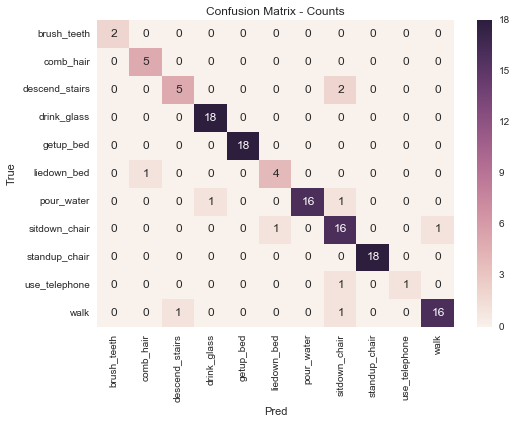

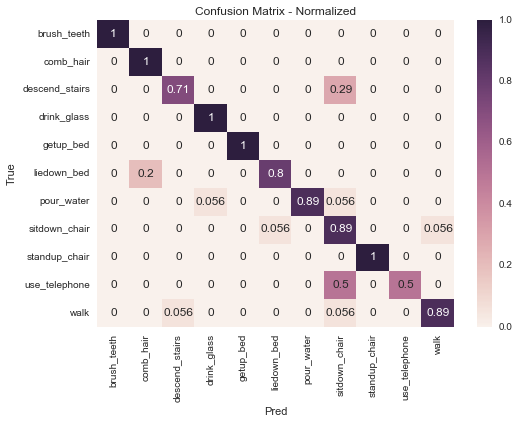



Applying confidence threshold and classifying all below as unknown_activity


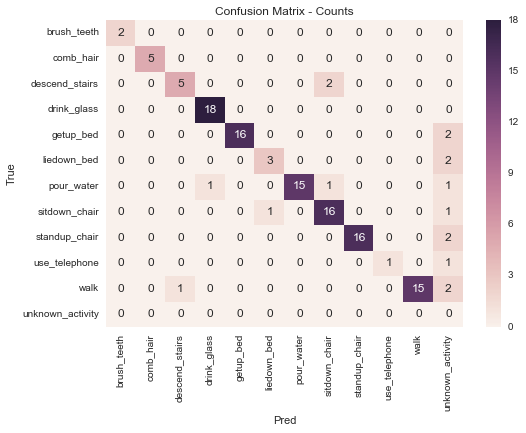

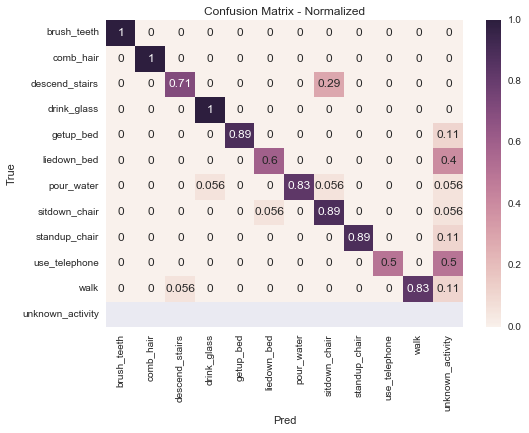

In [52]:
xgb_proba = reviewPredictions(le,gbm,X_test,y_test,0.6)
y_pred = gbm.predict(X_test)
createConfusionMatrix(le,y_pred,y_test)
print "\n\nApplying confidence threshold and classifying all below as unknown_activity"
createConfusionMatrix(le,y_pred,y_test,cmType = 'modified', probDF = xgb_proba)

Use a gridsearch to optimise no. estimators and max depth hyperparameters

In [53]:
# Set list of values to grid search over
n = [10,20,30,40,50,100,150,200,250,300,400,500,600]
m = [1,3,5,7,9,11]

params = {'n_estimators': n,'max_depth': m}

newXGB = optimiseParameters(X_train, y_train, X_test, y_test, gbm, params, 1)

Fitting 3 folds for each of 78 candidates, totalling 234 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:   50.8s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:  5.4min
[Parallel(n_jobs=1)]: Done 234 out of 234 | elapsed:  6.5min finished


Best Params:
{'n_estimators': 500, 'max_depth': 1}
Accuracy of current model: 0.922
Accuracy using best param: 0.930
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=20, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.922
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.930


The smallest (winning) predicted activity probability is 0.347706
The largest (winning) predicted activity probability is 0.999936

 NB: a winning probability represents the max probability output by the classifier for that input


    maxProba  MaxProbRatio    predActivity     actActivity    outputActivity
12  0.536552      0.255817       getup_bed   standup_chair  unknown_activity
33  0.408360      0.448657   standup_chair   sitdown_chair  unknown_activity
44  0.347706      0.192354       getup_bed            walk  unknown_activity
59  0.448279      0.189355  descend_stairs  descend_stairs  unknown_activity
87  0.490545      0.069029      pour_water      pour_water  unknown_activity

Correct Predictions: 						120
No. Incorrect Predictions: 					9
No. Predictions marked as Unknown Activities:			5
No. Incorrect Predictions not marked as Unknown Activites:	6


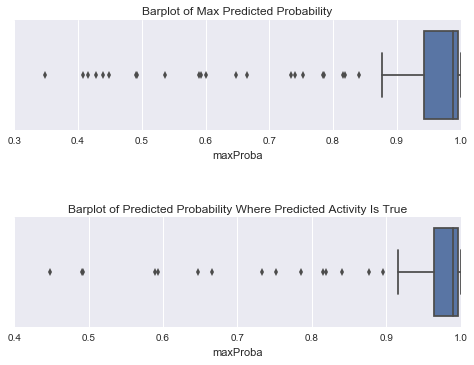

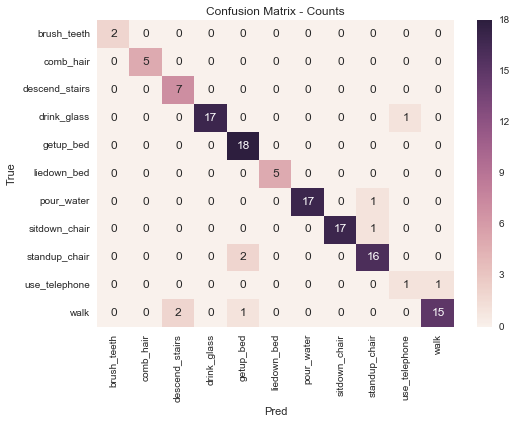

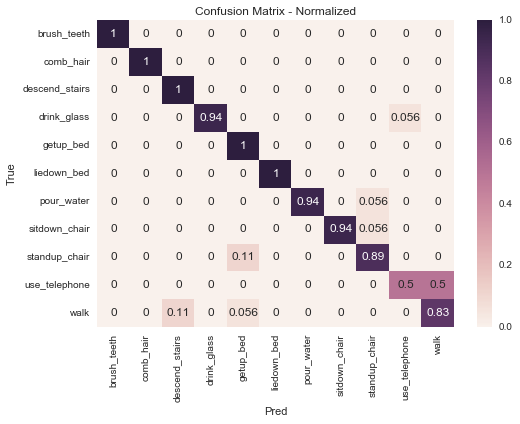



Applying confidence threshold and classifying all below as unknown_activity


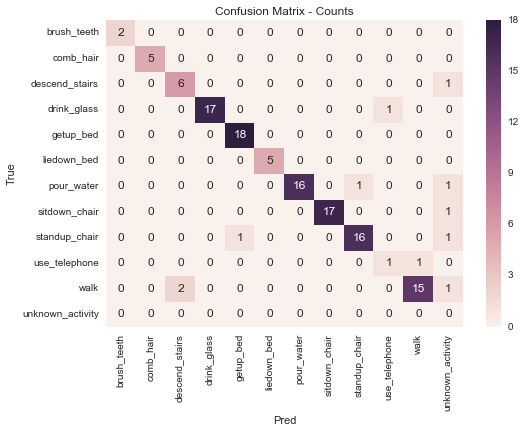

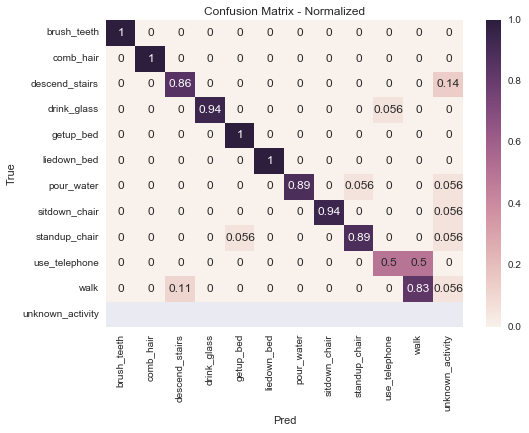

In [54]:
xgb_proba = reviewPredictions(le,newXGB,X_test,y_test,0.6)
y_pred = gbm.predict(X_test)
createConfusionMatrix(le,y_pred,y_test)
print "\n\nApplying confidence threshold and classifying all below as unknown_activity"
createConfusionMatrix(le,y_pred,y_test,cmType = 'modified', probDF = xgb_proba)

Calculate feature importance of the optimised model

Run: 92 of 92

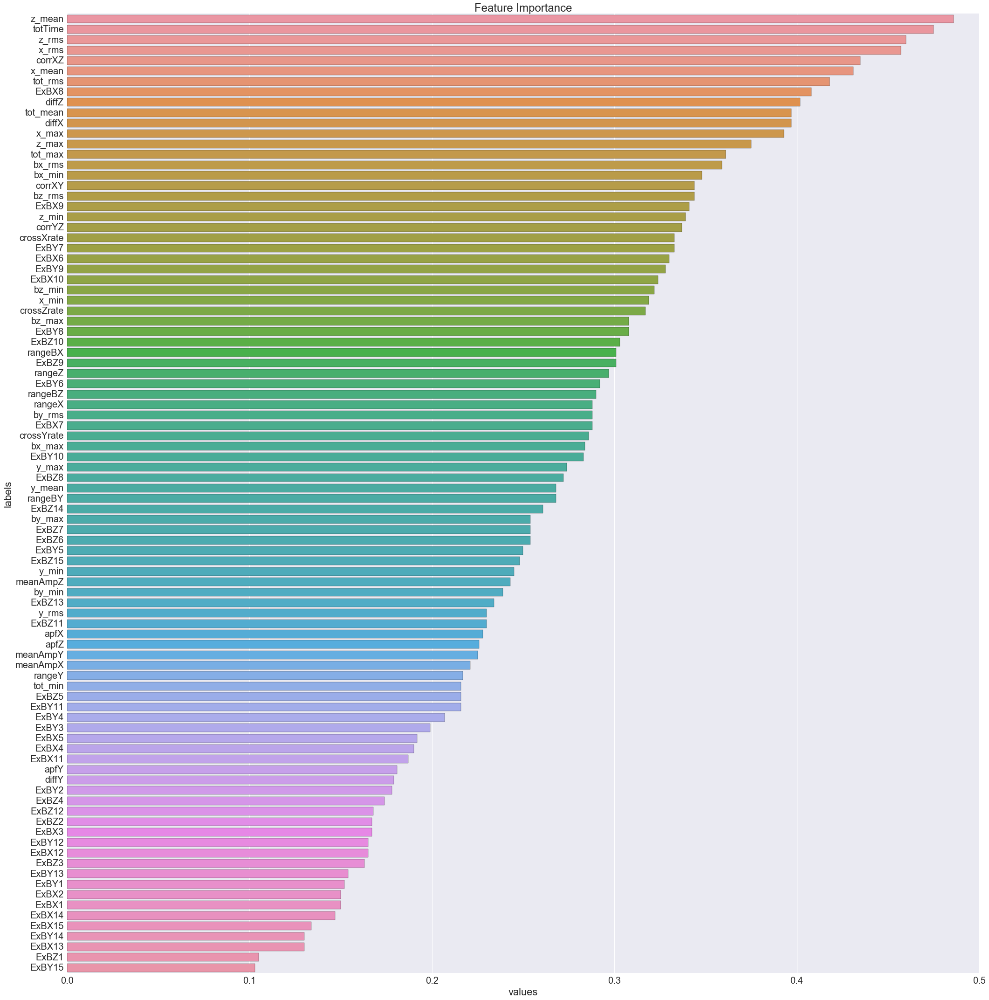

In [55]:
list_tuple = calculateFeatureImportance(newXGB,X_train,y_train,"dup_xgb_features.jpg")

Using the features ranked by importance, iterate through building models with more and more features, optimise hyperparameters and output accuracy score.  These will then be plotted in an attempt to determine the most efficient (and acceptable) number of features

Outputs saved at: ../Outputs/2016080505-1443Duplicate Data with Xgboost


NEW RUN 1 of 92:Duplicate Data with XgboostClassifier being trained using: ['z_mean'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    3.5s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:   29.2s
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:   35.7s finished


Best Params:
{'n_estimators': 30, 'max_depth': 1}
Accuracy of current model: 0.434
Accuracy using best param: 0.514
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=20, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.434
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=30, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.450
The smallest (winning) predicted activity probability is 0.231184
The largest (winning) predicted activity probability is 0.7428

 NB: a winning probability r

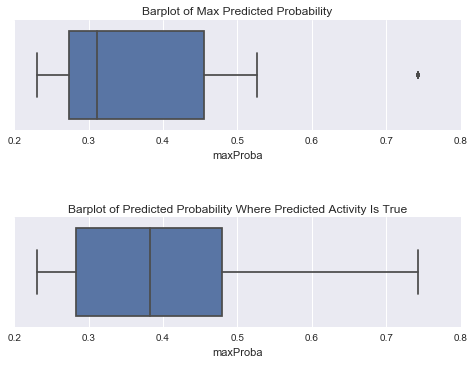

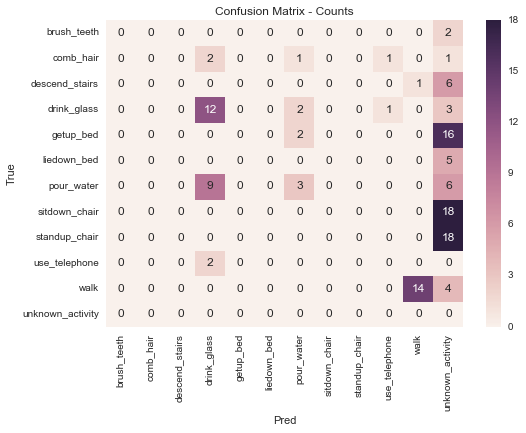

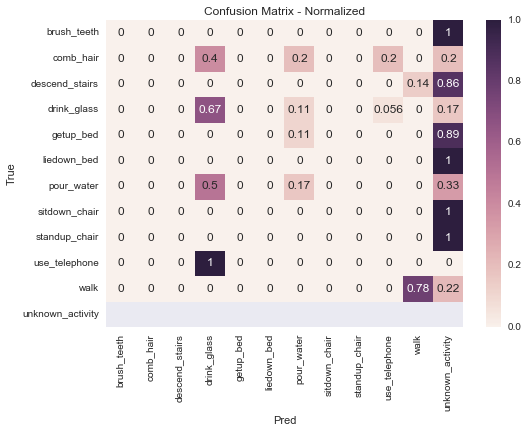


Percent Diff: 349.612403101  Count: 0


NEW RUN 2 of 92:Duplicate Data with XgboostClassifier being trained using: ['z_mean', 'totTime'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    4.4s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:   31.1s
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:   36.3s finished


Best Params:
{'n_estimators': 150, 'max_depth': 1}
Accuracy of current model: 0.527
Accuracy using best param: 0.648
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=30, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.527
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=150, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.620
The smallest (winning) predicted activity probability is 0.263106
The largest (winning) predicted activity probability is 0.987631

 NB: a winning probabili

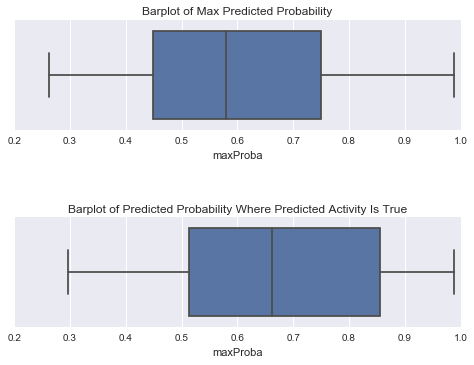

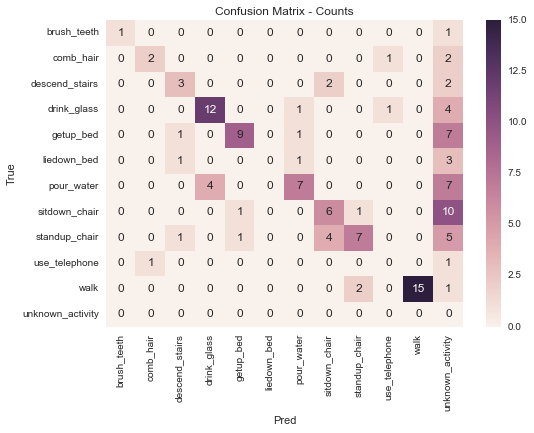

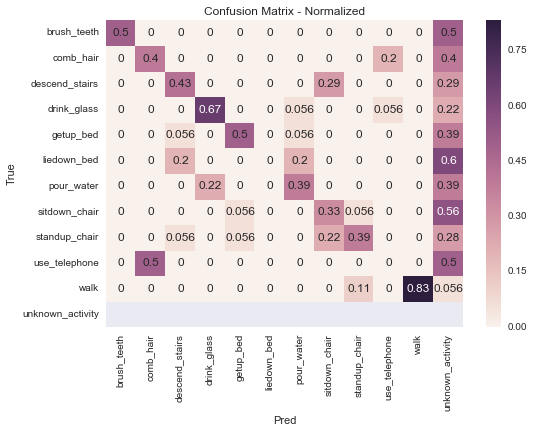


Percent Diff: 37.9310344828  Count: 0


NEW RUN 3 of 92:Duplicate Data with XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    4.0s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:   30.0s
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:   35.2s finished


Best Params:
{'n_estimators': 400, 'max_depth': 1}
Accuracy of current model: 0.690
Accuracy using best param: 0.690
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=150, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.690
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=400, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.682
The smallest (winning) predicted activity probability is 0.345741
The largest (winning) predicted activity probability is 0.997177

 NB: a winning probabil

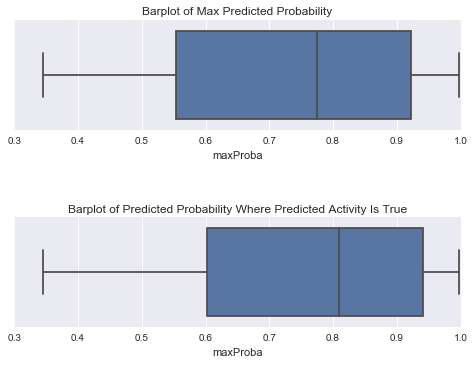

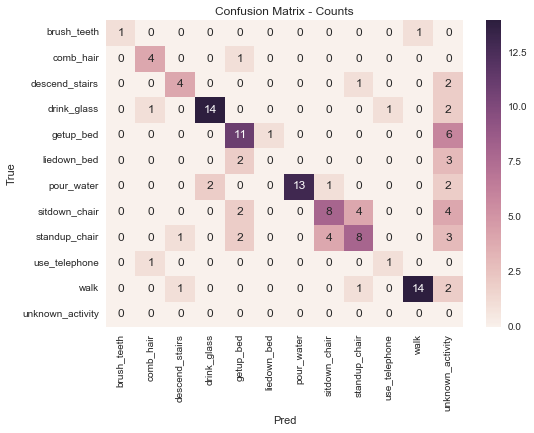

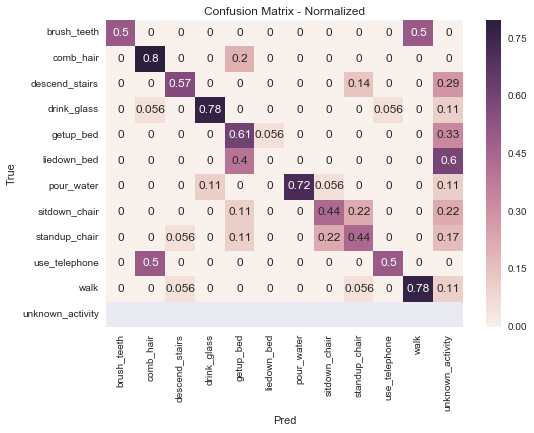


Percent Diff: 10.0  Count: 0


NEW RUN 4 of 92:Duplicate Data with XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    4.4s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:   34.2s
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:   40.1s finished


Best Params:
{'n_estimators': 400, 'max_depth': 1}
Accuracy of current model: 0.682
Accuracy using best param: 0.690
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=400, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.682
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=400, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.682
The smallest (winning) predicted activity probability is 0.345741
The largest (winning) predicted activity probability is 0.997177

 NB: a winning probabil

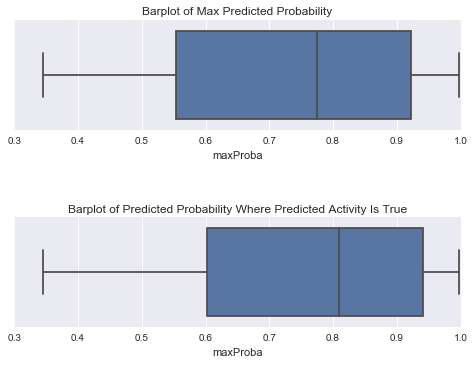

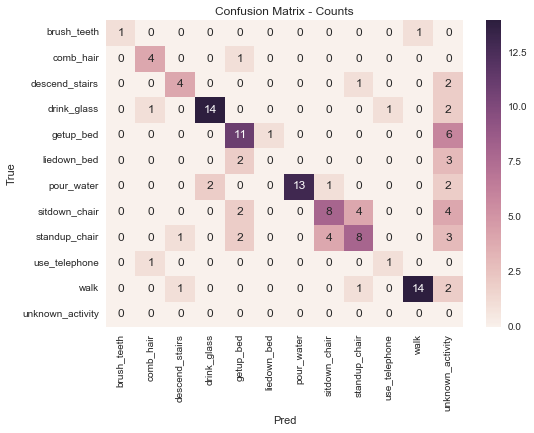

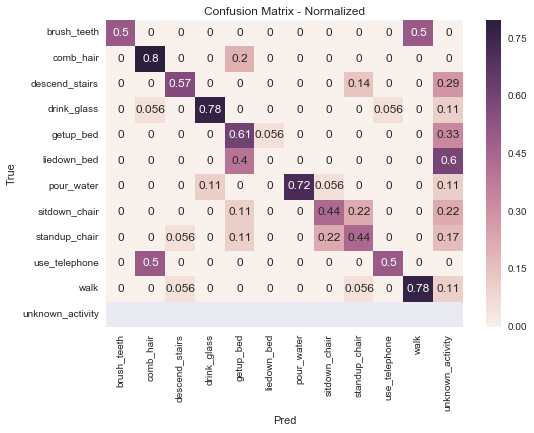


Percent Diff: 0.0  Count: 0


NEW RUN 5 of 92:Duplicate Data with XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    4.7s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:   38.4s
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:   45.1s finished


Best Params:
{'n_estimators': 400, 'max_depth': 1}
Accuracy of current model: 0.682
Accuracy using best param: 0.690
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=400, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.682
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=400, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.682
The smallest (winning) predicted activity probability is 0.345741
The largest (winning) predicted activity probability is 0.997177

 NB: a winning probabil

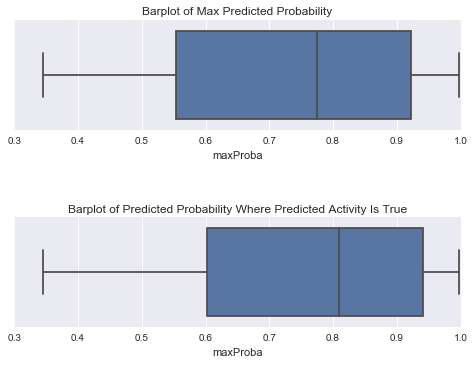

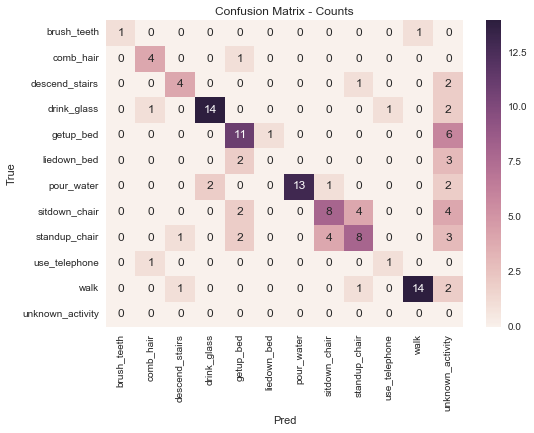

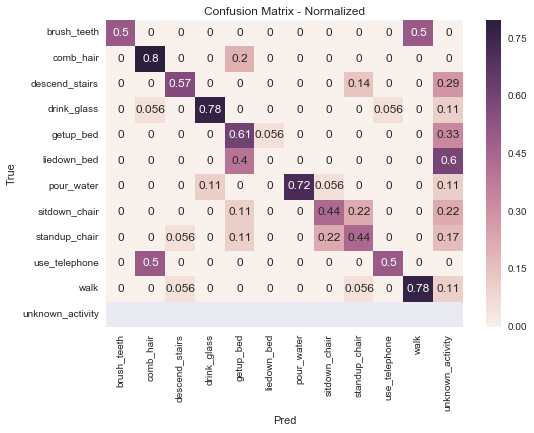


Percent Diff: 0.0  Count: 0


NEW RUN 6 of 92:Duplicate Data with XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    5.1s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:   42.6s
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:   50.0s finished


Best Params:
{'n_estimators': 400, 'max_depth': 1}
Accuracy of current model: 0.682
Accuracy using best param: 0.690
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=400, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.682
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=400, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.682
The smallest (winning) predicted activity probability is 0.345741
The largest (winning) predicted activity probability is 0.997177

 NB: a winning probabil

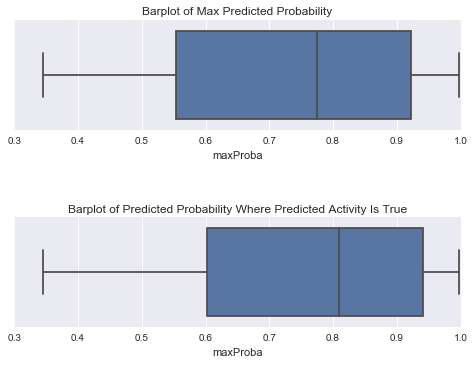

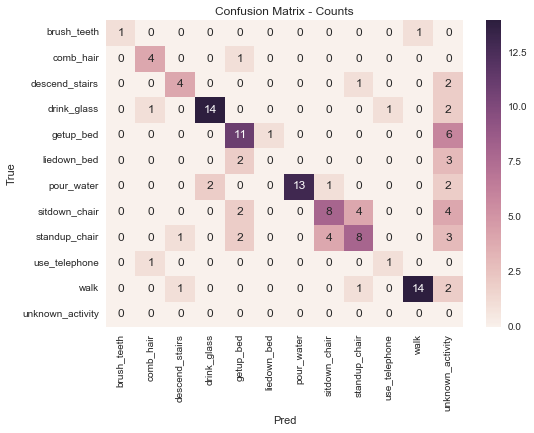

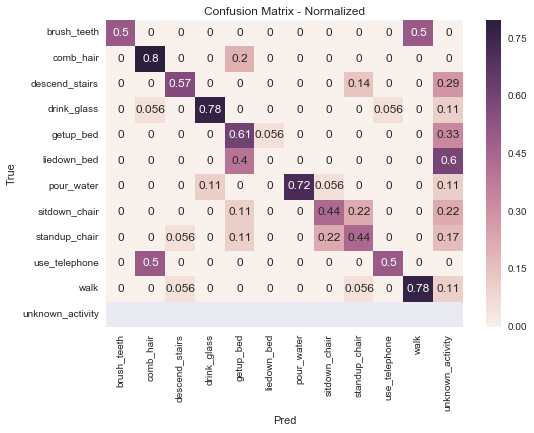


Percent Diff: 0.0  Count: 0


NEW RUN 7 of 92:Duplicate Data with XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    5.6s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:   45.6s
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:   53.5s finished


Best Params:
{'n_estimators': 500, 'max_depth': 7}
Accuracy of current model: 0.667
Accuracy using best param: 0.707
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=400, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.667
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=7,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.690
The smallest (winning) predicted activity probability is 0.192437
The largest (winning) predicted activity probability is 0.999294

 NB: a winning probabil

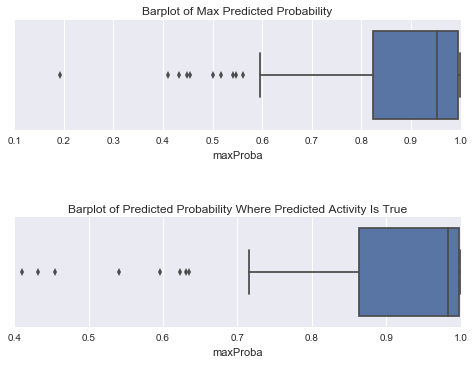

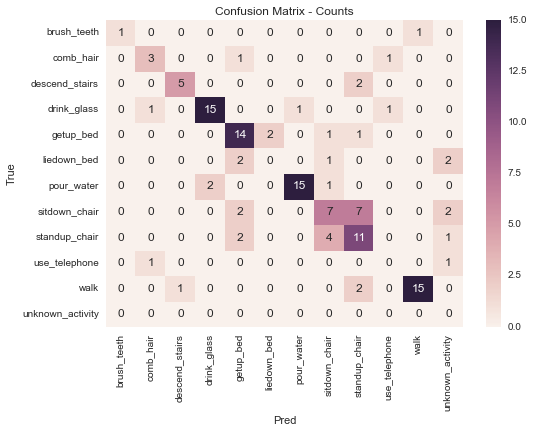

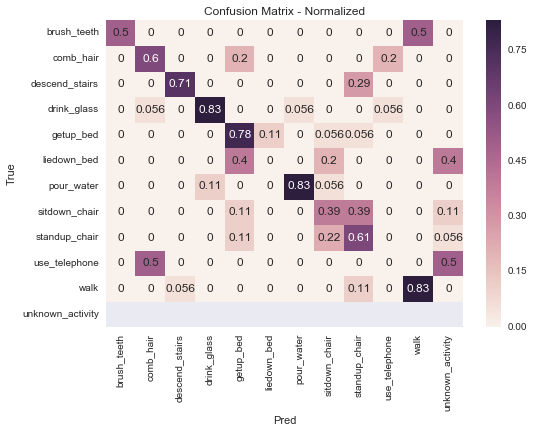


Percent Diff: 1.13636363636  Count: 1


NEW RUN 8 of 92:Duplicate Data with XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    6.0s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:   45.6s
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:   53.2s finished


Best Params:
{'n_estimators': 250, 'max_depth': 5}
Accuracy of current model: 0.721
Accuracy using best param: 0.754
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=7,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.721
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=250, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.705
The smallest (winning) predicted activity probability is 0.310346
The largest (winning) predicted activity probability is 0.999223

 NB: a winning probabil

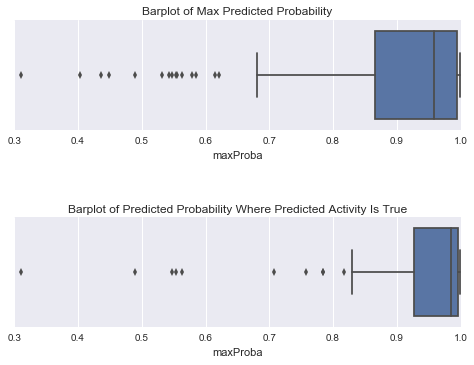

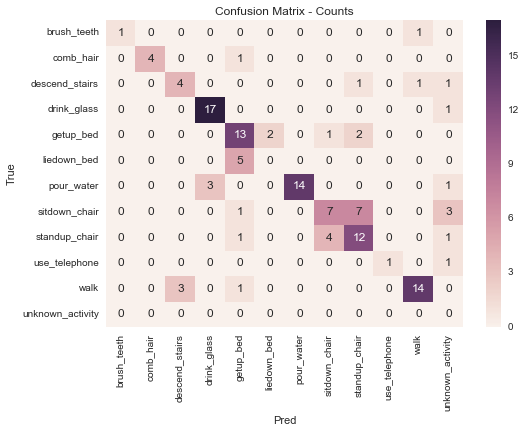

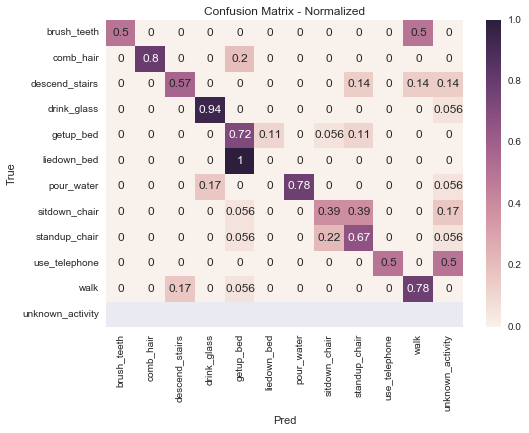


Percent Diff: 2.24719101124  Count: 2


NEW RUN 9 of 92:Duplicate Data with XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    6.6s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:   44.2s
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:   51.3s finished


Best Params:
{'n_estimators': 250, 'max_depth': 7}
Accuracy of current model: 0.860
Accuracy using best param: 0.809
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=250, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.860
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=7,
       min_child_weight=1, missing=None, n_estimators=250, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.845
The smallest (winning) predicted activity probability is 0.205873
The largest (winning) predicted activity probability is 0.999441

 NB: a winning probabil

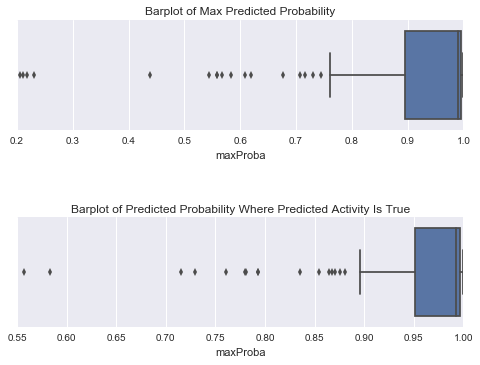

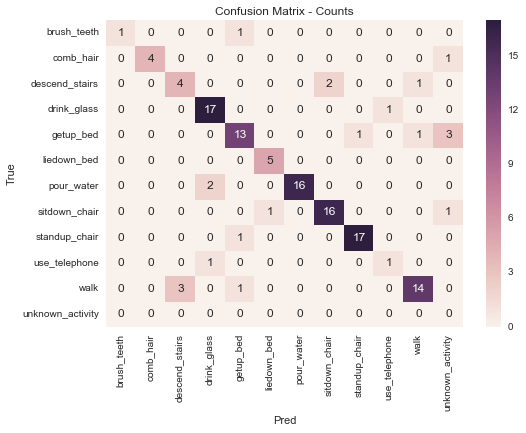

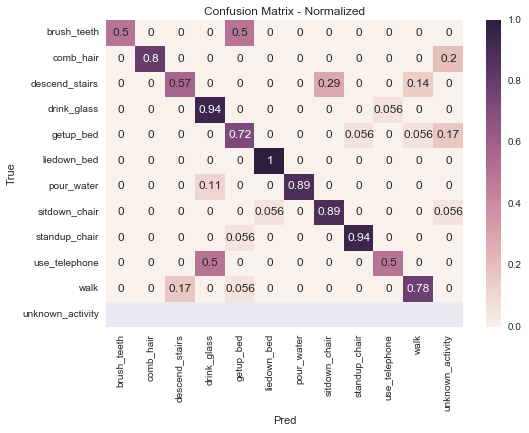


Percent Diff: 19.7802197802  Count: 2


NEW RUN 10 of 92:Duplicate Data with XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    6.9s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:   51.4s
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:  1.0min finished


Best Params:
{'n_estimators': 500, 'max_depth': 7}
Accuracy of current model: 0.860
Accuracy using best param: 0.813
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=7,
       min_child_weight=1, missing=None, n_estimators=250, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.860
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=7,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.860
The smallest (winning) predicted activity probability is 0.184806
The largest (winning) predicted activity probability is 0.999752

 NB: a winning probabil

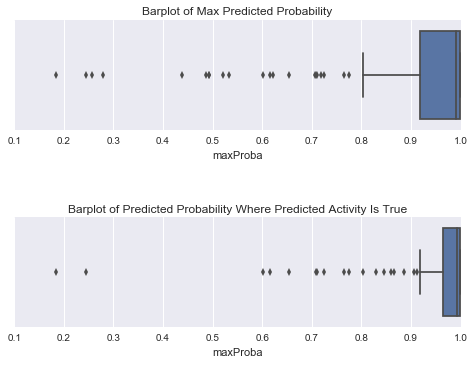

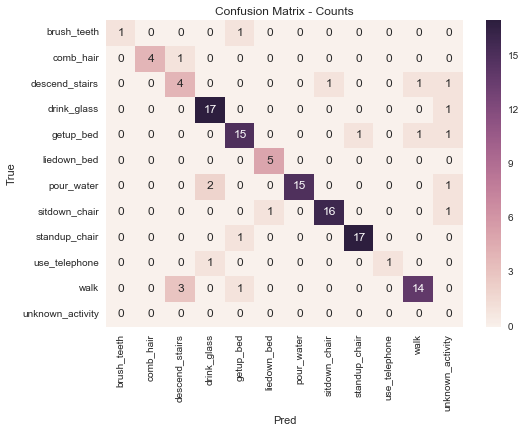

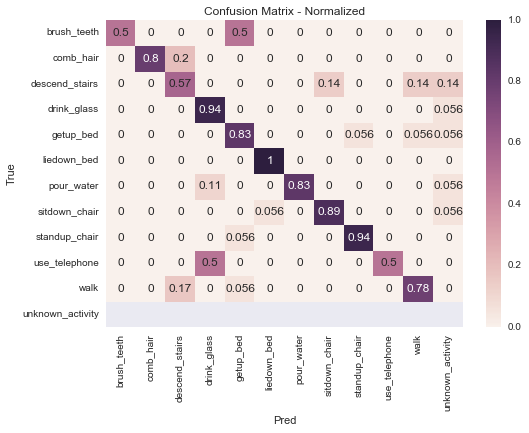


Percent Diff: 1.83486238532  Count: 3


NEW RUN 11 of 92:Duplicate Data with XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean', 'diffX'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    7.4s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:   51.1s
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:   59.3s finished


Best Params:
{'n_estimators': 500, 'max_depth': 7}
Accuracy of current model: 0.860
Accuracy using best param: 0.813
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=7,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.860
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=7,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.860
The smallest (winning) predicted activity probability is 0.184806
The largest (winning) predicted activity probability is 0.999752

 NB: a winning probabil

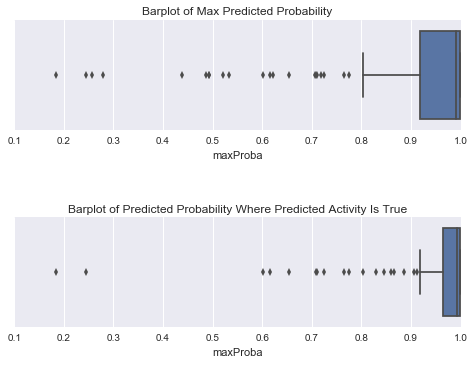

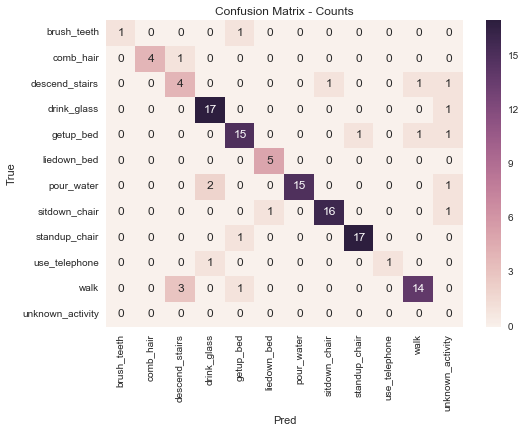

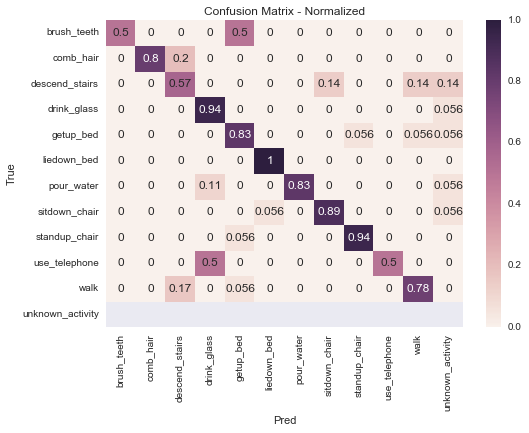


Percent Diff: 0.0  Count: 3


NEW RUN 12 of 92:Duplicate Data with XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean', 'diffX', 'x_max'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    7.9s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:   53.7s
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:  1.0min finished


Best Params:
{'n_estimators': 300, 'max_depth': 3}
Accuracy of current model: 0.899
Accuracy using best param: 0.809
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=7,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.899
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=300, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.899
The smallest (winning) predicted activity probability is 0.295832
The largest (winning) predicted activity probability is 0.999801

 NB: a winning probabil

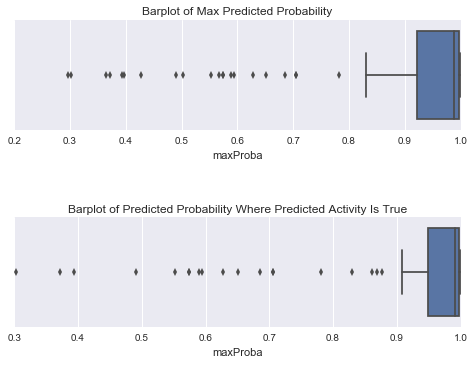

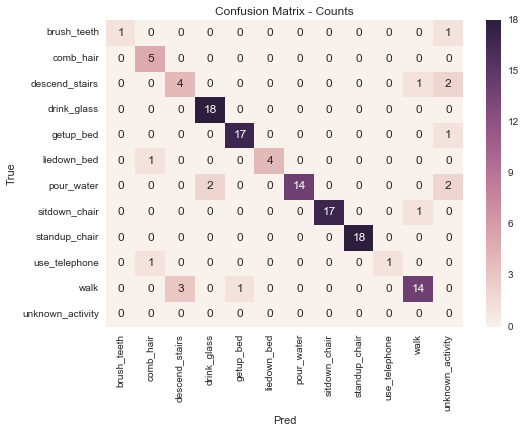

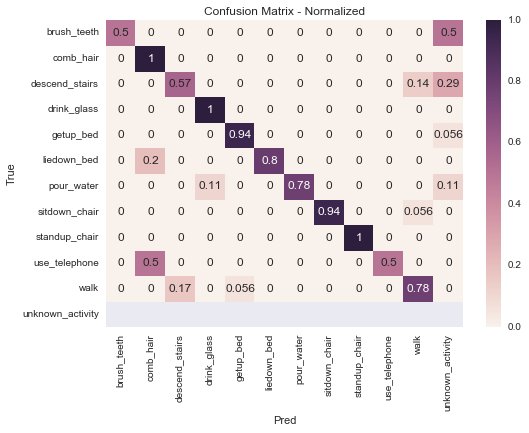


Percent Diff: 4.5045045045  Count: 3


NEW RUN 13 of 92:Duplicate Data with XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean', 'diffX', 'x_max', 'z_max'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    8.2s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:   56.6s
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:  1.1min finished


Best Params:
{'n_estimators': 300, 'max_depth': 3}
Accuracy of current model: 0.899
Accuracy using best param: 0.809
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=300, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.899
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=300, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.899
The smallest (winning) predicted activity probability is 0.295832
The largest (winning) predicted activity probability is 0.999801

 NB: a winning probabil

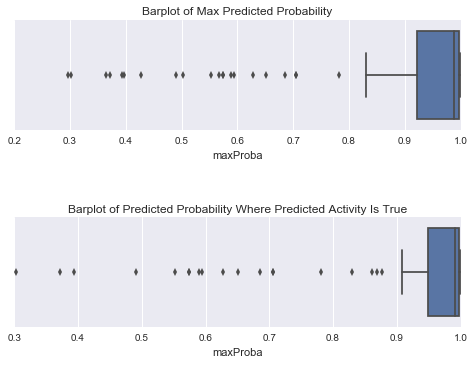

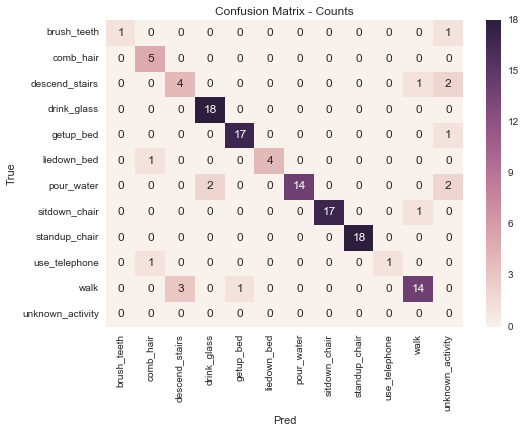

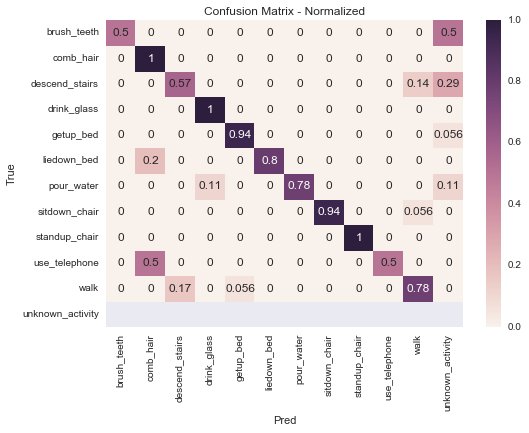


Percent Diff: 0.0  Count: 3


NEW RUN 14 of 92:Duplicate Data with XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean', 'diffX', 'x_max', 'z_max', 'tot_max'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    8.7s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:   58.9s
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:  1.1min finished


Best Params:
{'n_estimators': 300, 'max_depth': 5}
Accuracy of current model: 0.907
Accuracy using best param: 0.817
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=300, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.907
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=300, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.891
The smallest (winning) predicted activity probability is 0.243275
The largest (winning) predicted activity probability is 0.999525

 NB: a winning probabil

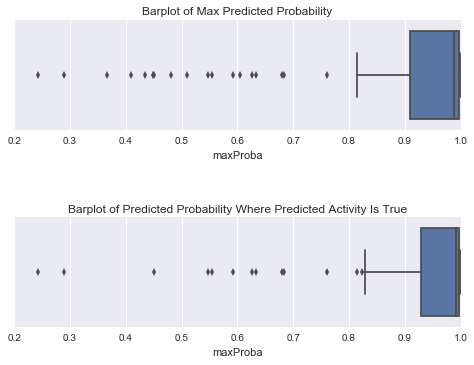

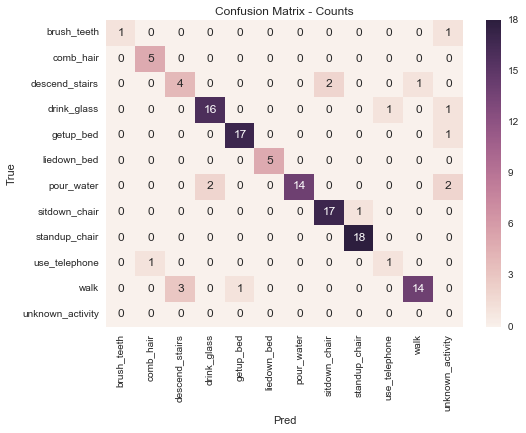

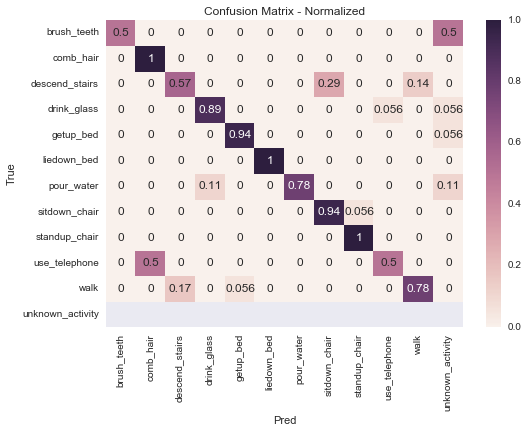


Percent Diff: 0.862068965517  Count: 4


NEW RUN 15 of 92:Duplicate Data with XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean', 'diffX', 'x_max', 'z_max', 'tot_max', 'bx_rms'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    9.2s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:  1.0min
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:  1.2min finished


Best Params:
{'n_estimators': 100, 'max_depth': 3}
Accuracy of current model: 0.876
Accuracy using best param: 0.817
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=300, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.876
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=100, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.891
The smallest (winning) predicted activity probability is 0.200038
The largest (winning) predicted activity probability is 0.997897

 NB: a winning probabil

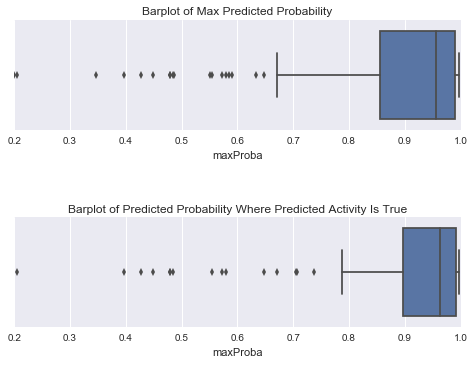

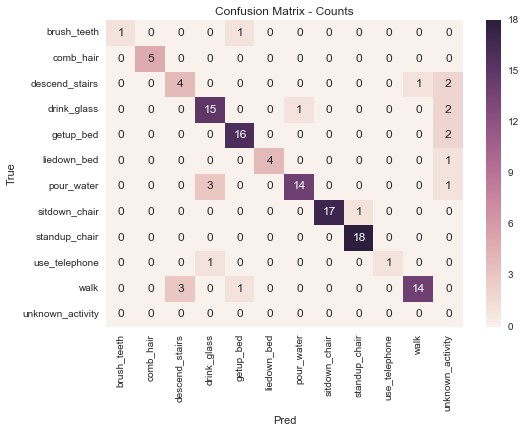

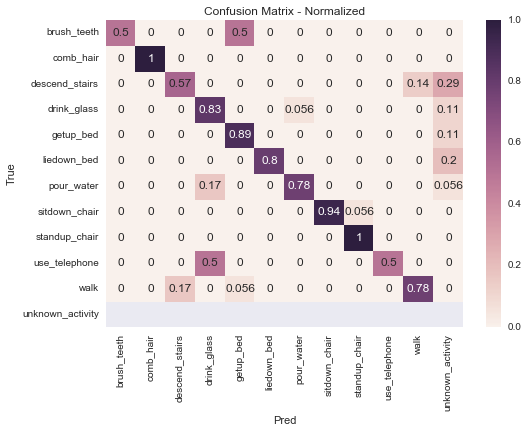


Percent Diff: 0.0  Count: 4


NEW RUN 16 of 92:Duplicate Data with XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean', 'diffX', 'x_max', 'z_max', 'tot_max', 'bx_rms', 'bx_min'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    9.6s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:  1.1min
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:  1.3min finished


Best Params:
{'n_estimators': 300, 'max_depth': 5}
Accuracy of current model: 0.899
Accuracy using best param: 0.815
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=100, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.899
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=300, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.899
The smallest (winning) predicted activity probability is 0.26022
The largest (winning) predicted activity probability is 0.999476

 NB: a winning probabili

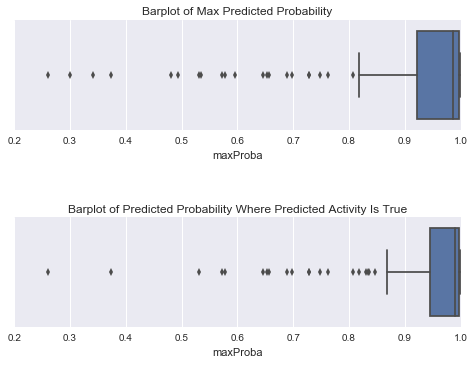

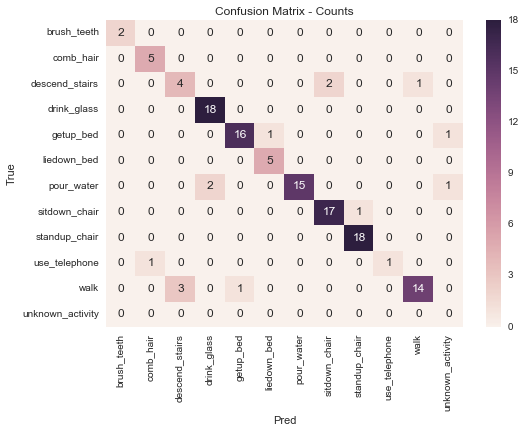

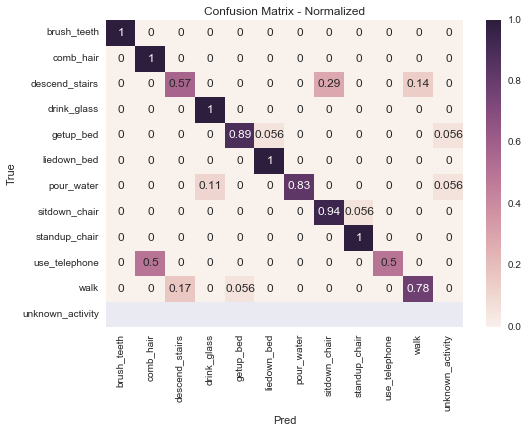


Percent Diff: 0.869565217391  Count: 5


NEW RUN 17 of 92:Duplicate Data with XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean', 'diffX', 'x_max', 'z_max', 'tot_max', 'bx_rms', 'bx_min', 'corrXY'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    9.9s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:  1.1min
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:  1.2min finished


Best Params:
{'n_estimators': 250, 'max_depth': 5}
Accuracy of current model: 0.907
Accuracy using best param: 0.877
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=300, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.907
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=250, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.907
The smallest (winning) predicted activity probability is 0.254388
The largest (winning) predicted activity probability is 0.999299

 NB: a winning probabil

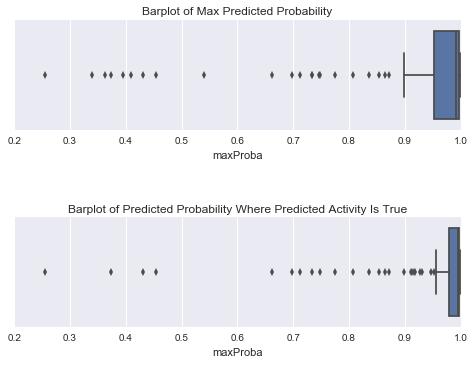

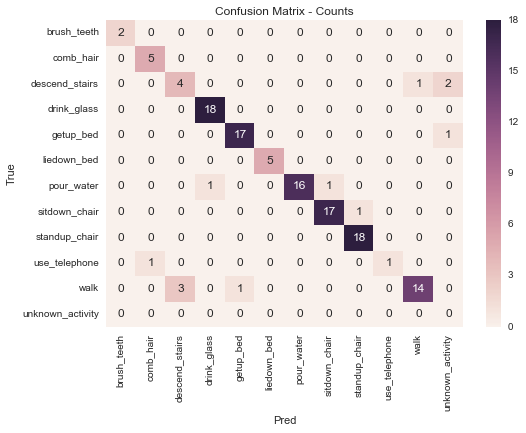

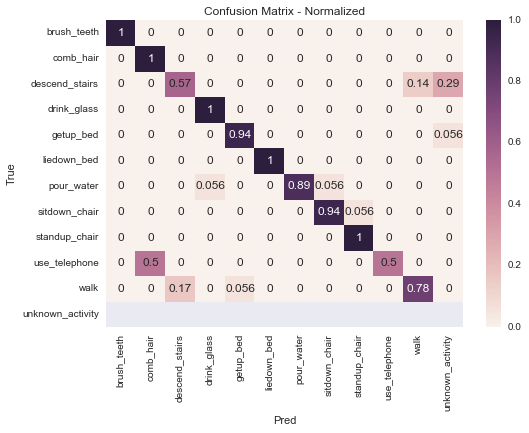


Percent Diff: 0.862068965517  Count: 6


NEW RUN 18 of 92:Duplicate Data with XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean', 'diffX', 'x_max', 'z_max', 'tot_max', 'bx_rms', 'bx_min', 'corrXY', 'bz_rms'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:   10.4s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:  1.1min
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:  1.3min finished


Best Params:
{'n_estimators': 300, 'max_depth': 5}
Accuracy of current model: 0.907
Accuracy using best param: 0.885
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=250, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.907
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=300, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.907
The smallest (winning) predicted activity probability is 0.346638
The largest (winning) predicted activity probability is 0.999508

 NB: a winning probabil

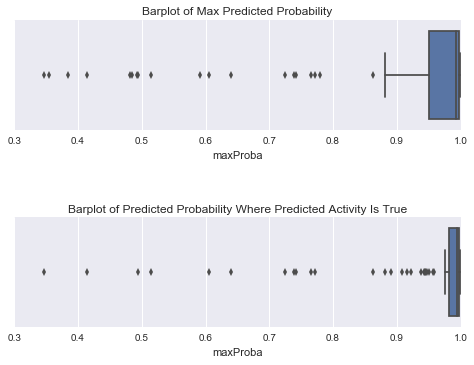

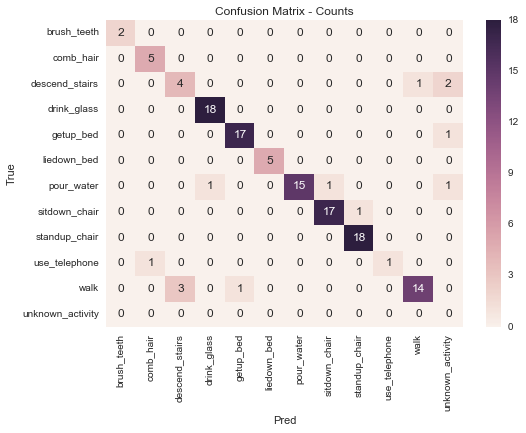

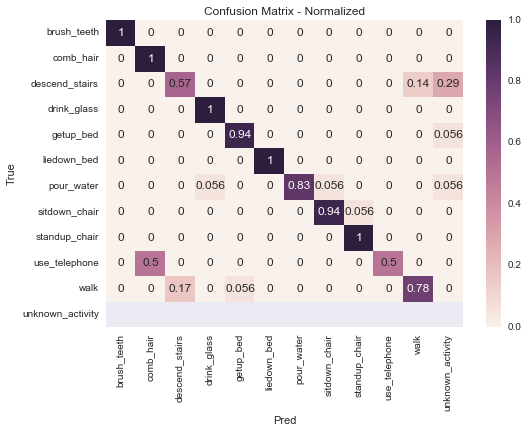


Percent Diff: 0.0  Count: 6


NEW RUN 19 of 92:Duplicate Data with XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean', 'diffX', 'x_max', 'z_max', 'tot_max', 'bx_rms', 'bx_min', 'corrXY', 'bz_rms', 'ExBX9'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:   10.8s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed: 37.0min
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed: 37.2min finished


Best Params:
{'n_estimators': 500, 'max_depth': 5}
Accuracy of current model: 0.915
Accuracy using best param: 0.879
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=300, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.915
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.915
The smallest (winning) predicted activity probability is 0.322255
The largest (winning) predicted activity probability is 0.999731

 NB: a winning probabil

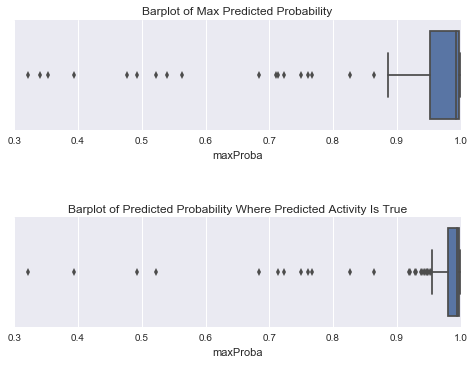

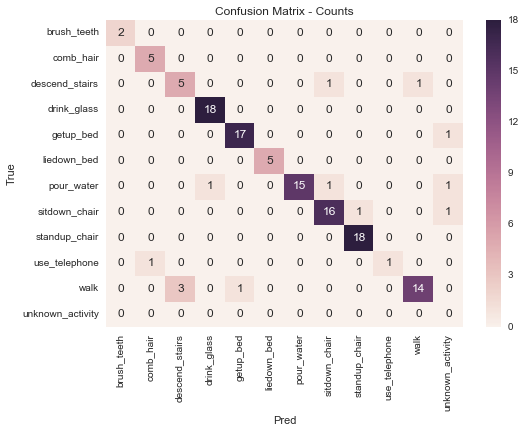

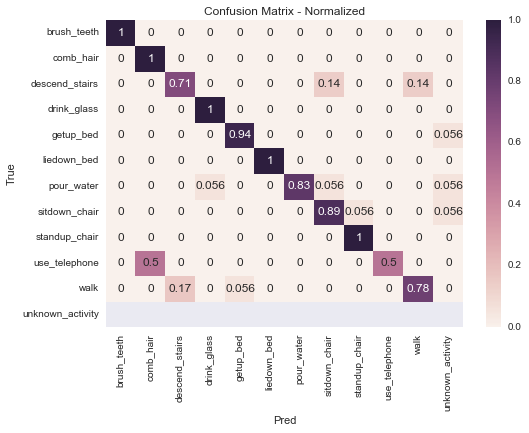


Percent Diff: 0.854700854701  Count: 7


NEW RUN 20 of 92:Duplicate Data with XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean', 'diffX', 'x_max', 'z_max', 'tot_max', 'bx_rms', 'bx_min', 'corrXY', 'bz_rms', 'ExBX9', 'z_min'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:   13.1s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:  1.4min
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:  1.6min finished


Best Params:
{'n_estimators': 500, 'max_depth': 1}
Accuracy of current model: 0.915
Accuracy using best param: 0.877
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.915
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.907
The smallest (winning) predicted activity probability is 0.300494
The largest (winning) predicted activity probability is 0.999634

 NB: a winning probabil

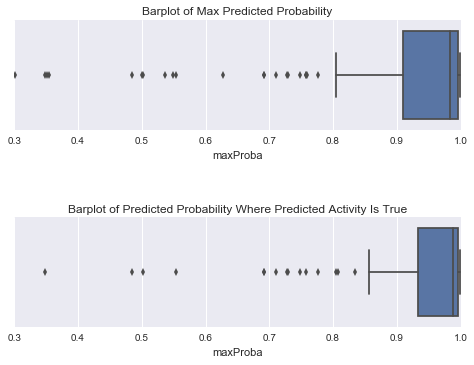

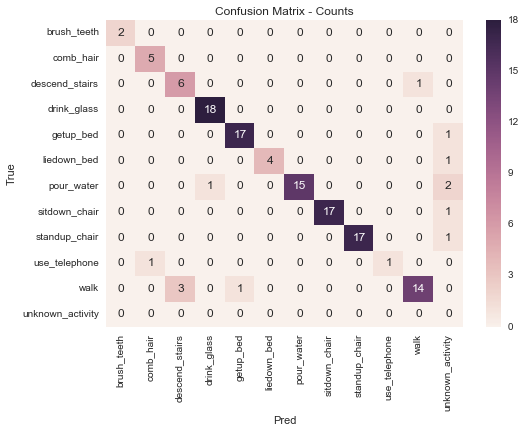

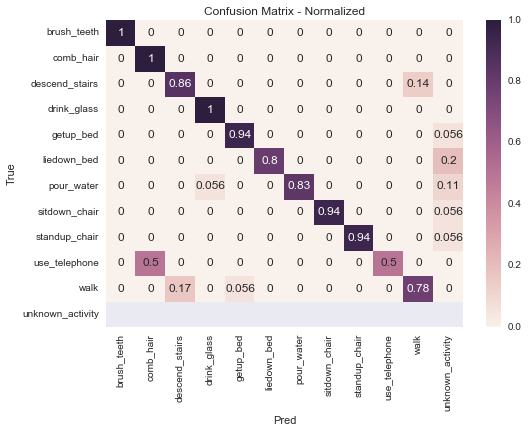


Percent Diff: 0.847457627119  Count: 8


NEW RUN 21 of 92:Duplicate Data with XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean', 'diffX', 'x_max', 'z_max', 'tot_max', 'bx_rms', 'bx_min', 'corrXY', 'bz_rms', 'ExBX9', 'z_min', 'corrYZ'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:   13.9s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:  1.5min
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:  1.7min finished


Best Params:
{'n_estimators': 500, 'max_depth': 1}
Accuracy of current model: 0.907
Accuracy using best param: 0.877
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.907
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.907
The smallest (winning) predicted activity probability is 0.300494
The largest (winning) predicted activity probability is 0.999634

 NB: a winning probabil

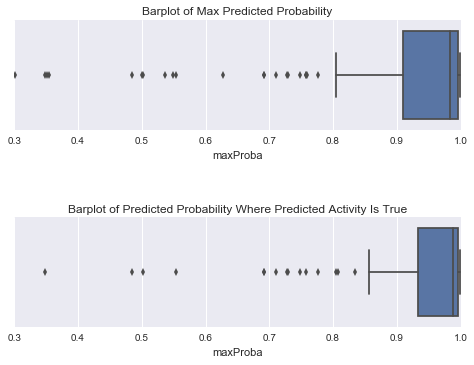

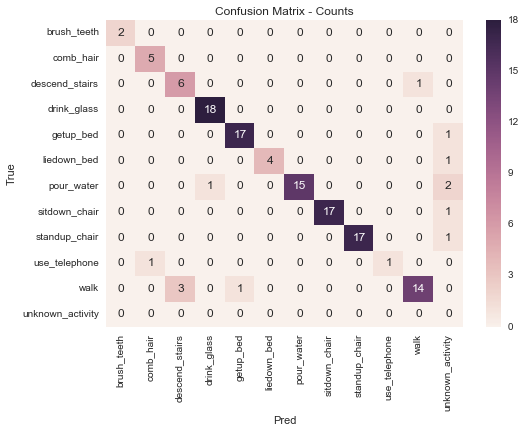

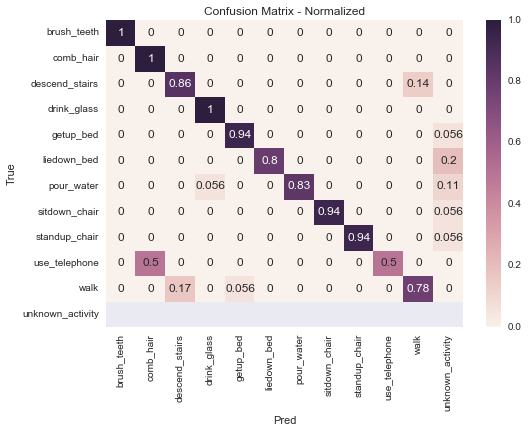


Percent Diff: 0.0  Count: 8


NEW RUN 22 of 92:Duplicate Data with XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean', 'diffX', 'x_max', 'z_max', 'tot_max', 'bx_rms', 'bx_min', 'corrXY', 'bz_rms', 'ExBX9', 'z_min', 'corrYZ', 'crossXrate'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:   13.9s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:  1.3min
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:  1.5min finished


Best Params:
{'n_estimators': 500, 'max_depth': 1}
Accuracy of current model: 0.891
Accuracy using best param: 0.877
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.891
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.891
The smallest (winning) predicted activity probability is 0.318116
The largest (winning) predicted activity probability is 0.999764

 NB: a winning probabil

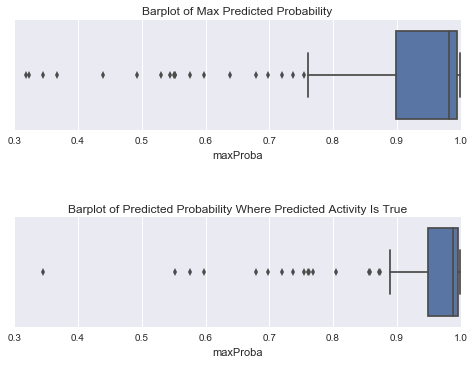

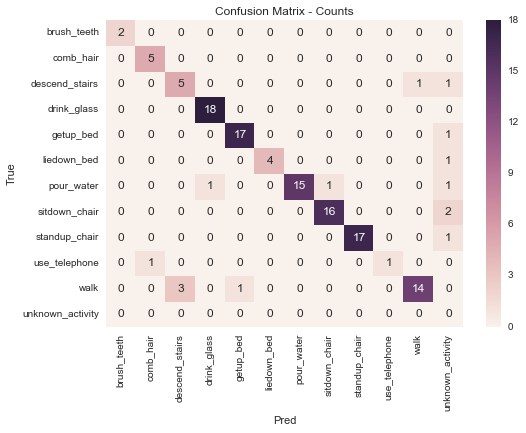

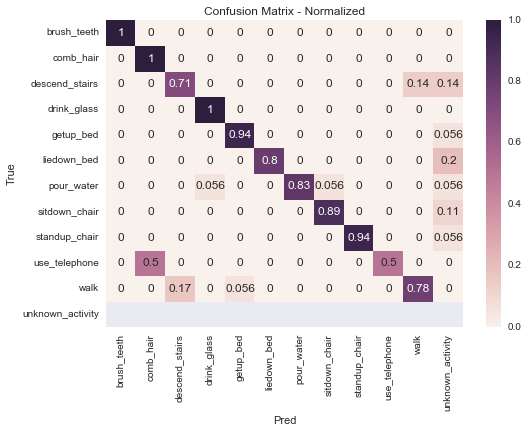


Percent Diff: 1.7094017094  Count: 9


NEW RUN 23 of 92:Duplicate Data with XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean', 'diffX', 'x_max', 'z_max', 'tot_max', 'bx_rms', 'bx_min', 'corrXY', 'bz_rms', 'ExBX9', 'z_min', 'corrYZ', 'crossXrate', 'ExBY7'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:   12.6s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:  1.3min
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:  1.5min finished


Best Params:
{'n_estimators': 200, 'max_depth': 1}
Accuracy of current model: 0.915
Accuracy using best param: 0.877
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.915
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=200, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.899
The smallest (winning) predicted activity probability is 0.294467
The largest (winning) predicted activity probability is 0.997975

 NB: a winning probabil

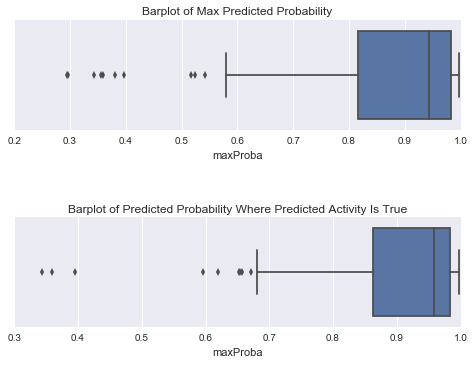

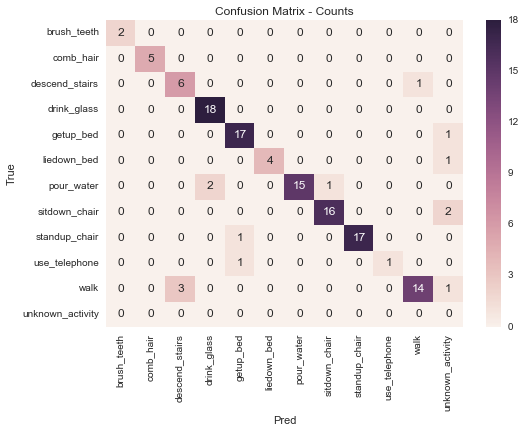

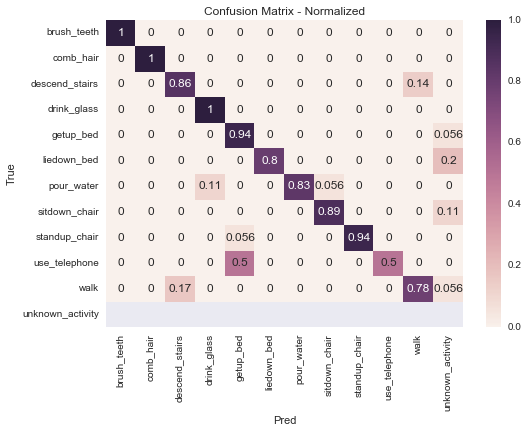


Percent Diff: 0.869565217391  Count: 10


NEW RUN 24 of 92:Duplicate Data with XgboostClassifier being trained using: ['z_mean', 'totTime', 'z_rms', 'x_rms', 'corrXZ', 'x_mean', 'tot_rms', 'ExBX8', 'diffZ', 'tot_mean', 'diffX', 'x_max', 'z_max', 'tot_max', 'bx_rms', 'bx_min', 'corrXY', 'bz_rms', 'ExBX9', 'z_min', 'corrYZ', 'crossXrate', 'ExBY7', 'ExBX6'] features

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:   13.3s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:  1.5min
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:  1.7min finished


Best Params:
{'n_estimators': 500, 'max_depth': 1}
Accuracy of current model: 0.907
Accuracy using best param: 0.875
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=200, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.907
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=500, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.915
The smallest (winning) predicted activity probability is 0.328094
The largest (winning) predicted activity probability is 0.999765

 NB: a winning probabil

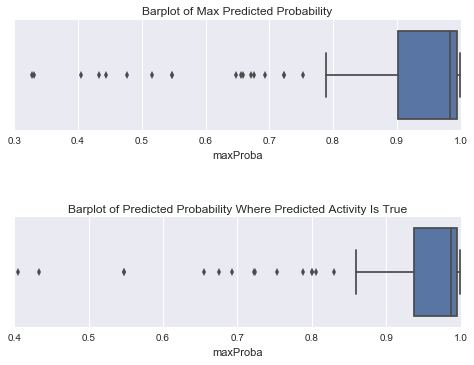

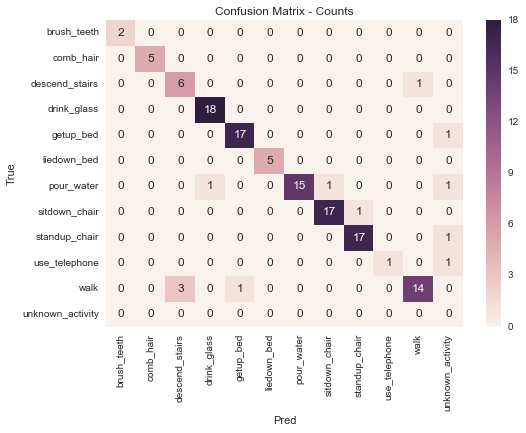

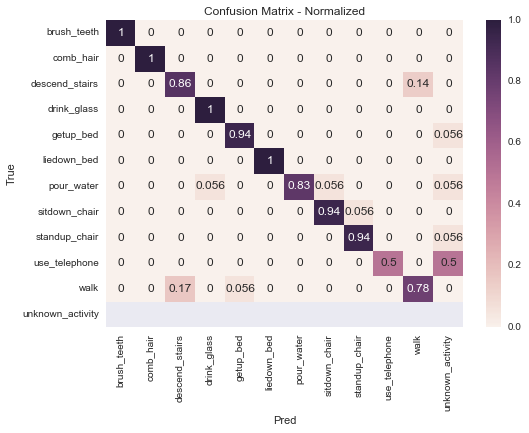


Percent Diff: 1.72413793103  Count: 11
Model improvement has stabilised, ending feature addition process


In [56]:
# Set target variable name

featList = [x[1] for x in list_tuple]
n = [10,20,30,40,50,100,150,200,250,300,400,500]
m = [1,3,5,7,9,11]
params = {'n_estimators': n,'max_depth': m}
evalMetric = "merror"

gbm = xgb.XGBClassifier(n_estimators=20, objective = 'multi:softprob', learning_rate=0.1)

dup_score, dup_precisionDF, dup_recallDF, dup_f1ScoreDF = featureReduction(gbm,le,trainDF,testDF,featList,10,2.5,params,\
                                                           evalMetric,'Duplicate Data with Xgboost')


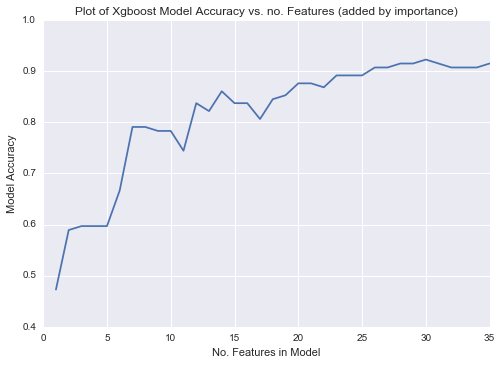

In [57]:
# Produce a plot of model score vs. no. features (added in order of importance)
x=range(1,len(score)+1)
sns.set()
ax = plt.axes()
plt.plot(x,score)
ax.set_ylabel('Model Accuracy')
ax.set_xlabel('No. Features in Model')
plt.title('Plot of Xgboost Model Accuracy vs. no. Features (added by importance)')

In [58]:
# Tranpose the matrices into correct orientation for plotting function
precisionDF = dup_precisionDF.T
recallDF = dup_recallDF.T
f1ScoreDF = dup_f1ScoreDF.T

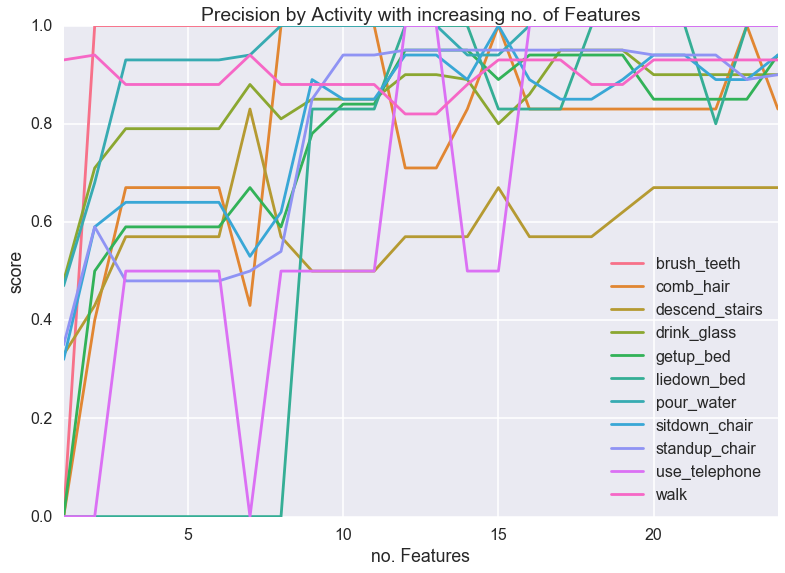

In [59]:
outputMetricsPlot(le,precisionDF,'Precision')

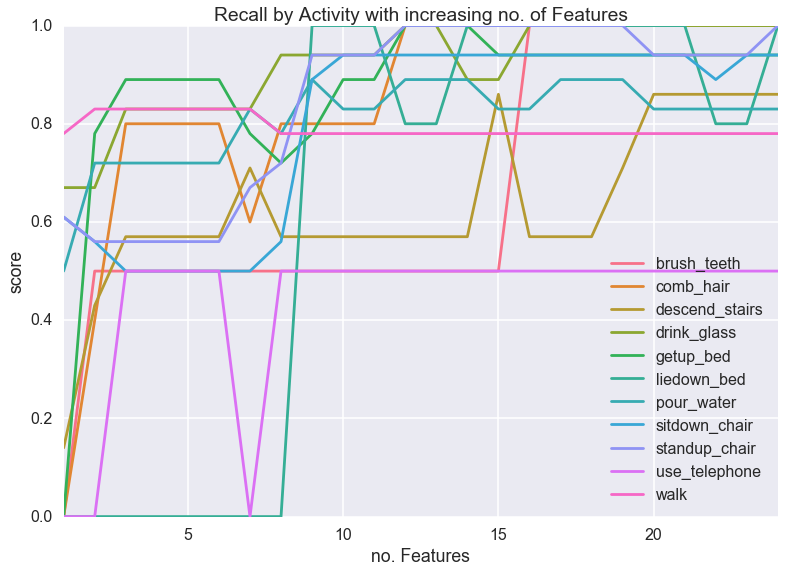

In [60]:
outputMetricsPlot(le,recallDF,'Recall')

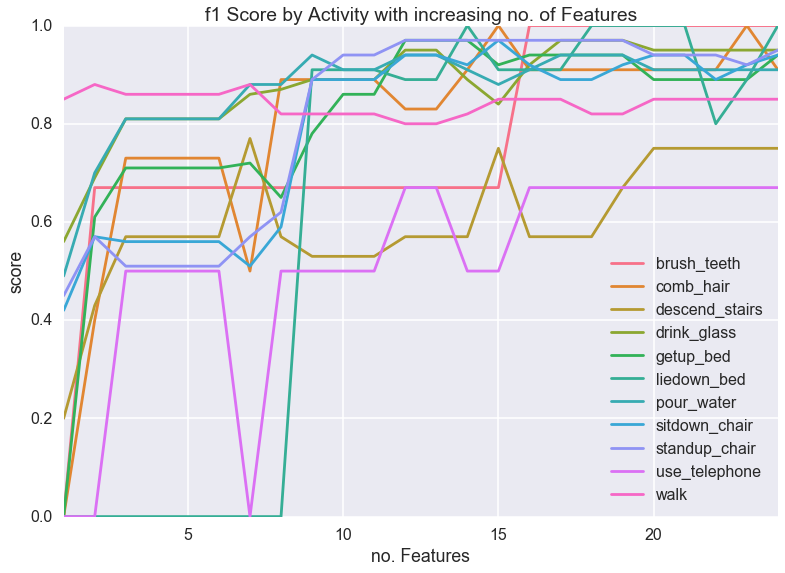

In [61]:
outputMetricsPlot(le,f1ScoreDF,'f1 Score')

Based upon a review of the plots, the first 16 features ranked by importance will be used.  Rebuild the Xgboost classifier with these features and output the review plots and report

In [65]:
features = [featList[x] for x in range(0,26)]
X_train = dupTrainDF[features]
X_test = testDF[features]
gbm = xgb.XGBClassifier(n_estimators=20, objective = 'multi:softprob', learning_rate=0.1)
gbm.fit(X_train, y_train, eval_metric = "merror")
newXGB = optimiseParameters(X_train, y_train, X_test, y_test, gbm, params, 1)

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:   15.9s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:  1.7min
[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:  2.0min finished


Best Params:
{'n_estimators': 150, 'max_depth': 5}
Accuracy of current model: 0.915
Accuracy using best param: 0.917
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=20, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.915
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=150, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.899


The smallest (winning) predicted activity probability is 0.210896
The largest (winning) predicted activity probability is 0.998843

 NB: a winning probability represents the max probability output by the classifier for that input


    maxProba  MaxProbRatio   predActivity     actActivity    outputActivity
20  0.213465      0.255759    liedown_bed   sitdown_chair  unknown_activity
62  0.539279      0.353260           walk  descend_stairs  unknown_activity
73  0.531856      0.156316  use_telephone     drink_glass  unknown_activity
87  0.348841      0.183071     pour_water      pour_water  unknown_activity

Correct Predictions: 						116
No. Incorrect Predictions: 					13
No. Predictions marked as Unknown Activities:			4
No. Incorrect Predictions not marked as Unknown Activites:	10


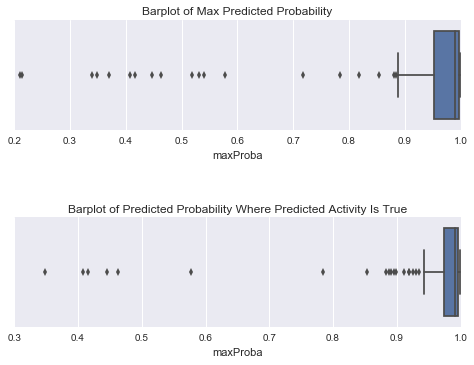

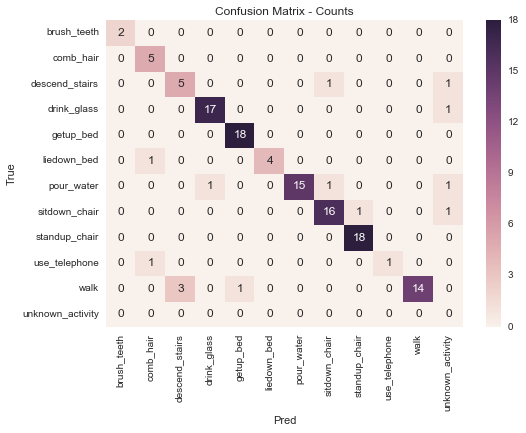

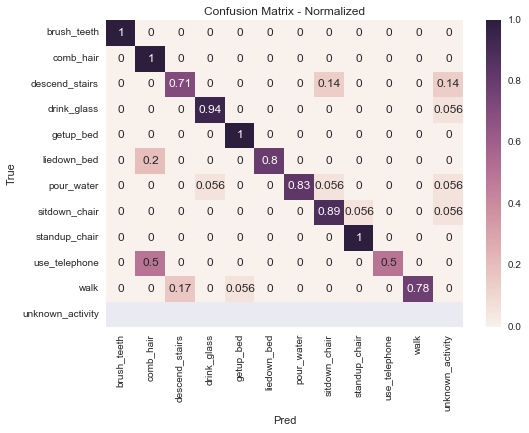

In [66]:
dup_xgb_proba = reviewPredictions(le,newXGB,X_test,y_test,0.6)
y_pred = newXGB.predict(X_test)
createConfusionMatrix(le,y_pred,y_test,cmType = 'modified', probDF = dup_xgb_proba)

dupClassReport = metrics.classification_report(y_test, y_pred, labels=None, target_names=None, sample_weight=None, digits=2)

In [67]:
print dupClassReport

             precision    recall  f1-score   support

        0.0       1.00      1.00      1.00         2
        1.0       0.71      1.00      0.83         5
        2.0       0.62      0.71      0.67         7
        3.0       0.94      0.94      0.94        18
        4.0       0.95      1.00      0.97        18
        5.0       0.80      0.80      0.80         5
        6.0       1.00      0.89      0.94        18
        7.0       0.89      0.89      0.89        18
        8.0       0.95      1.00      0.97        18
        9.0       0.50      0.50      0.50         2
       10.0       0.93      0.78      0.85        18

avg / total       0.91      0.90      0.90       129



## Review the predicted probabilities for the entire dataset for the Xgboost and Random Forest Classifiers

Read in the Master file list, drop eat_meat & eat_soup & pre-process to get a Master Features Dataframe

In [68]:
Master = pd.read_csv(master_file_loc)
print Master.count()
Master = Master.drop(['eat_meat','eat_soup'],axis=1)
print Master.count()
masterList = createDataList(Master)

standup_chair     102
sitdown_chair     100
comb_hair          31
walk              100
descend_stairs     42
drink_glass       100
eat_meat            5
eat_soup            3
pour_water        100
liedown_bed        28
getup_bed         101
use_telephone      13
brush_teeth        12
dtype: int64
standup_chair     102
sitdown_chair     100
comb_hair          31
walk              100
descend_stairs     42
drink_glass       100
pour_water        100
liedown_bed        28
getup_bed         101
use_telephone      13
brush_teeth        12
dtype: int64


In [69]:
masterFeaturesDF = createFeatures(masterList)

# The features dataframe has been initialised as all objects whereas all
# columns other than activity should be float.  Convert to correct data type
# so can create plots in exploratory analysis
col_names = masterFeaturesDF.columns
col_names = col_names[0:(len(col_names)-1)]  # drop activity from col_names
masterFeaturesDF[col_names] = masterFeaturesDF[col_names].astype(float)
masterFeaturesDF.activity = masterFeaturesDF.activity.astype(str)
masterDF = masterFeaturesDF.copy()
masterDF['activity'] = le.transform(masterDF['activity'])

Proceesing row: 729 of 729

#### Optimised Random Forest Classifier using the full dataset and all features 

Create X_test and y_test from the master features dataframe that has had the activities encoded

In [70]:
# Set target variable name
target = ['activity']

# Set X and y
X_test = masterDF.drop(target,axis=1)
y_test = np.array(masterDF[target].astype(float))
y_test = np.reshape(y_test,[len(y_test),])

Create a dataframe of predictions for the entire dataset using the Random Forest classifier with a 60% addaptive prediction threshold and review the predictions

The smallest (winning) predicted activity probability is 0.320048251915
The largest (winning) predicted activity probability is 1.0

 NB: a winning probability represents the max probability output by the classifier for that input


     maxProba  MaxProbRatio    predActivity     actActivity    outputActivity
66   0.503071      0.136027   standup_chair   standup_chair  unknown_activity
69   0.556861      0.473008   standup_chair   standup_chair  unknown_activity
77   0.534765      0.371757   standup_chair   standup_chair  unknown_activity
86   0.481325      0.276437   standup_chair   standup_chair  unknown_activity
101  0.496742      0.044368       getup_bed   standup_chair  unknown_activity
186  0.374658      0.202833   sitdown_chair   sitdown_chair  unknown_activity
188  0.376754      0.072334       getup_bed   sitdown_chair  unknown_activity
253  0.320048      0.194331       getup_bed            walk  unknown_activity
255  0.520557      0.223320            walk            walk  unkn

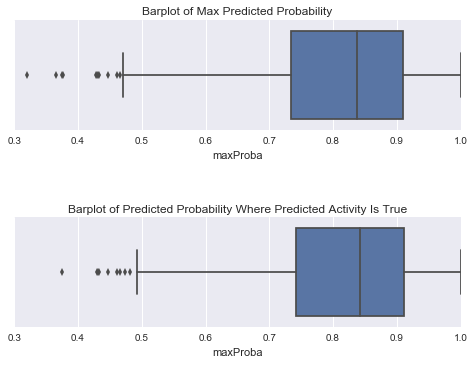

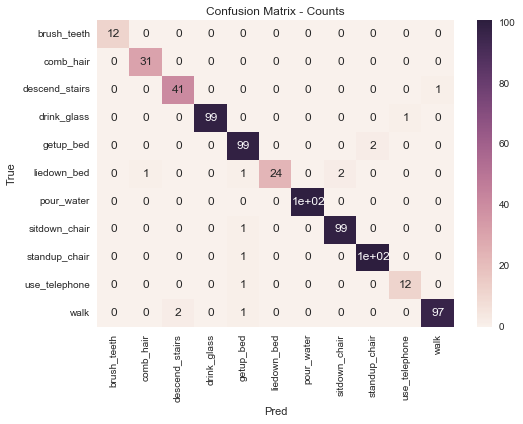

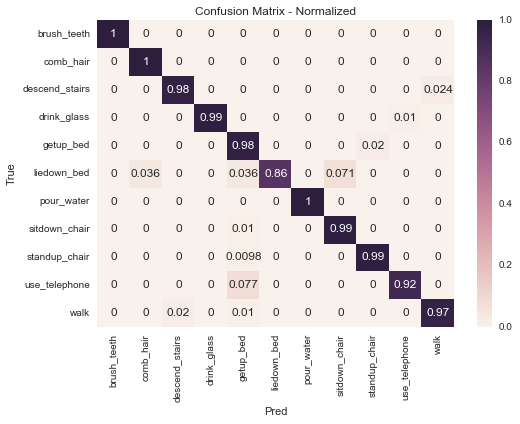



Applying confidence threshold and classifying all below as unknown_activity


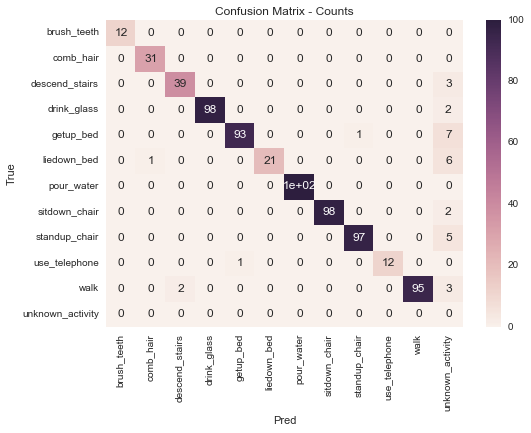

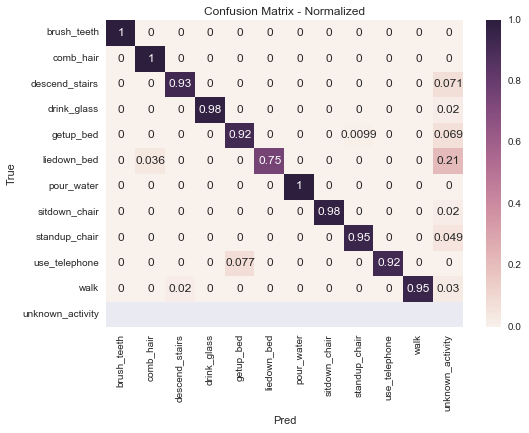

In [71]:
full_ovr_proba = reviewPredictions(le,revMod,X_test,y_test,0.6)

# Use the already optimised classifier to predict all X_test values
y_pred = revMod.predict(X_test)

# Create an absolute and normalized confusion matrix
createConfusionMatrix(le,y_pred,y_test)
print "\n\nApplying confidence threshold and classifying all below as unknown_activity"
createConfusionMatrix(le,y_pred,y_test,cmType = 'modified', probDF = full_ovr_proba)

Plot the max probability output by the classifier by predicted activity, grouped by whether it was correct or incorrect.

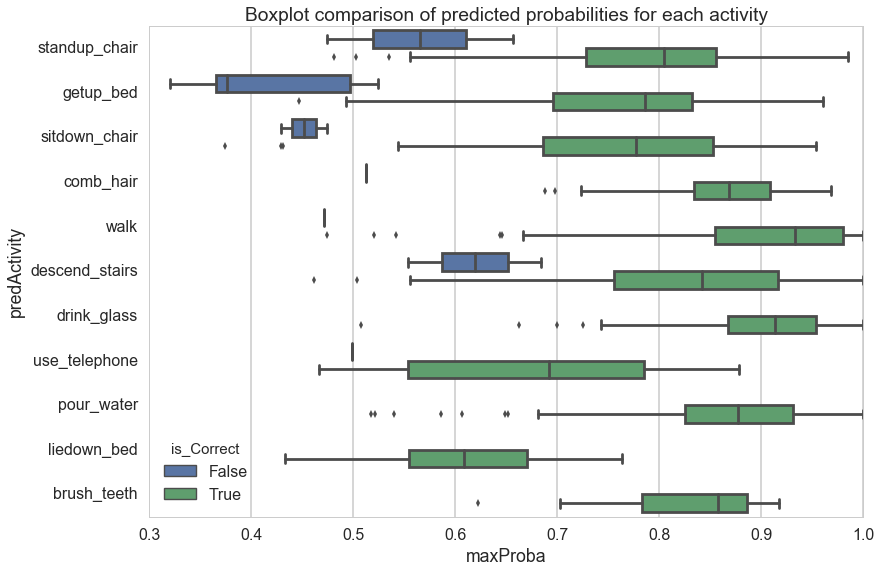

In [72]:
sns.set()
sns.set_style("whitegrid")
sns.set_context("poster", font_scale=1)
sns.boxplot(y="predActivity", x="maxProba", hue="is_Correct", data=full_ovr_proba)
plt.title('Boxplot comparison of predicted probabilities for each activity')
plt.savefig('is_Correct_Prediction-OVR-BP.png')

Repeat the plot as a swarm plot

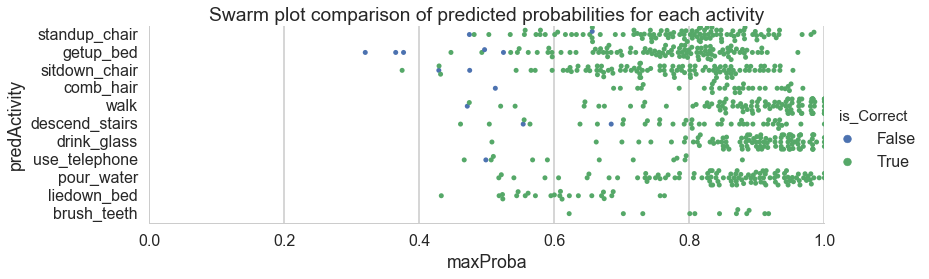

In [73]:
sns.set()
sns.set_style("whitegrid")
sns.set_context("poster", font_scale=1)
plot = sns.factorplot(y="predActivity", x="maxProba", hue="is_Correct", data=full_ovr_proba, kind = "swarm",\
                      aspect = 3,sharex=False)
axes = plot.axes
axes[0,0].set_xlim(0,1.0)
plt.title('Swarm plot comparison of predicted probabilities for each activity')
plt.savefig('is_Corect_Prediction-OVR-Sw.png')

#### Optimised Xgboost using the reduced feature set

In [74]:
# Set target variable name
target = ['activity']

# Set X and y
X_test = masterDF[features]
y_test = np.array(masterDF[target].astype(float))
y_test = np.reshape(y_test,[len(y_test),])

The smallest (winning) predicted activity probability is 0.148906
The largest (winning) predicted activity probability is 0.998947

 NB: a winning probability represents the max probability output by the classifier for that input


     maxProba  MaxProbRatio   predActivity     actActivity    outputActivity
186  0.213465      0.255759    liedown_bed   sitdown_chair  unknown_activity
335  0.539279      0.353260           walk  descend_stairs  unknown_activity
389  0.531856      0.156316  use_telephone     drink_glass  unknown_activity
527  0.148906      0.145176    drink_glass      pour_water  unknown_activity
570  0.348841      0.183071     pour_water      pour_water  unknown_activity
603  0.197276      0.081985      getup_bed       getup_bed  unknown_activity
628  0.465033      0.000416  standup_chair       getup_bed  unknown_activity

Correct Predictions: 						709
No. Incorrect Predictions: 					20
No. Predictions marked as Unknown Activities:			7
No. Incorrect Predictions not marke

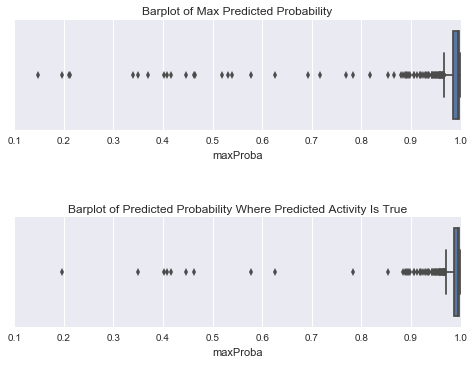

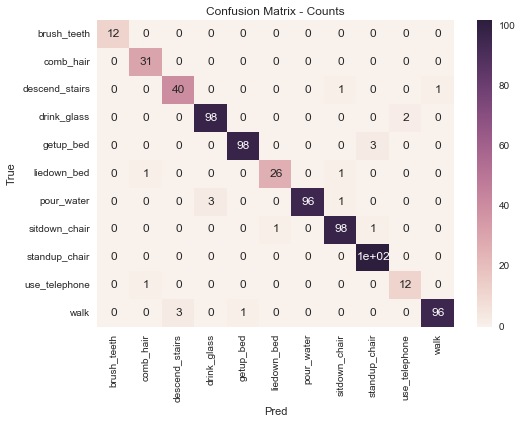

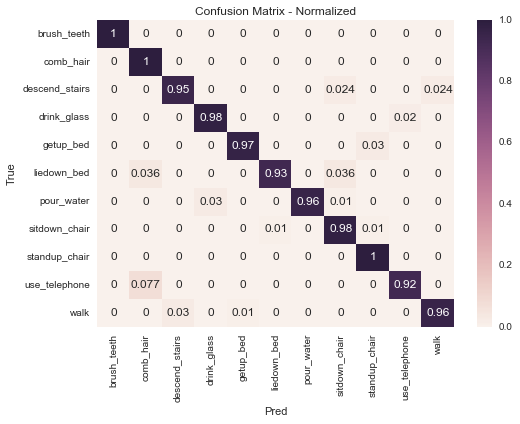



Applying confidence threshold and classifying all below as unknown_activity


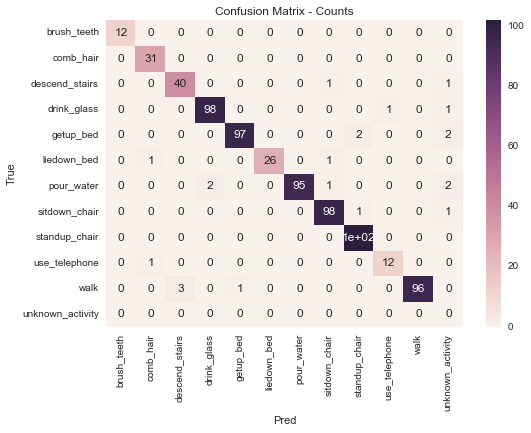

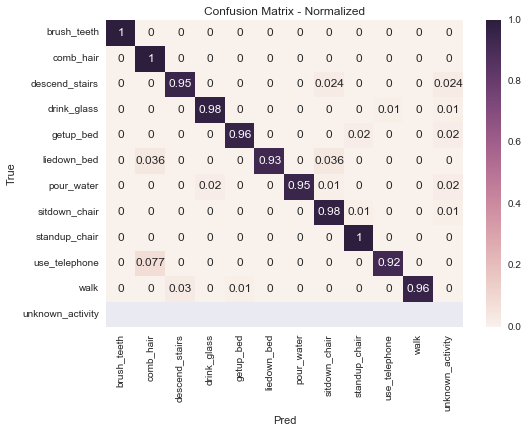

In [75]:
full_xgb_proba = reviewPredictions(le,newXGB,X_test,y_test,0.6)
y_pred = newXGB.predict(X_test)
createConfusionMatrix(le,y_pred,y_test)
print "\n\nApplying confidence threshold and classifying all below as unknown_activity"
createConfusionMatrix(le,y_pred,y_test,cmType = 'modified', probDF = full_xgb_proba)

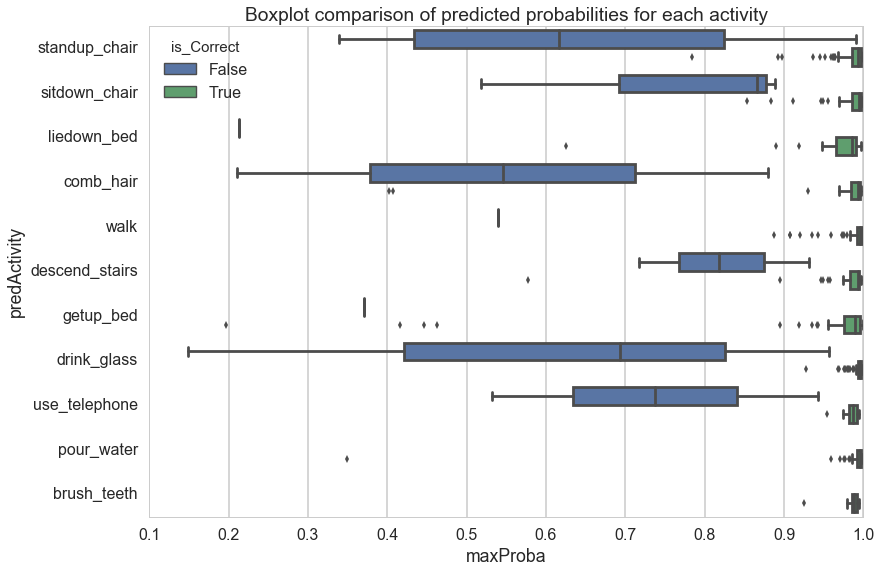

In [76]:
sns.set()
sns.set_style("whitegrid")
sns.set_context("poster", font_scale=1)
sns.boxplot(y="predActivity", x="maxProba", hue="is_Correct", data=full_xgb_proba)
plt.title('Boxplot comparison of predicted probabilities for each activity')
plt.savefig('is_Correct_Prediction-xgb-BP.png')

Repeat the plot as a swarm plot

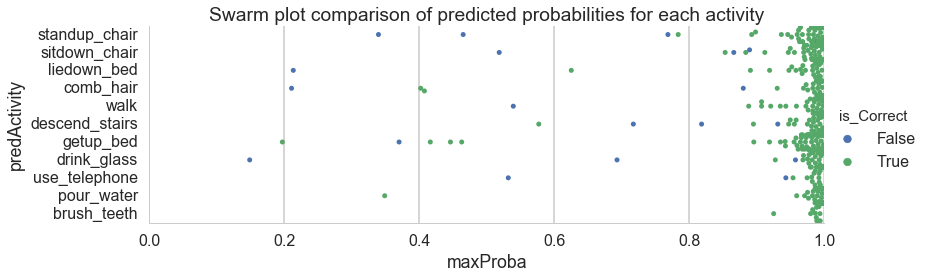

In [77]:
sns.set()
sns.set_style("whitegrid")
sns.set_context("poster", font_scale=1)
plot = sns.factorplot(y="predActivity", x="maxProba", hue="is_Correct", data=full_xgb_proba, kind = "swarm",\
                      aspect = 3,sharex=False)
axes = plot.axes
axes[0,0].set_xlim(0,1.0)
plt.title('Swarm plot comparison of predicted probabilities for each activity')
plt.savefig('is_Corect_Prediction-xgb-Sw.png')

### Re-run Xgboost with full dataset and all features

Setup the X_train, X_test, y_train, y_test dataframes

In [78]:
# Set target variable name
target = ['activity']

# Set X and y
X_train = trainDF.drop(target, axis=1)
y_train = np.array(trainDF[target].astype(float))
y_train = np.reshape(y_train,[len(y_train),])
X_test = testDF.drop(target, axis=1)
y_test = np.array(testDF[target].astype(float))
y_test = np.reshape(y_test,[len(y_test),])

In [79]:
gbm = xgb.XGBClassifier(n_estimators=20, objective = 'multi:softprob', learning_rate=0.1)
gbm.fit(X_train, y_train, eval_metric = "merror")

XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=20, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)

Review results of model and confusion matrices

The smallest (winning) predicted activity probability is 0.103854
The largest (winning) predicted activity probability is 0.818338

 NB: a winning probability represents the max probability output by the classifier for that input


     maxProba  MaxProbRatio   predActivity    actActivity    outputActivity
11   0.421553      0.411062  standup_chair  standup_chair  unknown_activity
12   0.379606      0.305356  standup_chair  standup_chair  unknown_activity
13   0.442982      0.363560  standup_chair  standup_chair  unknown_activity
20   0.266101      0.333256    liedown_bed  sitdown_chair  unknown_activity
33   0.122427      0.126288           walk  sitdown_chair  unknown_activity
44   0.103854      0.149237  standup_chair           walk  unknown_activity
45   0.195750      0.111978  standup_chair           walk  unknown_activity
87   0.105292      0.074942     pour_water     pour_water  unknown_activity
104  0.353082      0.032318    liedown_bed    liedown_bed  unknown_activity
114  0.1

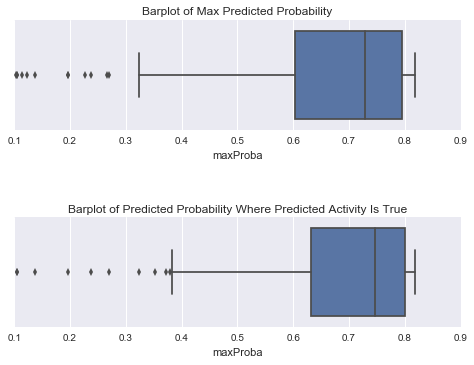

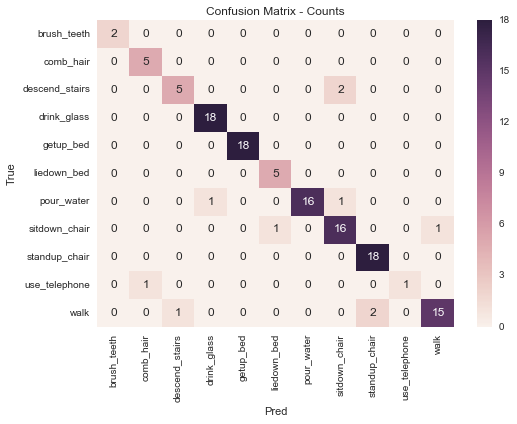

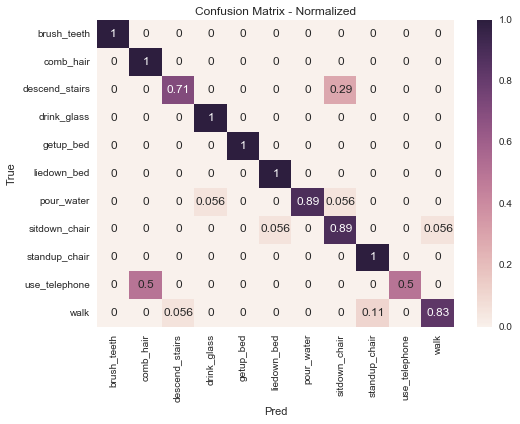



Applying confidence threshold and classifying all below as unknown_activity


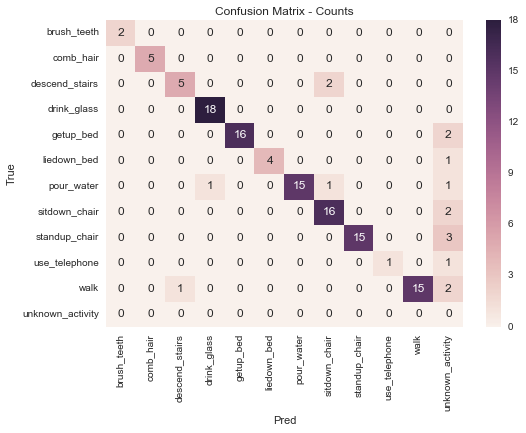

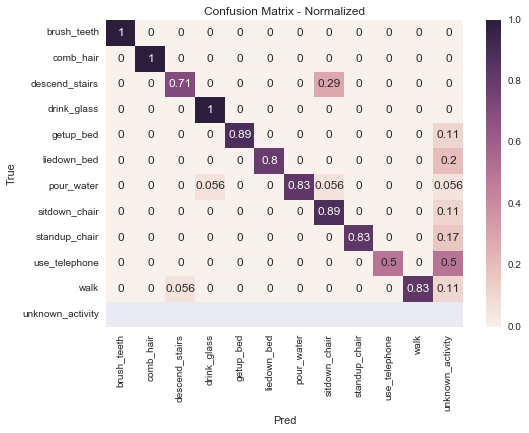

In [80]:
xgb_proba = reviewPredictions(le,gbm,X_test,y_test,0.6)
y_pred = gbm.predict(X_test)
createConfusionMatrix(le,y_pred,y_test)
print "\n\nApplying confidence threshold and classifying all below as unknown_activity"
createConfusionMatrix(le,y_pred,y_test,cmType = 'modified', probDF = xgb_proba)

Use a gridsearch to optimise no. estimators and max depth hyperparameters

In [81]:
# Set list of values to grid search over
n = [10,20,30,40,50,100,150,200,250,300,400,500,600]
m = [1,3,5,7,9,11]

params = {'n_estimators': n,'max_depth': m}

newXGB = optimiseParameters(X_train, y_train, X_test, y_test, gbm, params, 1)

Fitting 3 folds for each of 78 candidates, totalling 234 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:   42.3s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:  4.6min
[Parallel(n_jobs=1)]: Done 234 out of 234 | elapsed:  5.5min finished


Best Params:
{'n_estimators': 400, 'max_depth': 5}
Accuracy of current model: 0.922
Accuracy using best param: 0.894
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=20, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of current model: 0.922
XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=400, nthread=-1,
       objective='multi:softprob', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)
Accuracy of updated model: 0.922


Now use the full dataset to test

In [82]:
# Set target variable name
target = ['activity']

# Set X and y
X_test = masterDF.drop(target,axis=1)
y_test = np.array(masterDF[target].astype(float))
y_test = np.reshape(y_test,[len(y_test),])

Review results of model and confusion matrices

The smallest (winning) predicted activity probability is 0.124472
The largest (winning) predicted activity probability is 0.999604

 NB: a winning probability represents the max probability output by the classifier for that input


     maxProba  MaxProbRatio    predActivity     actActivity    outputActivity
186  0.256742      0.001429     liedown_bed   sitdown_chair  unknown_activity
188  0.206971      0.038755   standup_chair   sitdown_chair  unknown_activity
253  0.167382      0.140168  descend_stairs            walk  unknown_activity
373  0.565129      0.466340   sitdown_chair  descend_stairs  unknown_activity
527  0.124472      0.027921      pour_water      pour_water  unknown_activity
570  0.338459      0.037543      pour_water      pour_water  unknown_activity
603  0.187549      0.326993   standup_chair       getup_bed  unknown_activity
628  0.565466      0.330709   standup_chair       getup_bed  unknown_activity
713  0.157642      0.021501            walk   use_telephone  unkno

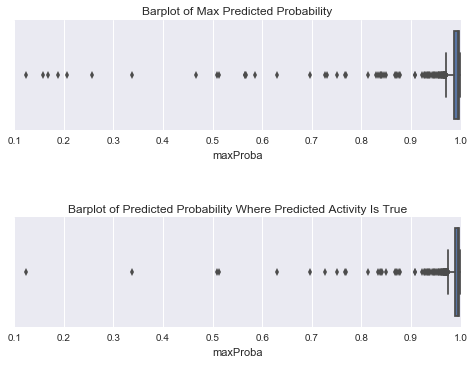

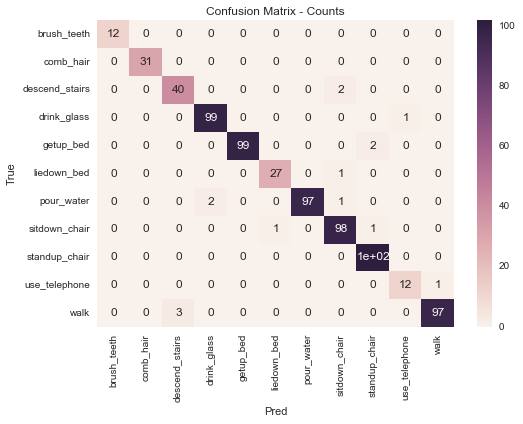

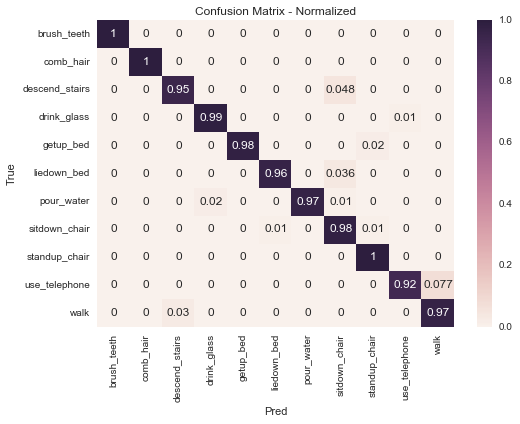



Applying confidence threshold and classifying all below as unknown_activity


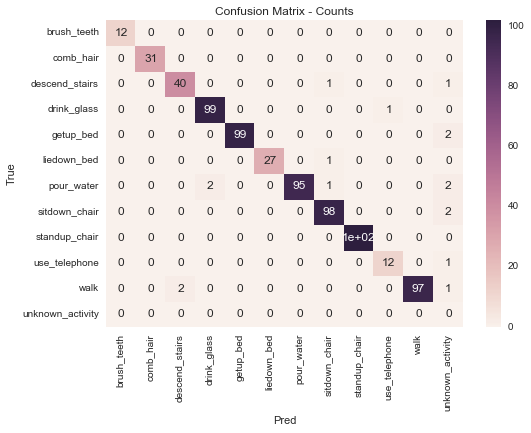

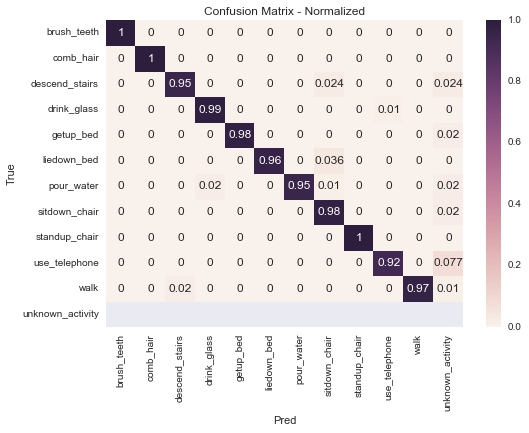

In [83]:
master_proba = reviewPredictions(le,newXGB,X_test,y_test,0.6)
y_pred = newXGB.predict(X_test)
createConfusionMatrix(le,y_pred,y_test)
print "\n\nApplying confidence threshold and classifying all below as unknown_activity"
createConfusionMatrix(le,y_pred,y_test,cmType = 'modified', probDF = master_proba)

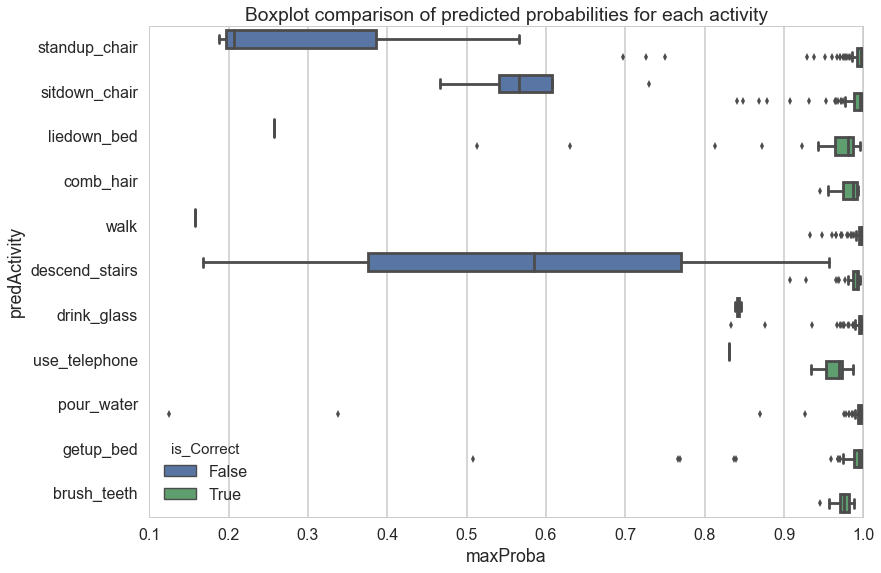

In [84]:
sns.set()
sns.set_style("whitegrid")
sns.set_context("poster", font_scale=1)
sns.boxplot(y="predActivity", x="maxProba", hue="is_Correct", data=master_proba)
plt.title('Boxplot comparison of predicted probabilities for each activity')
plt.savefig('is_Correct_Prediction-full-xgb-BP.png')

Repeat the plot as a swarm plot

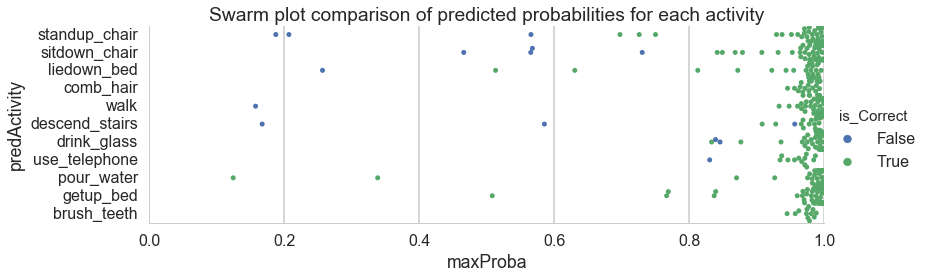

In [85]:
sns.set()
sns.set_style("whitegrid")
sns.set_context("poster", font_scale=1)
plot = sns.factorplot(y="predActivity", x="maxProba", hue="is_Correct", data=master_proba, kind = "swarm",\
                      aspect = 3,sharex=False)
axes = plot.axes
axes[0,0].set_xlim(0,1.0)
plt.title('Swarm plot comparison of predicted probabilities for each activity')
plt.savefig('is_Corect_Prediction-full-xgb-Sw.png')